# Plots from Physics of Plasmas Paper *Two methods to analyse radial diffusion ensembles: the peril of space- and time- dependent diffusion*

Files needed:
* ensemble_functions.py
* monotonic\_times\_X\_X.nc files

Optional files:
* .csv files so that you can plot the results rather than running simulations for the other plots.

To set up:
* Upload files


In [ ]:
# Set up
import numpy as np
from matplotlib import pyplot as plt
import math

#!pip install --upgrade xarray
import xarray as xr

#import warnings
#warnings.filterwarnings("ignore")
import argparse
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.animation import FuncAnimation
import matplotlib.ticker as tkr
import pandas as pd
import seaborn as sns
from ensemble_functions import PSD, Diff_Coeff, Crank_Nicolson, LossRate


fsize = 26 # 20 #18
fsize_leg = 20 #16 #14
matplotlib.rcParams.update({'font.size': fsize,'font.family':'serif',
                            "text.usetex": False,'legend.fontsize': fsize_leg})


!mkdir figs
!mkdir csv-outputs

# Setup
Set up functions needed for plotting later.

In [ ]:
def reset_fonts(style='default'):
    global fsize
    global fsize_leg

    if style == 'default':
        fsize = 26
        fsize_leg = 20
        matplotlib.rcParams.update({'font.size': fsize,'font.family':'serif',
                                    'legend.fontsize': fsize_leg})
    elif style == 'mass-energy':
        fsize = 20 #18
        fsize_leg = 16 #14
        matplotlib.rcParams.update({'font.size': fsize,'font.family':'sans-serif',
                            'legend.fontsize': fsize_leg})

    return #fsize, fsize_leg

reset_fonts()

In [ ]:
def plot_mtime_par_vs_kp(da,ystring,titlestring,savestring):
    # extract times to monotonicty in hours
    #mtimes = np.round(da.__xarray_dataarray_variable__.values/3600,2).transpose()
    mtimes = (da.__xarray_dataarray_variable__.values/3600).transpose()
    kp_values = da.coords['kp'].values
    par_values = np.round(da.coords['par'].values,2)

    if ystring == 'Initial $A$ value':
        par_values_list = [f'{float(f"{i:.1g}"):g}' for i in par_values]
        par_values = np.array( par_values_list )
    elif ystring == 'Initial $\log_{10}{A}$':
        par_values = np.log10(da.coords['par'].values)
        par_values_list = [f'{float(f"{i:.2g}"):g}' for i in par_values]
        par_values = np.array( par_values_list )

    cbar_ticks = [1,50,100,150]

    formatter = tkr.ScalarFormatter(useMathText=True)
    formatter.set_scientific(False)
    cmap = sns.cubehelix_palette(8, as_cmap=True, reverse=True)
    fig, ax = plt.subplots(figsize = (7,5))
    if ystring == '$L_{outer}$':
        #sns.heatmap(mtimes, yticklabels = par_values, cmap = cmap, vmin = 0, vmax = 168,cbar_kws={'label': 'hours to monotonicity'}
        sns.heatmap(mtimes, yticklabels = par_values, norm=LogNorm(vmin = 1, vmax = 168),vmin = 0, vmax = 168,cmap = cmap,cbar_kws={'label': '$t_m$, hours','ticks':[1,10,50,100,150],'format':formatter})
        ax.collections[0].colorbar.ax.yaxis.set_ticks([], minor=True)
    else:

        sns.heatmap(mtimes,xticklabels = kp_values, yticklabels = par_values, norm=LogNorm(vmin = 1, vmax = 168),vmin = 0, vmax = 168,cmap = cmap,cbar_kws={'label': '$t_m$, hours','ticks':[1,10,50,100,150],'format':formatter})
        ax.collections[0].colorbar.ax.yaxis.set_ticks([], minor=True)
        #cax = ax.collections[0].colorbar.ax.yaxis
        #cax.set_ticks([1,50,100,150])

    plt.xlabel('Kp values')
    plt.ylabel(ystring)
    #plt.title(titlestring)

    ax = plt.gca()
    ax.tick_params(axis='y', labelrotation=0)

    if (ystring == 'Initial $B$') | (ystring == 'Initial $\log_{10}{A}$'):

        for label in ax.yaxis.get_ticklabels()[1:-1:2]:
            label.set_visible(False)


    plt.savefig('figs/'+savestring, dpi = 600,bbox_inches='tight')

    return fig, ax

In [ ]:
# Run the model once , defaults from a run of Kp=4, L_outer=6.5
def single_run(PSDkwargs , **runkwargs):

    # default values (yes weird method cause function in fn)
    L_outer = runkwargs.get('L_outer',6.5) # ugh I made a mistake, the deafult should be 6!!! Oh well. Too late to rerun EVERYTHING
    kp = runkwargs.get('kp',4)
    rtype = runkwargs.get('rtype','n')
    losstype = runkwargs.get('loss',None)

    diff_coeffs = runkwargs.get('diffcoeffs','Ozeke')
    Lp = runkwargs.get('Lp',5)


    dl= 0.1
    dt = runkwargs.get('dt',1) # this should be 1s, not 10s, as in the main ensembles. Changed 26th july to match
    nt = runkwargs.get('nt',int(3600*24*7/dt))
    f_return = runkwargs.get('f_return',6*60*60/dt) # every six hours, in seconds
    L = np.round(np.arange(2.5,L_outer,dl),3)
    D = [Diff_Coeff(L,kp,full=False,method=diff_coeffs)/86400]*int(nt+1) #note conversion to seconds
    Q = [np.zeros(len(L))]*int(nt+1)
    f = PSD(L,**PSDkwargs); f[0]=0
    #print( np.max(f))

    # sort out boundary conditions
    rbc = [0]*nt
    if rtype == 'd':
        rbc = None

    final_psd, psd_array = Crank_Nicolson(dt,nt,dl,L,f,D,Q,lbc=None,rbc=rbc,
                                          rtype=rtype,ltype='d',
                                          f_return=int(f_return),
                                          loss=losstype,plasmapause=Lp)



    return psd_array, L, D

In [ ]:
def non_increasing(L):
    return all(x>=y for x, y in zip(L, L[1:]))

def non_decreasing(L):
    return all(x<=y for x, y in zip(L, L[1:]))

def monotonic(L):
    return non_increasing(L) or non_decreasing(L)


In [ ]:
# print end results of two runs
def plot_two_runs( PSDdict1, PSDdict2, rundict1, rundict2 ):
    psd_array_1, L_1 = single_run( PSDdict1, **rundict1 )
    psd_array_2, L_2 = single_run( PSDdict2, **rundict2 )

    fig, ax = plt.subplots(1,2,figsize=(12,6))
    # plot 1 -  the initial PSDs
    ax[0].plot(L_1,psd_array_1[0][:])
    ax[0].plot(L_2,psd_array_2[0][:])
    ax[0].set_ylabel('PSD')
    ax[0].set_xlabel('L')
    ax[0].set_ylim([0,100000])

    # plot 2 - the final psds
    ax[1].plot(L_1,psd_array_1[-1][:])
    ax[1].plot(L_2,psd_array_2[-1][:])
    ax[1].set_xlabel('L')
    ax[1].set_ylim([0,100000])

    # Check functions
    print(monotonic(psd_array_1[-1]))
    print(monotonic(psd_array_2[-1]))

    return fig, ax

In [ ]:
# Now plot a few snapshots/cutthroughs on the way
def plot_cutthroughs( fig, ax, psd_array, L, num_cutthroughs=8 ):

    num_cutthroughs = num_cutthroughs+1 # have to add the one to make it up, ugh
    cutthrough_inds = np.round(np.linspace(0,np.array(psd_array).shape[0], num_cutthroughs )).astype(int)

    #fig, ax = plt.subplots()

    cols = sns.color_palette("mako", n_colors=num_cutthroughs)

    cutthroughs = np.full([num_cutthroughs-1,np.array(psd_array).shape[1]],np.nan)

    labels = []

    for i in np.arange(0, num_cutthroughs-1).astype(int):
        ax.plot( L, psd_array[cutthrough_inds[i]][:], color=cols[i] )
        cutthroughs[i,:] = psd_array[cutthrough_inds[i]][:]
        labels.append(str(cutthrough_inds[i]*6)+' hours')


    return cutthroughs, labels #fig, ax

In [ ]:
# plot time to monotonicity for each kp
def plot_tm_cutthroughs( fig, ax, da, xlabel, savestring ):


    matplotlib.rcParams.update({'font.size': 22})

    #mtimes = np.round(da.__xarray_dataarray_variable__.values/3600,2)#.transpose()
    mtimes = (da.__xarray_dataarray_variable__.values/3600)
    kp_values = da.coords['kp'].values
    par_values = np.round(da.coords['par'].values,2)

    # get the colourmap used in other pots
    # remember this usually runs from 0 to 168 NO - NOW LOGGED
    # This usually runs from log10(1) to log10(168)
    cmap = sns.cubehelix_palette(8, as_cmap=True, reverse=True)


    if xlabel == '$\log_{10}{A}$':
        par_values = np.log10(da.coords['par'].values)
        par_values_list = [f'{float(f"{i:.2g}"):g}' for i in par_values]
        par_values = np.array( par_values_list )


    for i in range(len(kp_values)):

        if not np.all(np.isnan(mtimes[i][:])):
            ax.plot( par_values, mtimes[i][:], label='Kp='+str(kp_values[i]),
                color='k',linewidth=1,linestyle='dashed' )

            # do a marker for each
            for j in range(len(par_values)):
                if not math.isnan(mtimes[i][j]):
                    this_col = cmap(np.log10(mtimes[i][j])/(np.log10(168)-np.log10(1)))
                    ax.plot(par_values[j],mtimes[i][j],marker="o",fillstyle="full",
                        markerfacecolor=this_col, markeredgecolor=this_col,markersize=12)


        # if you want to check against endpoints for Dirichlet version
        #if not math.isnan(mtimes[i][-1]):
        #   ax.plot(Louter_values[[0,-1]],mtimes[i][-1]*np.array([1 ,1]),'k',linestyle='dashed',linewidth=1)


    if xlabel == '$\log_{10}{A}$':
        ax.tick_params(axis='x', labelrotation=-45)

        for label in ax.xaxis.get_ticklabels()[1:-1:2]:
            label.set_visible(False)

    #ax.legend()
    #ax.set_ylim([np.log10(1),np.log10(168)])
    ax.set_xlabel(xlabel)
    ax.set_ylabel('$t_m$, hours')
    ax.set_yscale(('log'))
    ax.set_yticks([1,10,50,100,150],labels=['1','10','50','100','150'])
    ax.set_ylim([1,168])


    plt.savefig('figs/'+savestring, dpi = 600,bbox_inches='tight')

    reset_fonts()

    return


# Initial condition examples


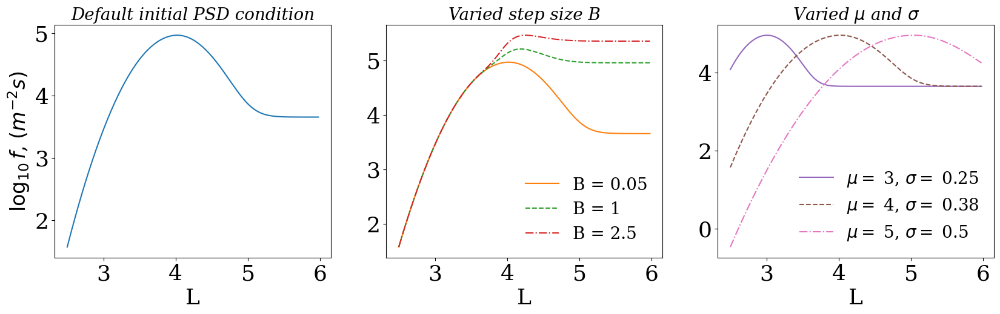

In [ ]:
# Make PSD plots
#@title


# a three panel plot, so bigger fonts
matplotlib.rcParams.update({'font.size': 26})
matplotlib.rcParams.update({'legend.fontsize': 20})


L = np.arange(2.5,6,0.025)

fig, ax = plt.subplots(1,3,figsize=(20,5))


cmap = plt.get_cmap("tab10")
cmap_count = 0

def next_col():
    global cmap_count

    out_col = cmap(cmap_count)
    cmap_count = cmap_count+1
    return out_col



ax[0].plot(L,np.log10(PSD(L)),color=next_col())

ax[0].set_xlabel('L')
ax[0].set_ylabel('$\log_{10}{f}$, $(m^{-2}s)$',fontsize = 24)

#ax[0].text(3,5.5,'Default initial condition.',fontsize = 18,fontstyle='italic')
ax[0].set_title('Default initial PSD condition',fontsize = 20,fontstyle='italic')


Bs = [0.05,1,2.5];
lines = ['solid','dashed','dashdot']
for (B,ls) in zip(Bs,lines):
  ax[1].plot(L,np.log10(PSD(L,B=B)),color=next_col(),linestyle=ls)


ax[1].set_xlabel('L')
ax[1].legend(['B = '+str(B) for B in Bs],frameon=False)
ax[1].set_title('Varied step size B',fontsize = 20,fontstyle='italic')




leg_text =[]
mus = [3,4,5];
sigs = [0.25,0.38,0.5];
for (mu,sig,ls) in zip(mus,sigs,lines):
  ax[2].plot(L,np.log10(PSD(L,mu=mu,sig=sig)),color=next_col(),linestyle=ls)
  str1 = '$\mu =$ '+str(mu)
  str2 = ', $\sigma =$ '+str(sig)

  leg_text = leg_text + [str1+str2]





ax[2].set_xlabel('L')
ax[2].legend(leg_text,frameon=False)
ax[2].set_title('Varied $\mu$ and $\sigma$',fontsize = 20,fontstyle='italic')



#ax[0].set_ylim([1.4,5.8])
#ax[1].set_ylim([1.4,5.8])
#ax[2].set_ylim([1.4,5.8])

fig.savefig('figs/exampleICs.pdf', bbox_inches='tight')

reset_fonts()


# Example distributions

Background radiation first. Put in a distribution with no bump and run for a few days.

In [ ]:
# # Make a simple example
# psd_array_background, L_N,D_N = single_run({'sig':80},**{'nt':3600*24,'kp':7})

# # Make a simple example, same but loss
# psd_array_background_LR, L_N,D_N = single_run({'sig':80},**{'nt':3600*24,'kp':7,'loss':'Shprits2007-eq4'})

# # save these
# np.savetxt("csv-outputs/psd_array_background.csv",np.array(psd_array_background),delimiter=",")
# np.savetxt("csv-outputs/psd_array_background_LR.csv",np.array(psd_array_background_LR),delimiter=",")

In [ ]:
# read them in

df = pd.read_csv('psd_array_background.csv', sep=',', header=None)
psd_array_background = df.values
df = pd.read_csv('psd_array_background_D.csv', sep=',', header=None)
psd_array_background_D = df.values
df = pd.read_csv('psd_array_background_N.csv', sep=',', header=None)
psd_array_background_N = df.values
df = pd.read_csv('psd_array_background_LR.csv', sep=',', header=None)
psd_array_background_LR = df.values

<ipython-input-55-5ea02cc1e748>:14: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax1.plot(L_N,np.log10(dist),'k--',label='Enhancement',linewidth=3,color='steelblue')
<ipython-input-55-5ea02cc1e748>:18: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  ax1.plot(L_N,np.log10(dist),'k',label ='Background',linewidth=3,color='steelblue')
<ipython-input-55-5ea02cc1e748>:40: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  ax2.plot(L_N,np.log10(dist),'k',label='$f_{in}=f_{out}$',linewidth=3,color='steelblue')
<ipython-input-55-5ea02cc1e748>:43: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "

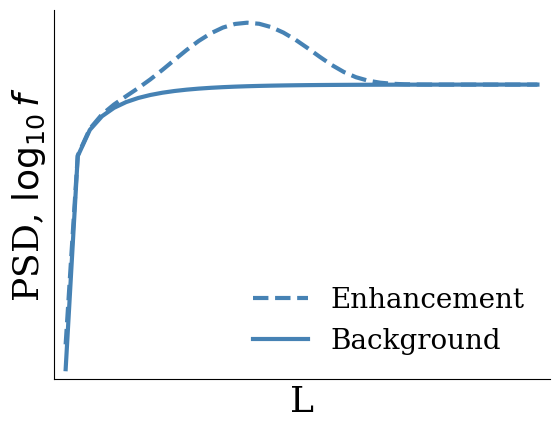

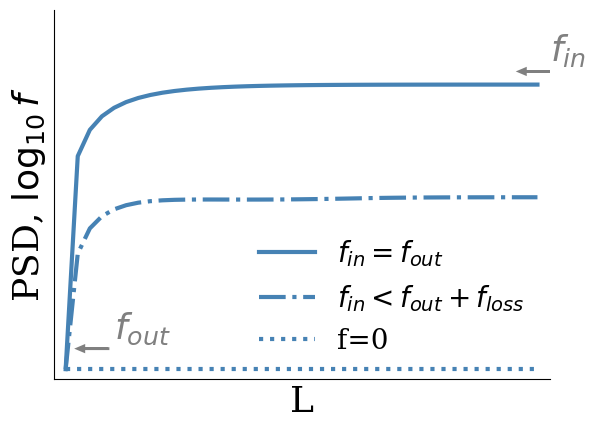

In [ ]:


# a three panel plot, so bigger fonts
#matplotlib.rcParams.update({'font.size': 24})
#matplotlib.rcParams.update({'legend.fontsize': fsize})


fig1, ax1 = plt.subplots()

A=9*10**4
B=0.05
mu=4
sig=0.38

dist = psd_array_background[-1][:]+A*2*np.exp(-np.divide(np.power(L_N-mu,2),(2*sig**2)))
ax1.plot(L_N,np.log10(dist),'k--',label='Enhancement',linewidth=3,color='steelblue')

dist = psd_array_background[-1][:]
dist[dist<1E-3] = 100
ax1.plot(L_N,np.log10(dist),'k',label ='Background',linewidth=3,color='steelblue')
ax1.set_ylabel('PSD, $\log_{10}{f}$')
ax1.set_xlabel('L')
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlim([2.4,6.5])
ax1.set_ylim([1.9,5.5])
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.legend(frameon=False,loc='lower right')

fig1.savefig('figs/dist-examples.pdf')


# note that loss is just a more reduced version, still skewed to low L



fig2, ax2 = plt.subplots()

dist = psd_array_background[-1][:]
dist[dist<1E-3] = 100
ax2.plot(L_N,np.log10(dist),'k',label='$f_{in}=f_{out}$',linewidth=3,color='steelblue')
dist2 = psd_array_background_LR[-1][:]
dist2[dist2<1E-3] = 100
ax2.plot(L_N,np.log10(dist2),'k-.',label='$f_{in}<f_{out}+f_{loss}$',linewidth=3,color='steelblue')
ax2.plot(L_N,np.log10(100*np.ones(np.shape(dist))),'k:',label='f=0',linewidth=3,color='steelblue')
ax2.set_ylabel('PSD, $\log_{10}{f}$')
ax2.set_xlabel('L')
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_xlim([2.4,6.5])
ax2.set_ylim([1.9,5.5])
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.text(6.5,5,'$f_{in}$',color='grey')
ax2.arrow(6.5,4.9,-0.25,0,length_includes_head=True,head_width=0.05, head_length=0.05,fc='grey',ec='grey',linewidth=2)
ax2.text(2.9,2.3,'$f_{out}$',color='grey')
ax2.arrow(2.85,2.2,-0.25,0,length_includes_head=True,head_width=0.05, head_length=0.05,fc='grey',ec='grey',linewidth=2,clip_on=False)
ax2.legend(frameon=False)


fig2.savefig('figs/monotonic-examples.pdf')
reset_fonts()


In [ ]:
# # Simple example, add big bump
# psd_array_background_D, L_N,D_N = single_run({},**{'rtype':'d','nt':3600*18,'kp':7,'f_return':15*60/10})


# # save these
# np.savetxt("csv-outputs/psd_array_background_D.csv",np.array(psd_array_background_D),delimiter=",")

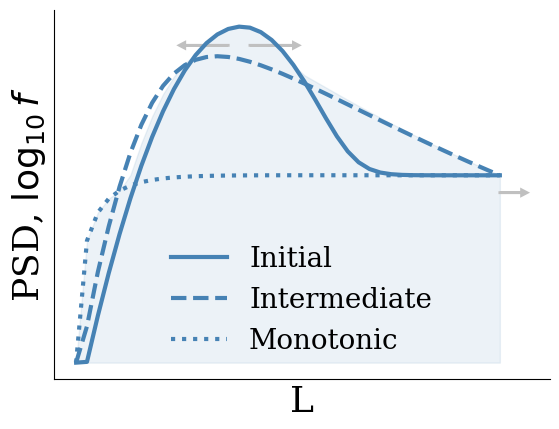

In [ ]:
# plot these stages for dirichlet

fig,ax = plt.subplots()
dist = np.array(psd_array_background_D)
dist[dist<1E-3] = 100


y1 = np.log10(dist[0][:])
y2 = np.log10(dist[7][:])
y3 = np.log10(dist[280*2][:])

ax.plot(L_N,np.log10(dist[0][:]),label='Initial',linewidth=3,color='steelblue')
ax.plot(L_N,np.log10(dist[15][:]),'--',label='Intermediate',linewidth=3,color='steelblue')
ax.plot(L_N,np.log10(dist[280*2][:]),':',label='Monotonic',linewidth=3,color='steelblue')
ax.fill_between(L_N, np.ones(np.shape(L_N))*2,np.max([y1, y2, y3],axis=0),alpha=0.1,color='steelblue')
ax.set_ylabel('PSD, $\log_{10}{f}$')
ax.set_xlabel('L')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.arrow(3.9,4.8,-0.45,0,length_includes_head=True,head_width=0.05, head_length=0.05,fc='silver',ec='silver',linewidth=2)
ax.arrow(4.1,4.8,0.45,0,length_includes_head=True,head_width=0.05, head_length=0.05,fc='silver',ec='silver',linewidth=2)
ax.arrow(6.4,3.5,0.25,0,length_includes_head=True,head_width=0.05, head_length=0.05,fc='silver',ec='silver',linewidth=2)

ax.legend(frameon=False,loc='lower center')


fig.savefig('figs/dirichlet-diagram.pdf')


In [ ]:
# # Simple example, add big bump Neumann
# psd_array_background_N, L_N,D_N = single_run({},**{'rtype':'n','nt':3600*18,'kp':7,'f_return':15*60/10})

# # save these
# np.savetxt("csv-outputs/psd_array_background_N.csv",np.array(psd_array_background_N),delimiter=",")

<ipython-input-56-e60d54452752>:11: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  ax.plot(L_N,np.log10(dist[0][:]),'k',label='Initial',linewidth=3,color='steelblue')
<ipython-input-56-e60d54452752>:12: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot(L_N,np.log10(dist[7][:]),'k--',label='Intermediate',linewidth=3,color='steelblue')
<ipython-input-56-e60d54452752>:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  ax.plot(L_N,np.log10(dist[280*2][:]),'k:',label='Monotonic',linewidth=3,color='steelblue')


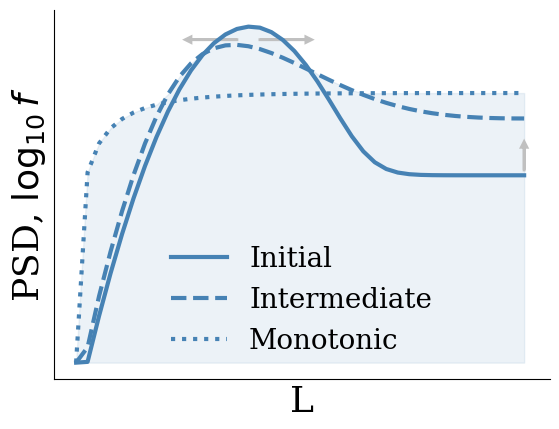

In [ ]:
# plot these stages for neumann
#plt.rcParams.update({'font.size': 16})

fig,ax = plt.subplots()
dist = np.array(psd_array_background_N)
dist[dist<1E-3] = 100

y1 = np.log10(dist[0][:])
y2 = np.log10(dist[7][:])
y3 = np.log10(dist[280*2][:])
ax.plot(L_N,np.log10(dist[0][:]),'k',label='Initial',linewidth=3,color='steelblue')
ax.plot(L_N,np.log10(dist[7][:]),'k--',label='Intermediate',linewidth=3,color='steelblue')
ax.plot(L_N,np.log10(dist[280*2][:]),'k:',label='Monotonic',linewidth=3,color='steelblue')
ax.fill_between(L_N, np.ones(np.shape(L_N))*2,np.max([y1, y2, y3],axis=0),alpha=0.1,color='steelblue')
ax.set_ylabel('PSD, $\log_{10}{f}$')
ax.set_xlabel('L')
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.arrow(3.9,4.85,-0.45,0,length_includes_head=True,head_width=0.05, head_length=0.05,fc='silver',ec='silver',linewidth=2)
ax.arrow(4.1,4.85,0.45,0,length_includes_head=True,head_width=0.05, head_length=0.05,fc='silver',ec='silver',linewidth=2)
ax.arrow(6.4,3.7,0,0.25,length_includes_head=True,head_width=0.05, head_length=0.05,fc='silver',ec='silver',linewidth=2)

ax.legend(frameon=False,loc='lower center')


fig.savefig('figs/neumann-diagram.pdf')


Examples wy monotonicity may not be reached

In [ ]:
# # Make a simple example, same but loss
# psd_array_LR_slowN, L_N,D_N = single_run({},**{'rtype':'n','nt':3600*24*4,'kp':4,'loss':'Shprits2007-eq4'})


# # save these
# np.savetxt("csv-outputs/psd_array_LR_slowN.csv",np.array(psd_array_LR_slowN),delimiter=",")

In [ ]:
# read in

df = pd.read_csv('psd_array_LR_slowN.csv', sep=',', header=None)
psd_array_LR_slowN = df.values

<ipython-input-57-a114084b0f97>:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  ax.plot(L_N,y1,'k',label='0h',linewidth=3,color='steelblue')
<ipython-input-57-a114084b0f97>:14: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot(L_N,y2,'k--',label=str(int(10*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
<ipython-input-57-a114084b0f97>:15: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-." (-> color='k'). The keyword argument will take precedence.
  ax.plot(L_N,y3,'k-.',label=str(int(40*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
<ipython-input-57-a114084b0f97>:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> 

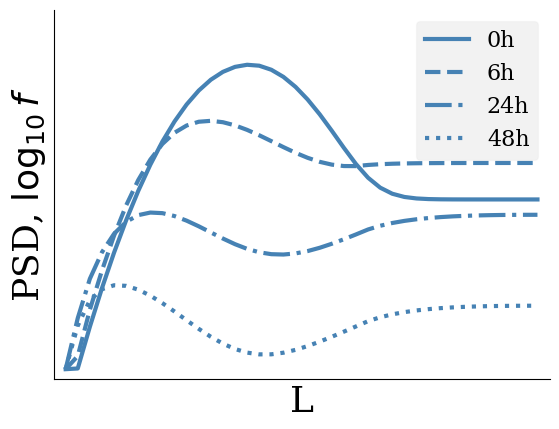

In [ ]:
# plot these stages for neumann

fig,ax = plt.subplots()
dist = np.array(psd_array_LR_slowN)
dist[dist<1E-3] = 100

default_f_return = 6*60*60/10

y1 = np.log10(dist[0][:])
y2 = np.log10(dist[10][:])
y3 = np.log10(dist[40][:])
y4 = np.log10(dist[80][:])
ax.plot(L_N,y1,'k',label='0h',linewidth=3,color='steelblue')
ax.plot(L_N,y2,'k--',label=str(int(10*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
ax.plot(L_N,y3,'k-.',label=str(int(40*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
ax.plot(L_N,y4,'k:',label=str(int(80*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
ax.set_ylabel('PSD, $\log_{10}{f}$')
ax.set_xlabel('L')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim([2.4,6.5])
ax.set_ylim([1.9,5.5])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(facecolor='gray', framealpha=0.1,loc='upper right',fontsize=16)



fig.savefig('figs/slowloss-neumann.pdf')


In [ ]:
# # Dirichlet
# psd_array_LR_slowD, L_N,D_N = single_run({},**{'rtype':'d','nt':3600*24*4,'kp':4,'loss':'Shprits2007-eq4'})

# # save these
# np.savetxt("csv-outputs/psd_array_LR_slowD.csv",np.array(psd_array_LR_slowD),delimiter=",")


In [ ]:
# read in

df = pd.read_csv('psd_array_LR_slowD.csv', sep=',', header=None)
psd_array_LR_slowD = df.values

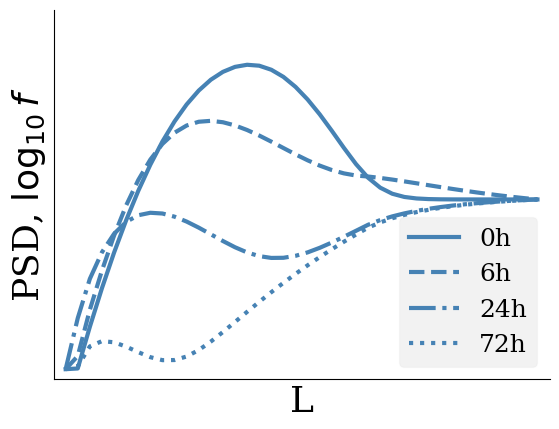

In [ ]:
# plot these stages for dirichelt

fig,ax = plt.subplots()
dist = np.array(psd_array_LR_slowD)
dist[dist<1E-3] = 100

default_f_return = 6*60*60/10

y1 = np.log10(dist[0][:])
y2 = np.log10(dist[10][:])
y3 = np.log10(dist[40][:])
y4 = np.log10(dist[120][:])
ax.plot(L_N,y1,'',label='0h',linewidth=3,color='steelblue')
ax.plot(L_N,y2,'--',label=str(int(10*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
ax.plot(L_N,y3,'-.',label=str(int(40*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
ax.plot(L_N,y4,':',label=str(int(120*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
ax.set_ylabel('PSD, $\log_{10}{f}$')
ax.set_xlabel('L')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim([2.4,6.5])
ax.set_ylim([1.9,5.5])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(loc='lower right',facecolor='gray', framealpha=0.1,fontsize =18) #frameon=False,



fig.savefig('figs/slowloss-dirichlet.pdf')


<ipython-input-59-c949d965e28f>:11: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  ax.plot(L_N,y3,'k',label=str(int(40*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')


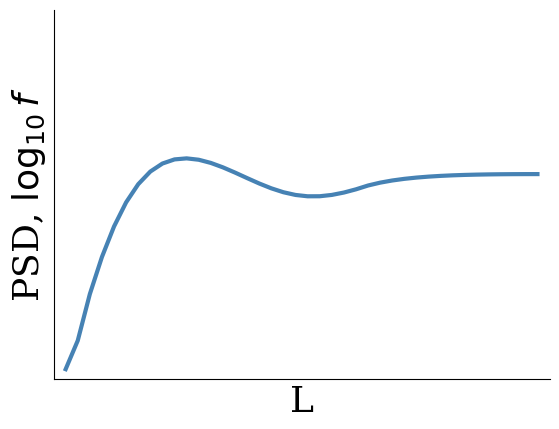

In [ ]:
# example of an extra minima

fig,ax = plt.subplots()
dist = np.array(psd_array_LR_slowN)
dist[dist<1E-3] = 100

default_f_return = 6*60*60/10


y3 = np.log10(dist[20][:])
ax.plot(L_N,y3,'k',label=str(int(40*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')
ax.set_ylabel('PSD, $\log_{10}{f}$')
ax.set_xlabel('L')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim([2.4,6.5])
ax.set_ylim([1.9,5.5])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


fig.savefig('figs/extra-minima.pdf')


In [ ]:
# read in

df = pd.read_csv('psd_array_LR_slowN.csv', sep=',', header=None)
psd_array_LR_slowN = df.values

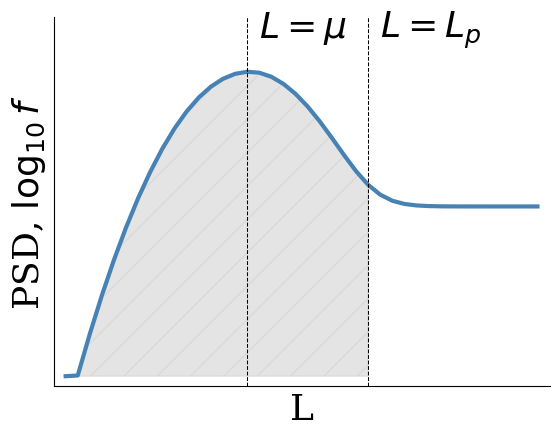

In [ ]:
# example of an extra minima

fig,ax = plt.subplots()
dist = np.array(psd_array_LR_slowN)
dist[dist<1E-3] = 100

default_f_return = 6*60*60/10


y = np.log10(dist[0][:])
ax.plot(L_N,y,label=str(int(40*default_f_return/(60*60)))+'h',linewidth=3,color='steelblue')


ax.fill_between(L_N[L_N<=5], np.ones(np.shape(L_N[L_N<=5]))*2,np.log10(dist[0][L_N<=5]),alpha=0.6,color='lightgrey',hatch='/')
ax.plot([5 ,5],[1.9 ,5.5],'k--',linewidth=0.75)
ax.plot([4 ,4],[1.9 ,5.5],'k--',linewidth=0.75)
ax.set_ylabel('PSD, $\log_{10}{f}$')
ax.set_xlabel('L')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlim([2.4,6.5])
ax.set_ylim([1.9,5.5])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.text(4.1,5.3,'$L=\mu$',size=fsize)
ax.text(5.1,5.3,'$L=L_p$',size=fsize)


fig.savefig('figs/loss-region.pdf')


# Time to monotonicity plots: Neumann
PLot the parameter vs Kp plots

Show variation with Kp first




In [ ]:
reset_fonts() # serif fonts for all these

#### sigma

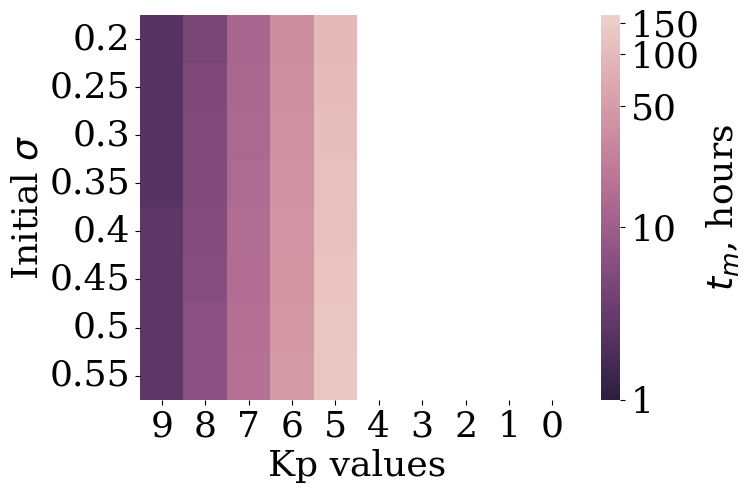

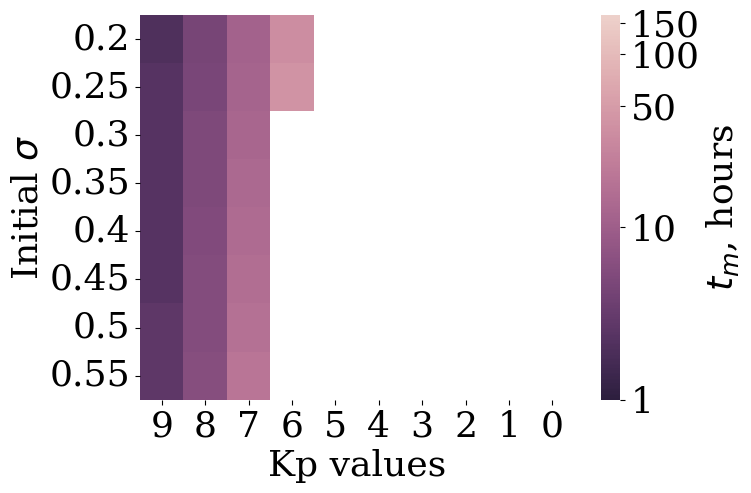

In [ ]:
# plot sigma vs Kp with and without loss rate


da = xr.open_dataset('monotonic_times_N_sig.nc')
plot_mtime_par_vs_kp(da,'Initial $\sigma$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_sig.eps'
                     )


da = xr.open_dataset('monotonic_times_N_sig_incLR.nc')
plot_mtime_par_vs_kp(da,'Initial $\sigma$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_sig_incLR.eps'
                     )



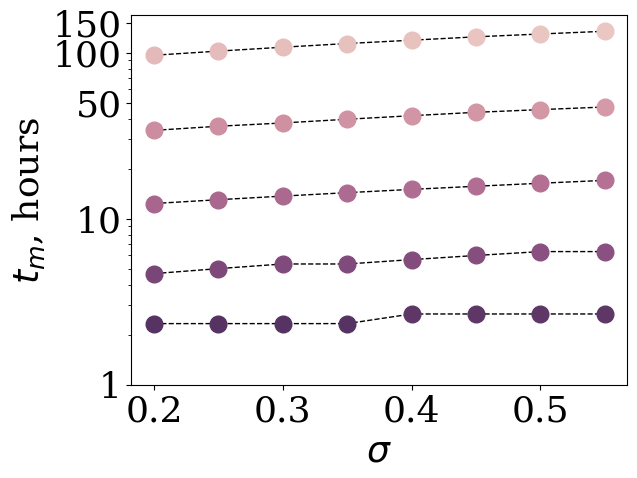

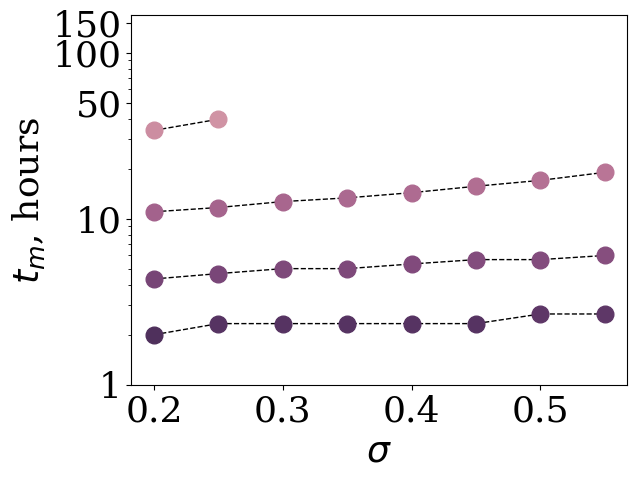

In [ ]:


# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_N_sig.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\sigma$','mtimes_lines_N_sig.eps')


da = xr.open_dataset('monotonic_times_N_sig_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\sigma$','mtimes_lines_N_sig_incLR.eps')

#### mu

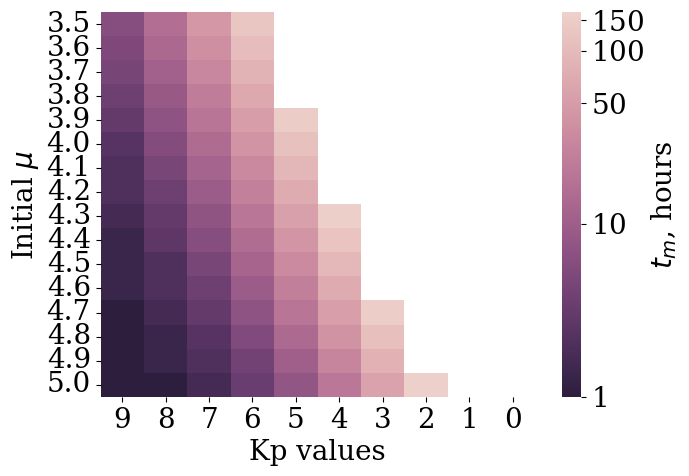

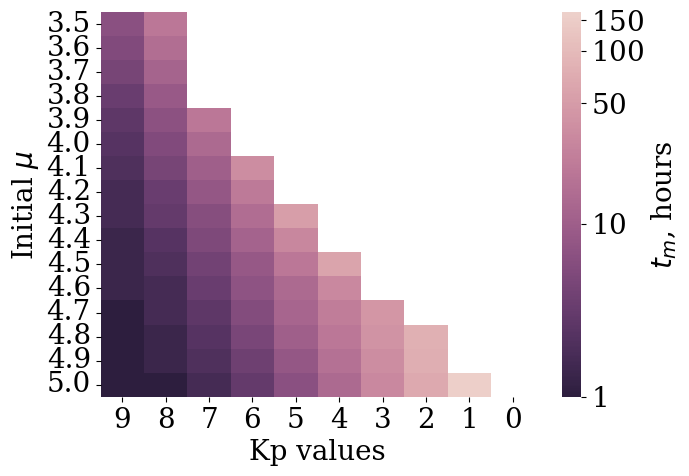

In [ ]:
# plot mu vs Kp


matplotlib.rcParams.update({'font.size': 20})

da = xr.open_dataset('monotonic_times_N_mu.nc')
plot_mtime_par_vs_kp(da,'Initial $\mu$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_mu.eps'
                     )



da = xr.open_dataset('monotonic_times_N_mu_incLR.nc')
plot_mtime_par_vs_kp(da,'Initial $\mu$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_mu_incLR.eps'
                     )

reset_fonts()

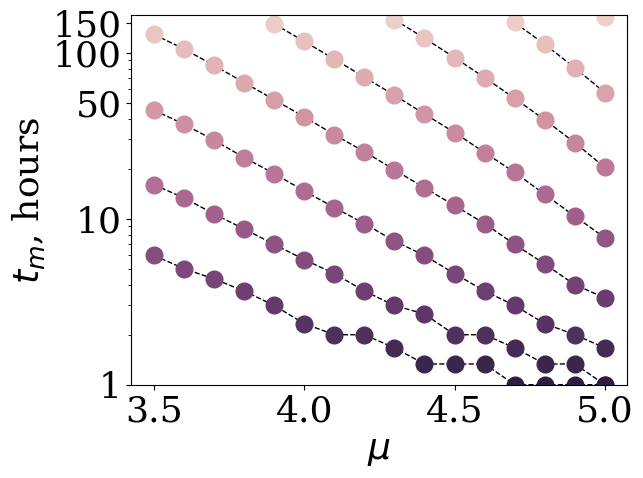

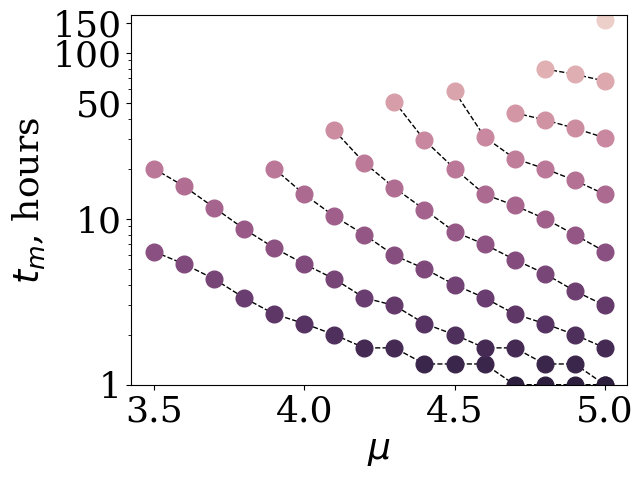

In [ ]:


# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_N_mu.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\mu$','mtimes_lines_N_mu.eps')



da = xr.open_dataset('monotonic_times_N_mu_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\mu$','mtimes_lines_N_mu_incLR.eps')

#### A

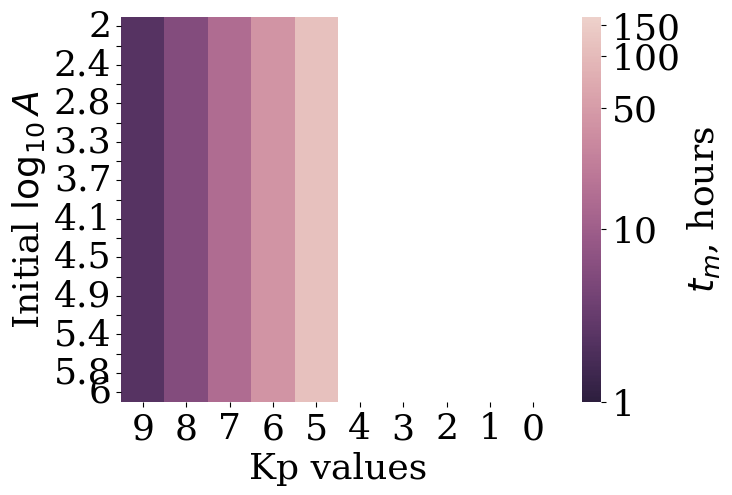

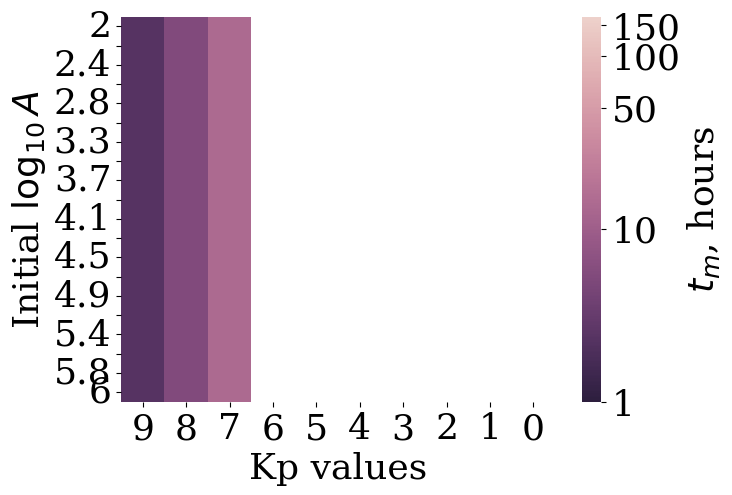

In [ ]:
# plot A vs Kp


da = xr.open_dataset('monotonic_times_N_A.nc')

# log version
plot_mtime_par_vs_kp(da,'Initial $\log_{10}{A}$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_A.eps'
                     )


# plot A vs Kp with loss rate
da = xr.open_dataset('monotonic_times_N_A_incLR.nc')

# log version
plot_mtime_par_vs_kp(da,'Initial $\log_{10}{A}$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_A_incLR.eps'
                     )



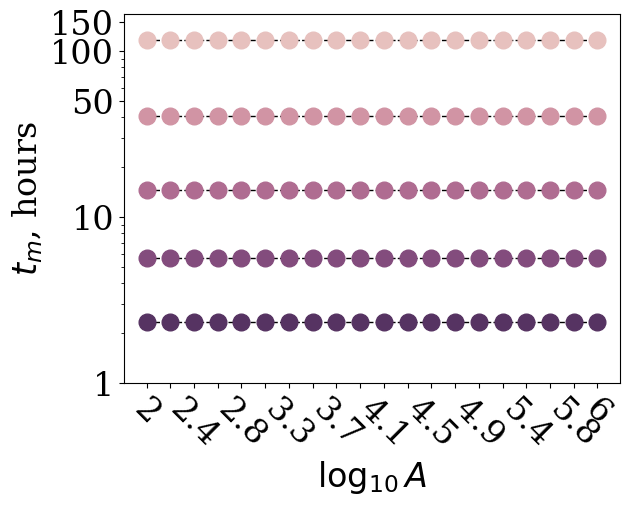

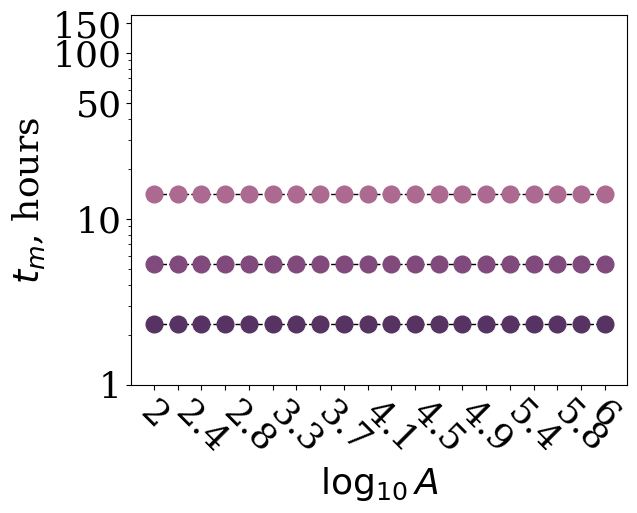

In [ ]:
# Plot cut-throughs of tm


matplotlib.rcParams.update({'font.size': 24})

da = xr.open_dataset('monotonic_times_N_A.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\log_{10}{A}$','mtimes_lines_N_A.eps')



da = xr.open_dataset('monotonic_times_N_A_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\log_{10}{A}$','mtimes_lines_N_A_incLR.eps')

reset_fonts()

### B

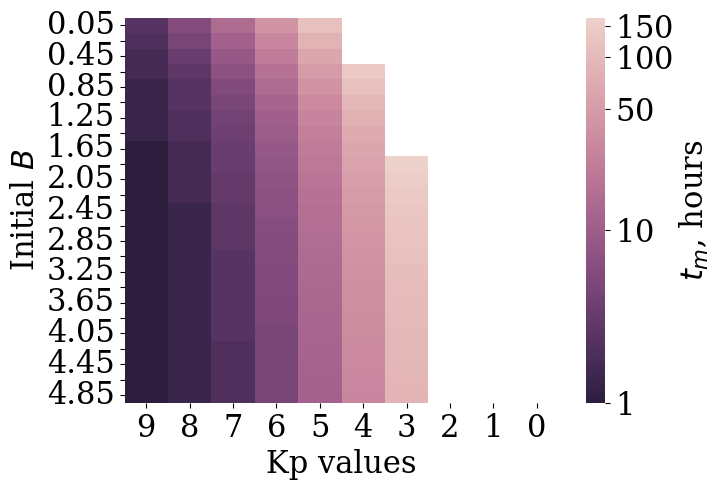

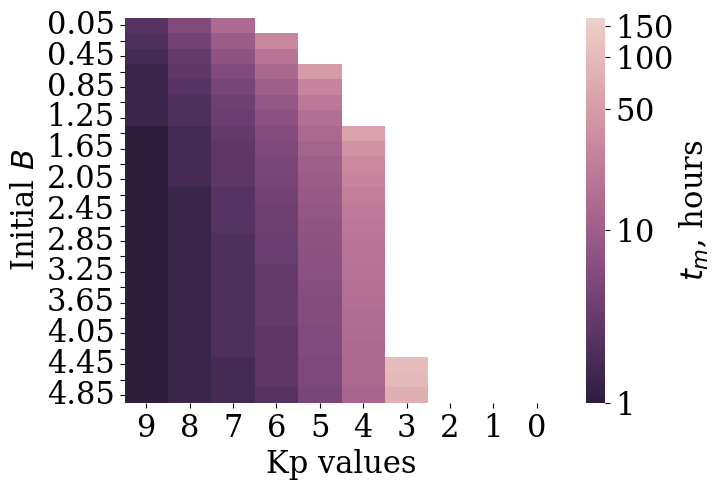

In [ ]:


matplotlib.rcParams.update({'font.size': 22})

# plot B vs Kp
da = xr.open_dataset('monotonic_times_N_B.nc')
plot_mtime_par_vs_kp(da,'Initial $B$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_B.eps'
                     )


# plot B vs Kp including loss rate
da = xr.open_dataset('monotonic_times_N_B_incLR.nc')
plot_mtime_par_vs_kp(da,'Initial $B$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_B_incLR.eps'
                     )

reset_fonts()

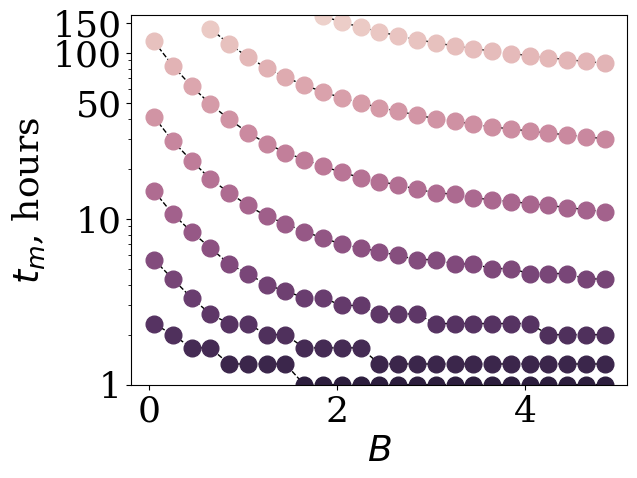

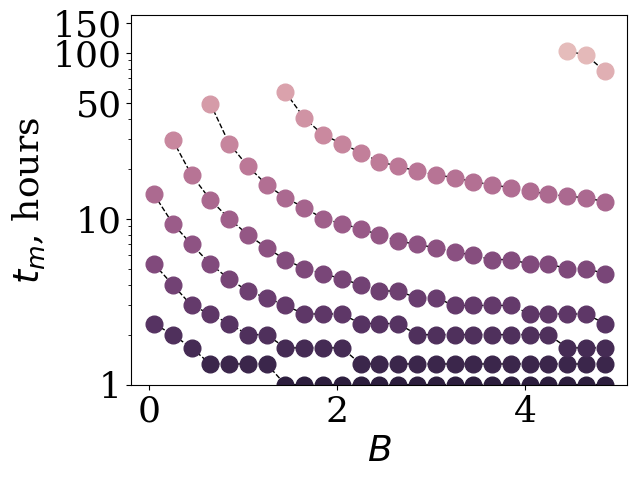

In [ ]:
# Line plot versions



# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_N_B.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$B$','mtimes_lines_N_B.eps')



da = xr.open_dataset('monotonic_times_N_B_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$B$','mtimes_lines_N_B_incLR.eps')



### $L_{outer}$

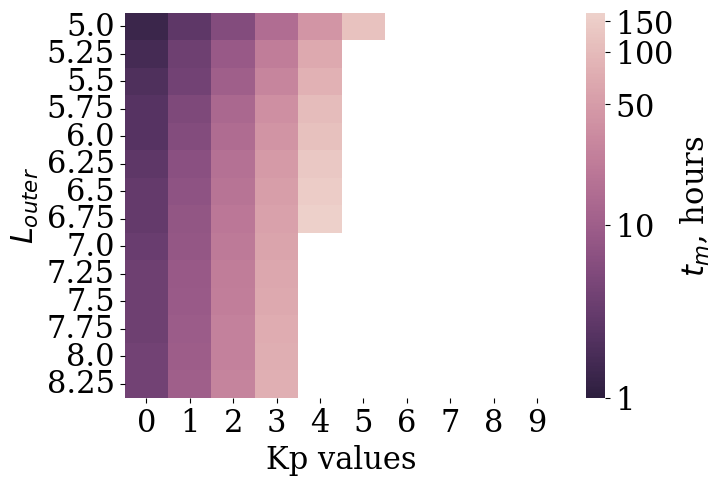

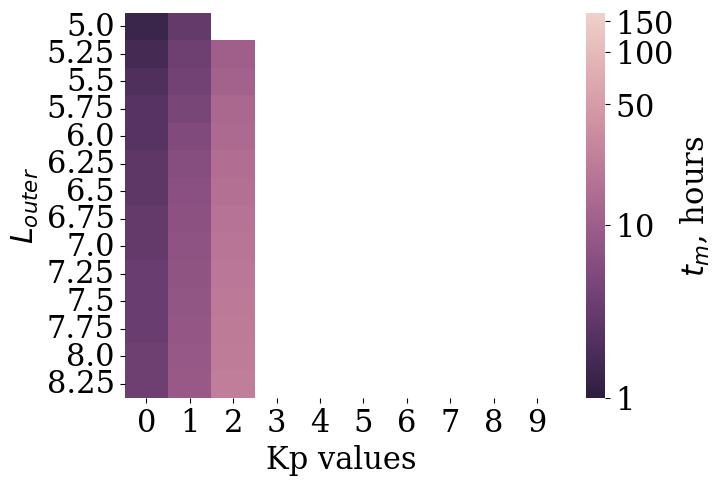

In [ ]:
# plot L_outer vs Kp

matplotlib.rcParams.update({'font.size': 22})

da = xr.open_dataset('monotonic_times_N_L_outer.nc')
plot_mtime_par_vs_kp(da,'$L_{outer}$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_L_outer.eps'
                     )

# plot L_outer vs Kp including loss rate
da = xr.open_dataset('monotonic_times_N_L_outer_incLR.nc')
plot_mtime_par_vs_kp(da,'$L_{outer}$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_L_outer_incLR.eps'
                     )

reset_fonts()

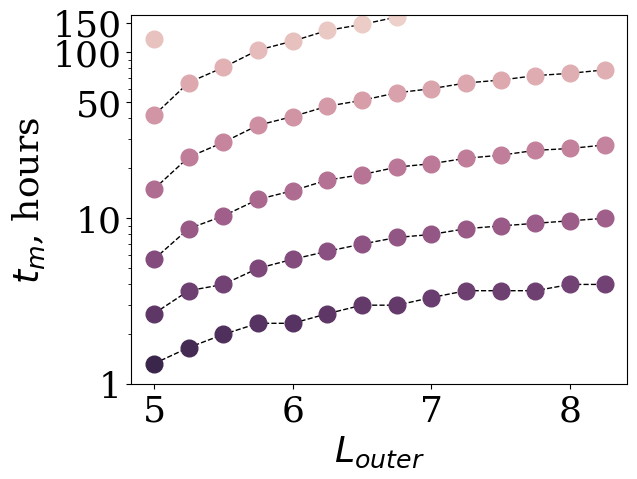

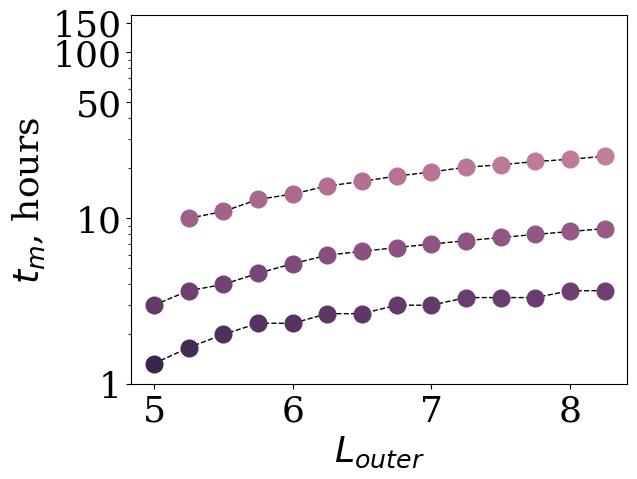

In [ ]:
# Line plot versions

# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_N_L_outer.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$L_{outer}$','mtimes_lines_N_L_outer.eps')



da = xr.open_dataset('monotonic_times_N_L_outer_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$L_{outer}$','mtimes_lines_N_L_outer_incLR.eps')

# Time to monotonicity plots: Dirichlet

Plot the parameter vs Kp plots (Dirichlet)

## B

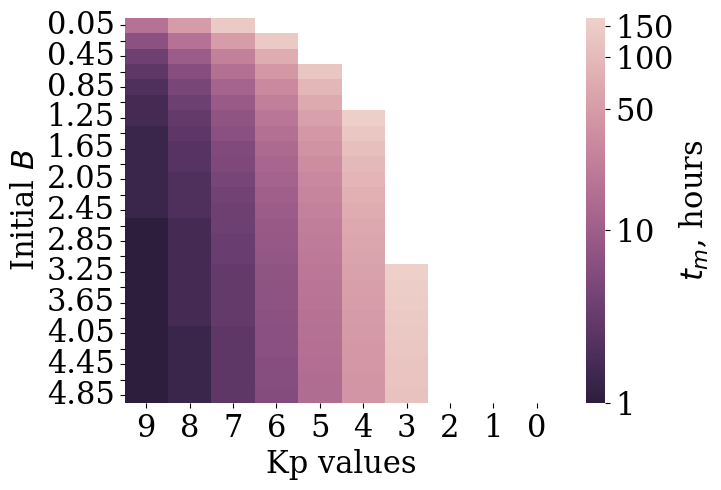

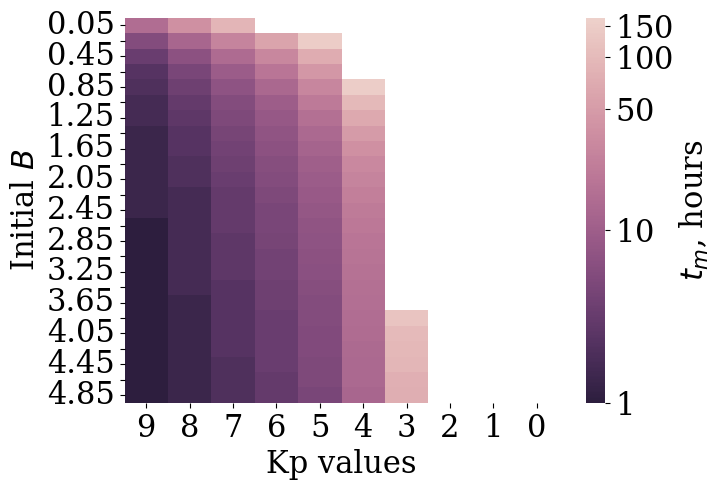

In [ ]:
matplotlib.rcParams.update({'font.size': 22})

# plot B vs Kp
da = xr.open_dataset('monotonic_times_D_B.nc')
plot_mtime_par_vs_kp(da,'Initial $B$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_B.eps'
                     )

# plot B vs Kp including loss rate
da = xr.open_dataset('monotonic_times_D_B_incLR.nc')
plot_mtime_par_vs_kp(da,'Initial $B$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_B_incLR.eps'
                     )


reset_fonts()

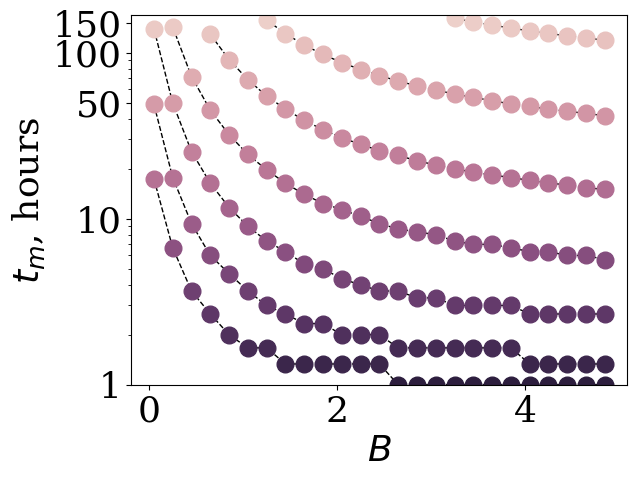

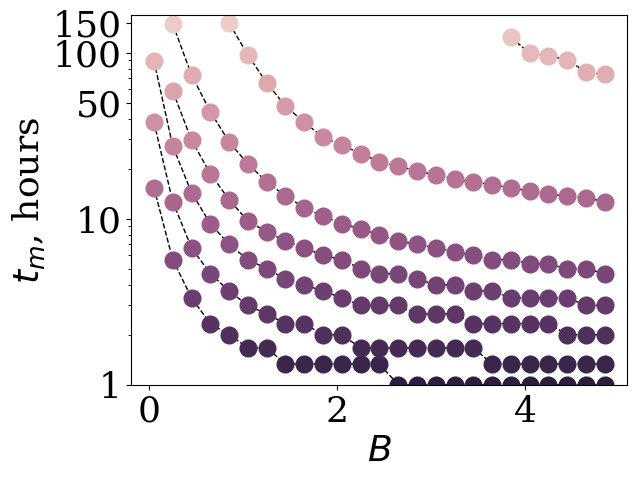

In [ ]:
# Line plot versions

# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_D_B.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$B$','mtimes_lines_D_B.eps')



da = xr.open_dataset('monotonic_times_D_B_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$B$','mtimes_lines_D_B_incLR.eps')




## sigma


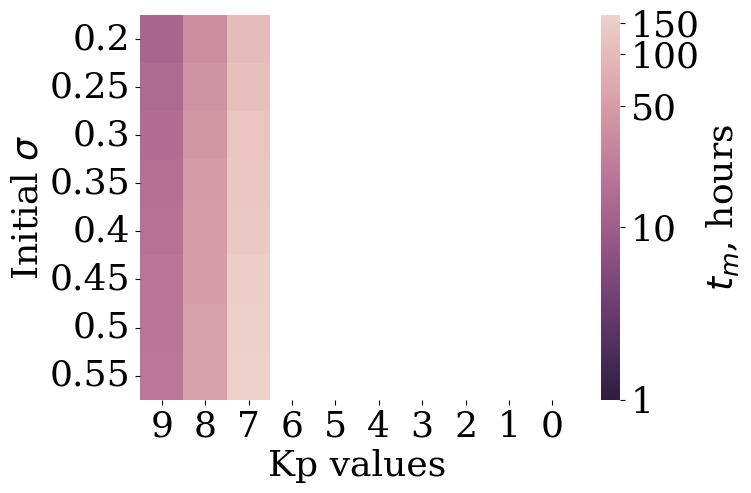

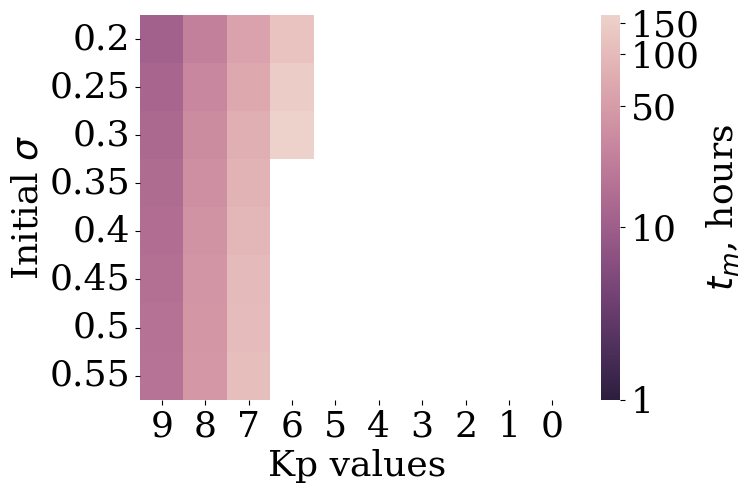

In [ ]:
# plot sigma vs Kp
da = xr.open_dataset('monotonic_times_D_sig.nc')
plot_mtime_par_vs_kp(da,'Initial $\sigma$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_sig.eps'
                     )

# plot sigma vs Kp including loss
da = xr.open_dataset('monotonic_times_D_sig_incLR.nc')
plot_mtime_par_vs_kp(da,'Initial $\sigma$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_sig_incLR.eps'
                     )



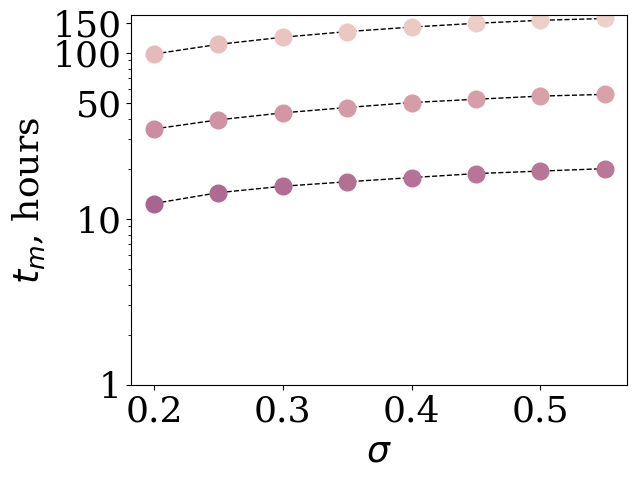

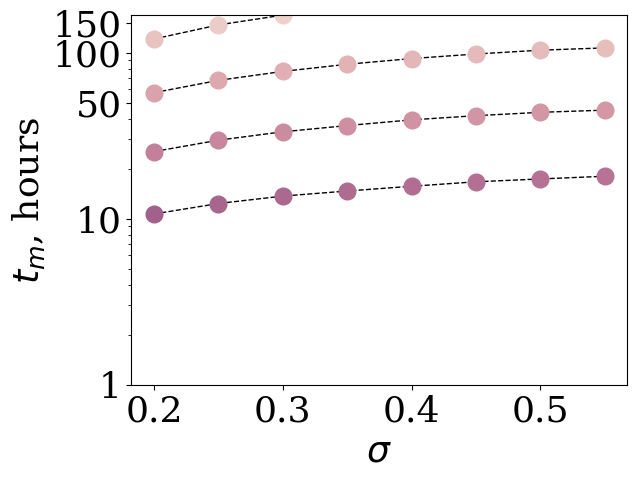

In [ ]:
# Line plot versions

# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_D_sig.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\sigma$','mtimes_lines_D_sig.eps')



da = xr.open_dataset('monotonic_times_D_sig_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\sigma$','mtimes_lines_D_sig_incLR.eps')




## A


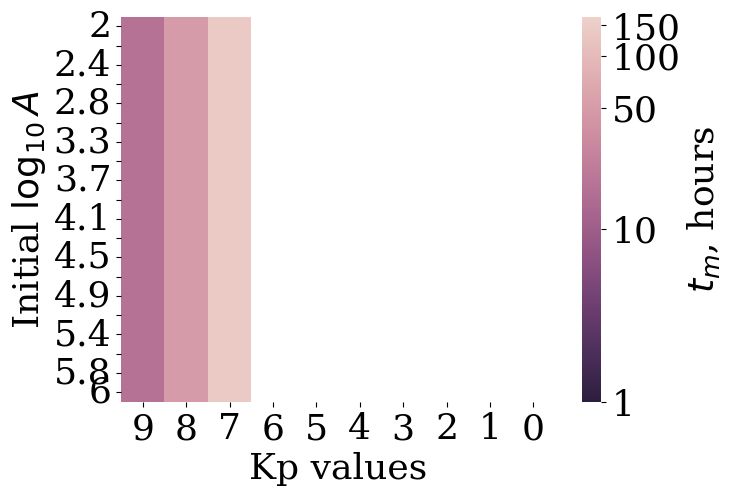

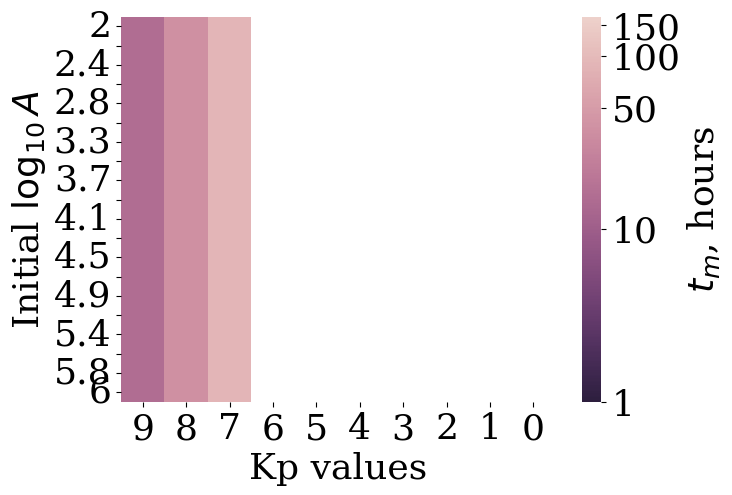

In [ ]:
# plot A vs Kp
da = xr.open_dataset('monotonic_times_D_A.nc')


# log version
plot_mtime_par_vs_kp(da,'Initial $\log_{10}{A}$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_A.eps'
                     )

# nonlog

#plot_mtime_par_vs_kp(da,'Initial $A$ value',
#                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
#                     'mtimes_plot_D_A.eps'
#                     )

# plot A vs Kp
da = xr.open_dataset('monotonic_times_D_A_incLR.nc')


# log version
plot_mtime_par_vs_kp(da,'Initial $\log_{10}{A}$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_A_incLR.eps'
                     )


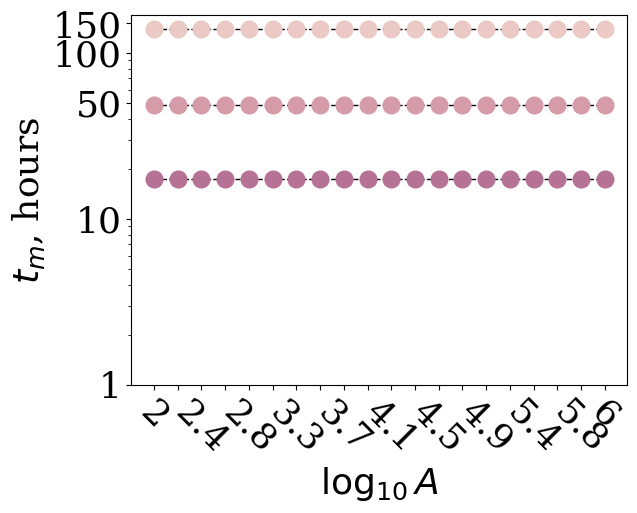

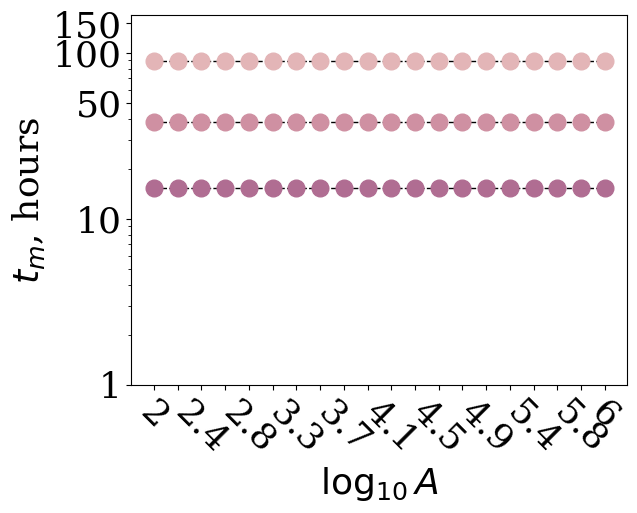

In [ ]:
# Line plot versions

# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_D_A.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\log_{10}{A}$','mtimes_lines_D_A.eps')


da = xr.open_dataset('monotonic_times_D_A_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\log_{10}{A}$','mtimes_lines_D_A_incLR.eps')



## mu



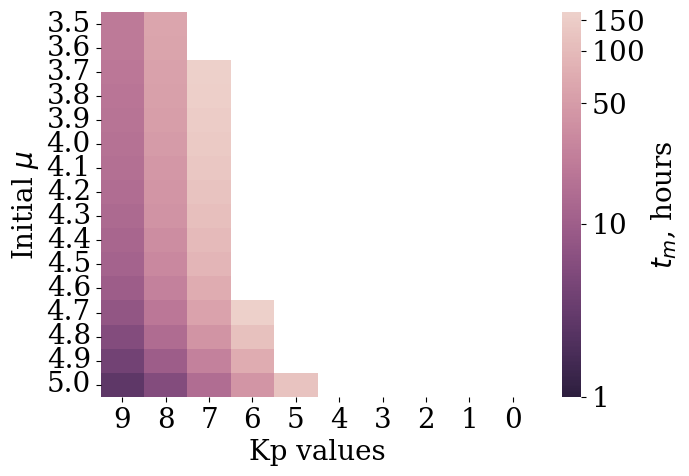

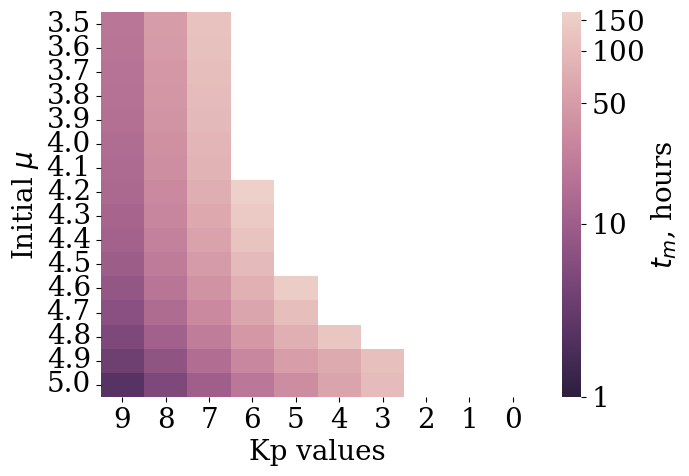

In [ ]:
matplotlib.rcParams.update({'font.size': 20})

# plot mu vs Kp
da = xr.open_dataset('monotonic_times_D_mu.nc')
plot_mtime_par_vs_kp(da,'Initial $\mu$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_mu.eps'
                     )

# plot mu vs Kp (loss)
da = xr.open_dataset('monotonic_times_D_mu_incLR.nc')
plot_mtime_par_vs_kp(da,'Initial $\mu$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_mu_incLR.eps'
                     )

reset_fonts()


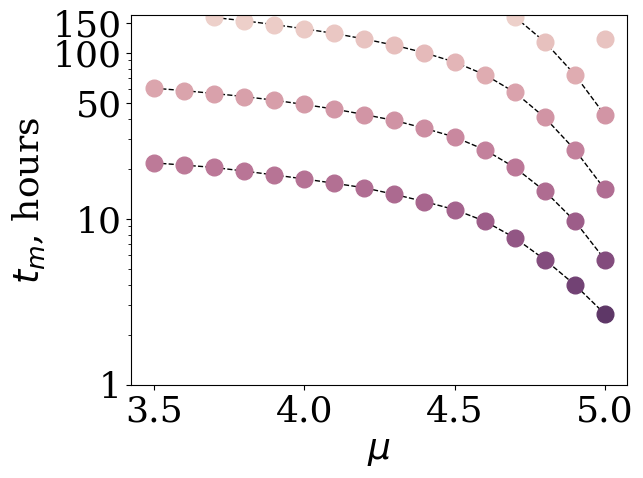

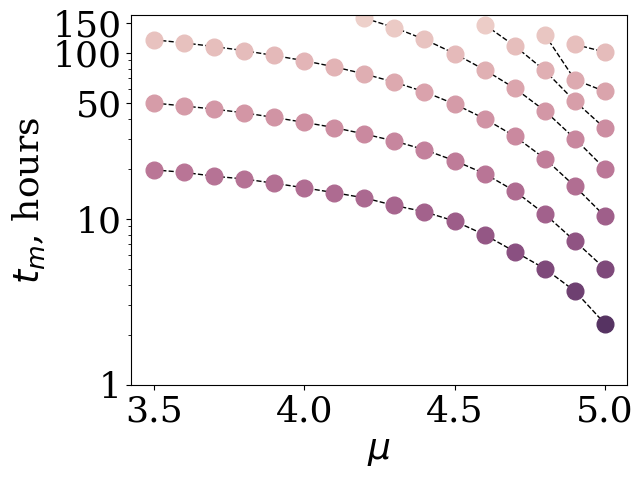

In [ ]:
# Line plot versions

# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_D_mu.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\mu$','mtimes_lines_D_mu.eps')


da = xr.open_dataset('monotonic_times_D_mu_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$\mu$','mtimes_lines_D_mu_incLR.eps')




## $L_{outer}$


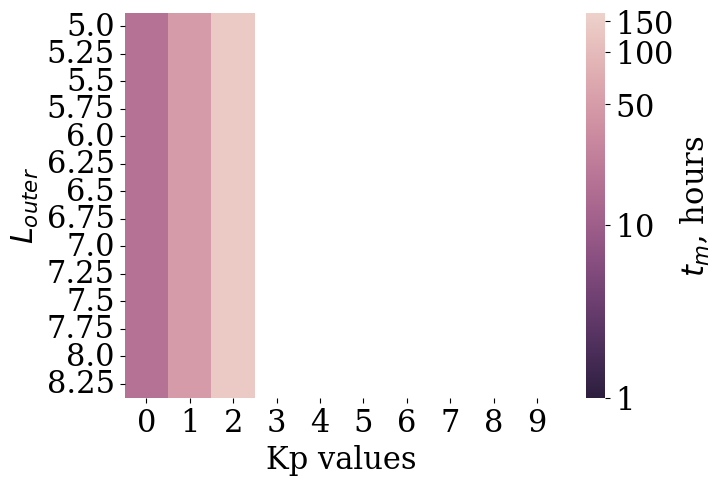

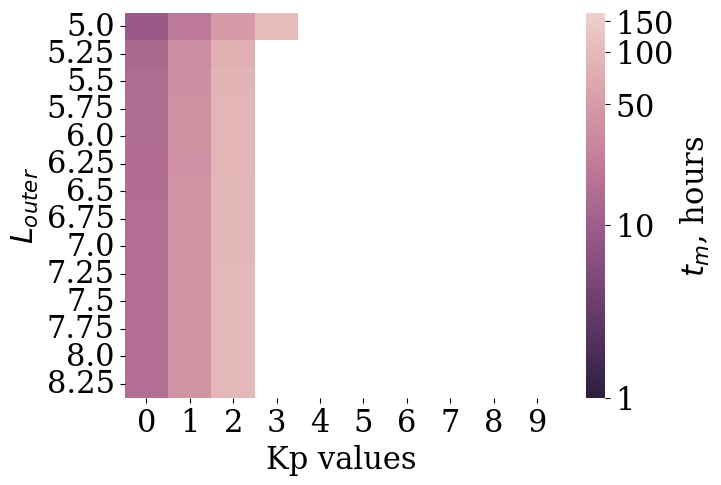

In [ ]:

matplotlib.rcParams.update({'font.size': 22})

# plot L_outer vs Kp
da = xr.open_dataset('monotonic_times_D_L_outer.nc')
plot_mtime_par_vs_kp(da,'$L_{outer}$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_L_outer.eps'
                     )

# plot L_outer vs Kp (loss)
da = xr.open_dataset('monotonic_times_D_L_outer_incLR.nc')
plot_mtime_par_vs_kp(da,'$L_{outer}$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_L_outer_incLR.eps'
                     )

reset_fonts()

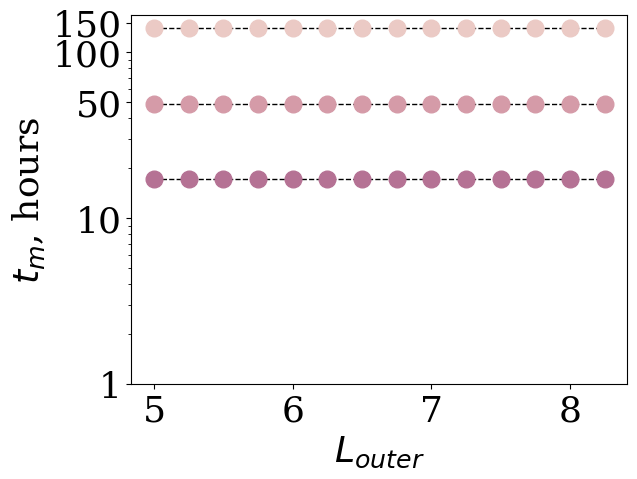

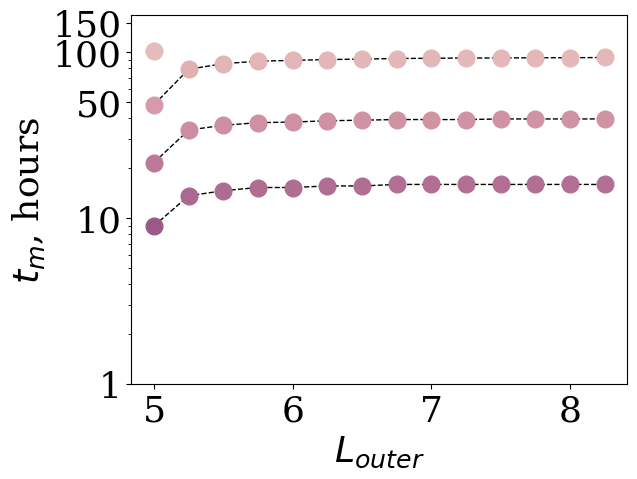

In [ ]:
# Line plot versions

# Plot cut-throughs of tm
da = xr.open_dataset('monotonic_times_D_L_outer.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$L_{outer}$','mtimes_lines_D_L_outer.eps')


da = xr.open_dataset('monotonic_times_D_L_outer_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'$L_{outer}$','mtimes_lines_D_L_outer_incLR.eps')



## Plasmapause $L_p$

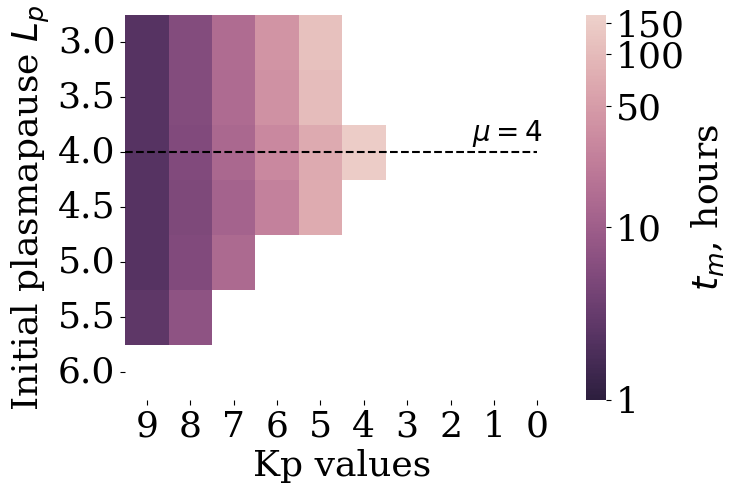

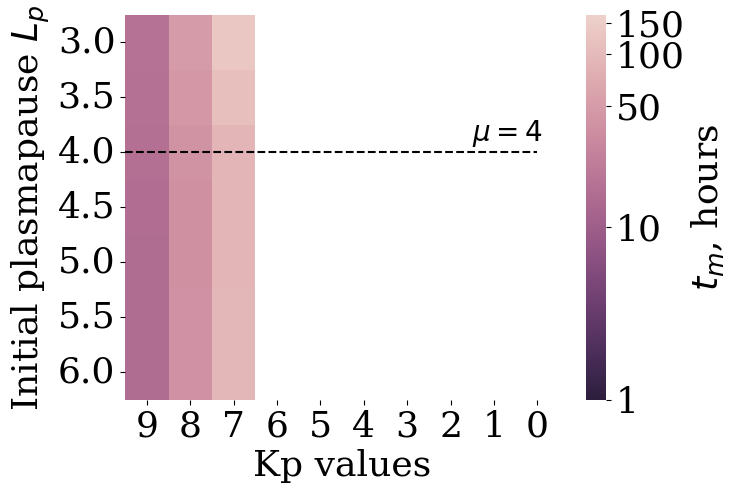

In [ ]:
# Plasmapause dirichley vs neumann

# plot plasmapause vs Kp
da = xr.open_dataset('monotonic_times_N_plasmapause_incLR.nc')
fig, ax = plot_mtime_par_vs_kp(da,'Initial plasmapause $L_p$',
                     '(N) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_N_plasmapause_incLR.eps'
                     )

# add line to indicate peak location and resave3
# print(*ax.get_yticklabels()) # show where the ticklabels are on the heatmap
ax.plot([0,9.5],[2.5,2.5],'k--')
ax.text(8,2.3,'$\mu=4$',fontsize=fsize_leg)
plt.savefig('figs/mtimes_plot_N_plasmapause_incLR.eps', dpi = 600,bbox_inches='tight')

da = xr.open_dataset('monotonic_times_D_plasmapause_incLR.nc')
fig, ax = plot_mtime_par_vs_kp(da,'Initial plasmapause $L_p$',
                     '(D) Time taken (hours) until monotonic\n (if under 7 days)',
                     'mtimes_plot_D_plasmapause_incLR.eps'
                     )


# add line to indicate peak location and resave3
# print(*ax.get_yticklabels()) # show where the ticklabels are on the heatmap
ax.plot([0,9.5],[2.5,2.5],'k--')
ax.text(8,2.3,'$\mu=4$',fontsize=fsize_leg)
plt.savefig('figs/mtimes_plot_D_plasmapause_incLR.eps', dpi = 600,bbox_inches='tight')



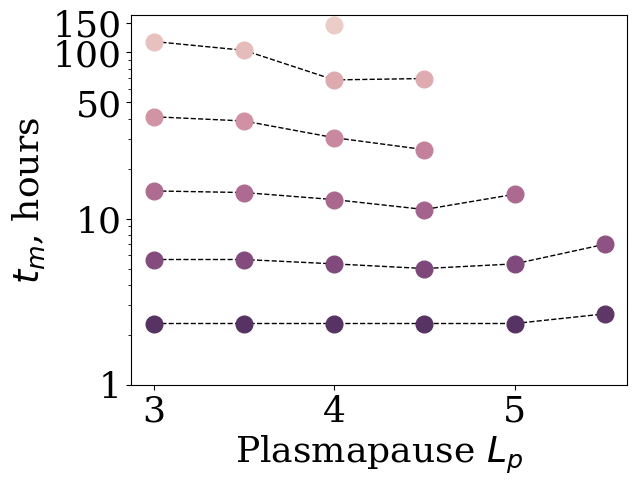

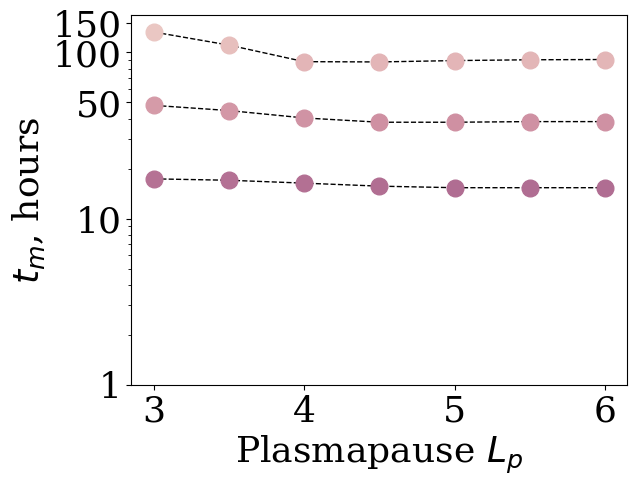

In [ ]:
# Line plot versions

da = xr.open_dataset('monotonic_times_N_plasmapause_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'Plasmapause $L_p$','mtimes_lines_N_plasmapause_incLR.eps')

da = xr.open_dataset('monotonic_times_D_plasmapause_incLR.nc')
fig, ax = plt.subplots()
plot_tm_cutthroughs(fig,ax,da,'Plasmapause $L_p$','mtimes_lines_D_plasmapause_incLR.eps')





# Heatmaps and waterfalls of PSD run

In [ ]:
# # Heatmap showing one example: Run once with L=6.5 and Kp = 4
# psd_array_Oz_N,L_N,D_Oz_N = single_run({},**{'kp':4,'L_outer':6.5})
# # Heatmap showing one example: Run once with L=6.5 and Kp = 4
# psd_array_Oz_D,L_D,D_Oz_D = single_run({},**{'rtype':'d','kp':4,'L_outer':6.5})

# # save these
# np.savetxt("csv-outputs/psd_array_Oz_N.csv",np.array(psd_array_Oz_N),delimiter=",")
# np.savetxt("csv-outputs/psd_array_Oz_D.csv",np.array(psd_array_Oz_D),delimiter=",")

# np.savetxt("csv-outputs/D_Oz_N.csv",np.array(D_Oz_N),delimiter=",")
# np.savetxt("csv-outputs/D_Oz_D.csv",np.array(D_Oz_D),delimiter=",")

## No loss


I just use matlab for the waterfall plots

In [ ]:
# read them in

df = pd.read_csv('psd_array_Oz_N.csv', sep=',', header=None)
psd_array_Oz_N = df.values
df = pd.read_csv('psd_array_Oz_D.csv', sep=',', header=None)
psd_array_Oz_D = df.values
df = pd.read_csv('D_Oz_N.csv', sep=',', header=None)
D_Oz_N = df.values
df = pd.read_csv('D_Oz_D.csv', sep=',', header=None)
D_Oz_D = df.values


df = pd.read_csv('L_N.csv', sep=',', header=None)
L_N = df.values
df = pd.read_csv('L_D.csv', sep=',', header=None)
L_D = df.values


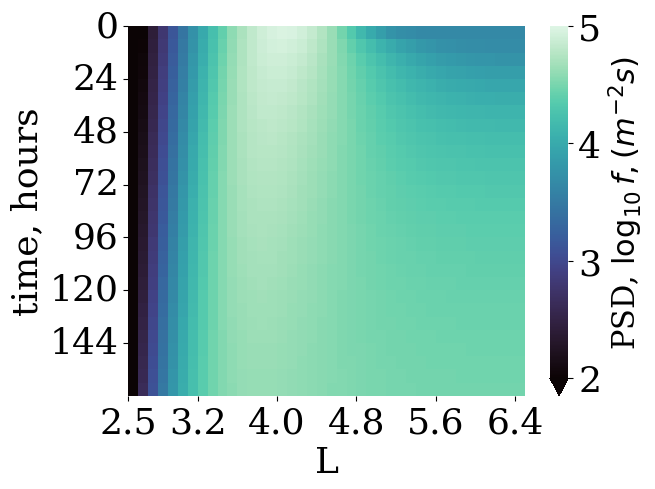

In [ ]:
# PSD heatmaps


fig,ax = plt.subplots()
heatmap_cmap = sns.color_palette("mako", as_cmap=True)
# naughty, define these properly earlier
dt = 10
#f_return = 6*60*60/dt # every six hours, in seconds
f_return = 6 # every six hours, in hours

# Run dependent bits


temp = np.array(psd_array_Oz_N)
temp[temp<1E-3] = 100

time_dim = np.array(psd_array_Oz_N).shape[0]
hmap = sns.heatmap(np.log10(temp),cmap=heatmap_cmap,ax=ax,cbar=True,cbar_kws={'label':'PSD, $\log_{10}{f}, (m^{-2}s)$','extend':'min'},vmin=2,vmax=5)
# max is actually 4.956

# set size https://stackoverflow.com/questions/48586738/seaborn-heatmap-colorbar-label-font-size
ax.figure.axes[-1].yaxis.label.set_size(22)

#cbar.set_label('PSD')

#cticks = ticks = [float(t.get_text().replace('−','-')) for t in cbar.ax.get_yticklabels()]
#cbar.ax.set_yticklabels([np.log10(tick) for tick in cticks])


ax.set_xlabel('L')
ax.set_ylabel('time, hours')


allyticklabels = f_return*np.arange(0,time_dim)
allxticklabels = np.round(np.arange(2.5,6.5,0.1),3) #L_N

numlabels = 6
ytick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)
xtick_ints = np.linspace(0, len(allxticklabels) - 1, numlabels ).astype(int)

ax.set_xticks(xtick_ints)
ax.set_xticklabels(allxticklabels[xtick_ints],rotation=0)
ax.set_yticks(ytick_ints)
ax.set_yticklabels(allyticklabels[ytick_ints],rotation=0)


#ax.set_title('$L_{outer}$=6.5, Kp=4, Neumann OBC')
fig.savefig('figs/neumannPSDtime.pdf',dpi = 600,bbox_inches='tight')
fig.savefig('figs/neumannPSDtime.svg',dpi = 600,bbox_inches='tight')


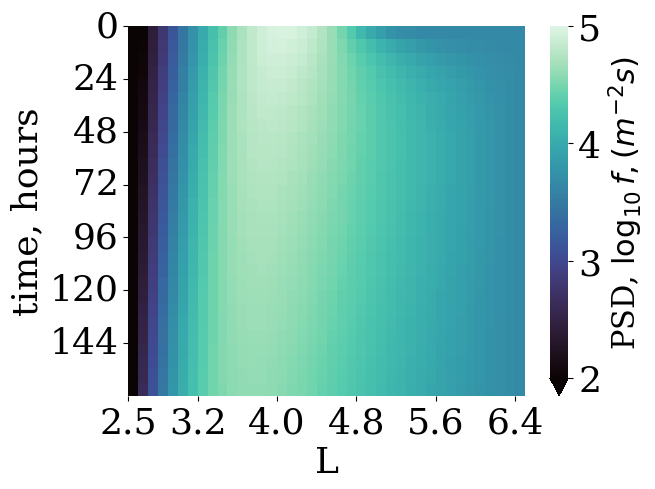

In [ ]:
# same for dirichlet


fig,ax = plt.subplots()
heatmap_cmap = sns.color_palette("mako", as_cmap=True)
# naughty, define these properly earlier
dt = 10
#f_return = 6*60*60/dt # every six hours, in seconds
f_return = 6 # every six hours, in hours

# Run dependent bits


temp = np.array(psd_array_Oz_D)
temp[temp<1E-3] = 100

time_dim = np.array(psd_array_Oz_D).shape[0]
hmap = sns.heatmap(np.log10(temp),cmap=heatmap_cmap,ax=ax,cbar=True,cbar_kws={'label':'PSD, $\log_{10}{f}, (m^{-2}s)$','extend':'min'},vmin=2,vmax=5)
# max is actually 4.956
#cbar.set_label('PSD')

# set size https://stackoverflow.com/questions/48586738/seaborn-heatmap-colorbar-label-font-size
ax.figure.axes[-1].yaxis.label.set_size(22)

#cticks = ticks = [float(t.get_text().replace('−','-')) for t in cbar.ax.get_yticklabels()]
#cbar.ax.set_yticklabels([np.log10(tick) for tick in cticks])


ax.set_xlabel('L')
ax.set_ylabel('time, hours')


allyticklabels = f_return*np.arange(0,time_dim)
allxticklabels = np.round(np.arange(2.5,6.5,0.1),3) #L_N

numlabels = 6
ytick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)
xtick_ints = np.linspace(0, len(allxticklabels) - 1, numlabels ).astype(int)

ax.set_xticks(xtick_ints)
ax.set_xticklabels(allxticklabels[xtick_ints],rotation=0)
ax.set_yticks(ytick_ints)
ax.set_yticklabels(allyticklabels[ytick_ints],rotation=0)


#ax.set_title('$L_{outer}$=6.5, Kp=4, Neumann OBC')
fig.savefig('figs/dirichletPSDtime.pdf',dpi = 600,bbox_inches='tight')
fig.savefig('figs/dirichletPSDtime.svg',dpi = 600,bbox_inches='tight')

In [ ]:
# save out the colormap
np.savetxt("csv-outputs/mako-cmap.csv",heatmap_cmap.colors,delimiter=",")

In [ ]:
# send the data to matlab to do waterfall plots


# manipulate data, set up for bth plots

import matplotlib as mpl
import scipy

time_dim = np.array(psd_array_N).shape[0]
x = L_N

f_return = 6 # every six hours, in hours
allxticklabels = f_return*np.arange(0,time_dim)
y = allxticklabels


# neumann plot
temp = np.array(psd_array_N)
temp[temp<1E-3] = 100
scipy.io.savemat('N_array.mat',dict(x=x,y=y,z=temp))


temp = np.array(psd_array_D)
temp[temp<1E-3] = 100
scipy.io.savemat('D_array.mat',dict(x=x,y=y,z=temp))

# set up waterfall plot
#X,Y = np.meshgrid(x,y)
#Z = np.log10(temp)

# ideally save colourmap too
cmap = mpl.cm.get_cmap('mako')
norm = mpl.colors.Normalize(vmin=2,vmax=7)

<ipython-input-650-277f79e3000c>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap('mako')


## Loss

In [ ]:
# read them in
df = pd.read_csv('psd_array_N_LR.csv', sep=',', header=None)
psd_array_N_LR = df.values
df = pd.read_csv('psd_array_D_LR.csv', sep=',', header=None)
psd_array_D_LR = df.values

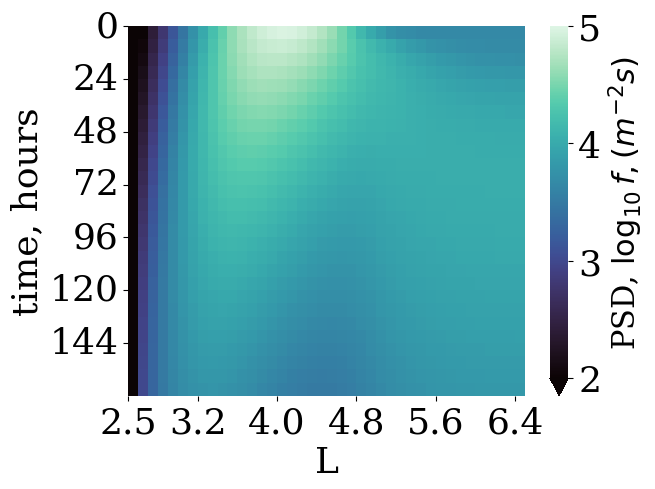

In [ ]:
# try usng actual heatmap function, just to see if colorbar xtuff is easier


fig,ax = plt.subplots()
heatmap_cmap = sns.color_palette("mako", as_cmap=True)
# naughty, define these properly earlier
dt = 10
#f_return = 6*60*60/dt # every six hours, in seconds
f_return = 6 # every six hours, in hours

# Run dependent bits


temp = np.array(psd_array_N_LR)
temp[temp<1E-3] = 100

time_dim = np.array(psd_array_N_LR).shape[0]
hmap = sns.heatmap(np.log10(temp),cmap=heatmap_cmap,ax=ax,cbar=True,cbar_kws={'label':'PSD, $\log_{10}{f}, (m^{-2}s)$','extend':'min'},vmin=2,vmax=5)
# max is actually 4.956

# set size https://stackoverflow.com/questions/48586738/seaborn-heatmap-colorbar-label-font-size
ax.figure.axes[-1].yaxis.label.set_size(22)
# max is actually 4.956
#cbar.set_label('PSD')

#cticks = ticks = [float(t.get_text().replace('−','-')) for t in cbar.ax.get_yticklabels()]
#cbar.ax.set_yticklabels([np.log10(tick) for tick in cticks])


ax.set_xlabel('L')
ax.set_ylabel('time, hours')


allyticklabels = f_return*np.arange(0,time_dim)
allxticklabels = L_N

numlabels = 6
ytick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)
xtick_ints = np.linspace(0, len(allxticklabels) - 1, numlabels ).astype(int)

ax.set_xticks(xtick_ints)
ax.set_xticklabels(allxticklabels[xtick_ints],rotation=0)
ax.set_yticks(ytick_ints)
ax.set_yticklabels(allyticklabels[ytick_ints],rotation=0)


#ax.set_title('$L_{outer}$=6.5, Kp=4, Neumann OBC')
fig.savefig('figs/neumannPSDtime_loss.pdf',dpi = 600,bbox_inches='tight')
fig.savefig('figs/neumannPSDtime_loss.svg',dpi = 600,bbox_inches='tight')

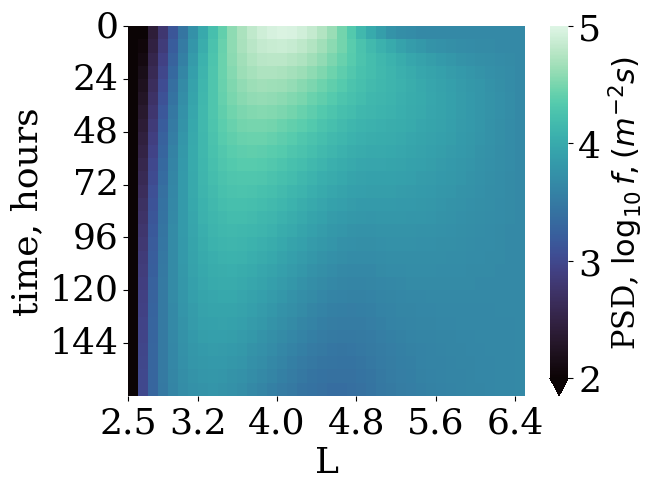

In [ ]:
# try usng actual heatmap function, just to see if colorbar xtuff is easier


fig,ax = plt.subplots()
heatmap_cmap = sns.color_palette("mako", as_cmap=True)
# naughty, define these properly earlier
dt = 10
#f_return = 6*60*60/dt # every six hours, in seconds
f_return = 6 # every six hours, in hours

# Run dependent bits


temp = np.array(psd_array_D_LR)
temp[temp<1E-3] = 100

time_dim = np.array(psd_array_D_LR).shape[0]
hmap = sns.heatmap(np.log10(temp),cmap=heatmap_cmap,ax=ax,cbar=True,cbar_kws={'label':'PSD, $\log_{10}{f}, (m^{-2}s)$','extend':'min'},vmin=2,vmax=5)
# max is actually 4.956

# set size https://stackoverflow.com/questions/48586738/seaborn-heatmap-colorbar-label-font-size
ax.figure.axes[-1].yaxis.label.set_size(22)
# max is actually 4.956
#cbar.set_label('PSD')

#cticks = ticks = [float(t.get_text().replace('−','-')) for t in cbar.ax.get_yticklabels()]
#cbar.ax.set_yticklabels([np.log10(tick) for tick in cticks])


ax.set_xlabel('L')
ax.set_ylabel('time, hours')


allyticklabels = f_return*np.arange(0,time_dim)
allxticklabels = L_N

numlabels = 6
ytick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)
xtick_ints = np.linspace(0, len(allxticklabels) - 1, numlabels ).astype(int)

ax.set_xticks(xtick_ints)
ax.set_xticklabels(allxticklabels[xtick_ints],rotation=0)
ax.set_yticks(ytick_ints)
ax.set_yticklabels(allyticklabels[ytick_ints],rotation=0)


#ax.set_title('$L_{outer}$=6.5, Kp=4, Neumann OBC')
fig.savefig('figs/dirichletPSDtime_loss.pdf',dpi = 600,bbox_inches='tight')
fig.savefig('figs/dirichletPSDtime_loss.svg',dpi = 600,bbox_inches='tight')

In [ ]:
# send the data to matlab to do it


# manipulate data, set up for bth plots
import scipy

time_dim = np.array(psd_array_N).shape[0]
x = L_N

f_return = 6 # every six hours, in hours
allxticklabels = f_return*np.arange(0,time_dim)
y = allxticklabels


# neumann plot
temp = np.array(psd_array_N_LR)
temp[temp<1E-3] = 100
scipy.io.savemat('N_L_array.mat',dict(x=x,y=y,z=temp))


temp = np.array(psd_array_D_LR)
temp[temp<1E-3] = 100
scipy.io.savemat('D_L_array.mat',dict(x=x,y=y,z=temp))

# set up waterfall plot
#X,Y = np.meshgrid(x,y)
#Z = np.log10(temp)

# ideally save colourmap too
#cmap = mpl.cm.get_cmap('mako')
#norm = mpl.colors.Normalize(vmin=2,vmax=7)

# Cutthroughs

## Neuman, no loss


In [ ]:
# # Make a run with a more distant boundary to compare; plot cutthroughs of both
# psd_array_Oz_N2, L_N2,D_Oz_N2 = single_run({},**{'kp':4,'L_outer':7.5})


# # save these
# np.savetxt("csv-outputs/psd_array_Oz_N2.csv",np.array(psd_array_Oz_N2),delimiter=",")
# np.savetxt("csv-outputs/D_Oz_N2.csv",np.array(D_Oz_N2),delimiter=",")

In [ ]:
# read them in

df = pd.read_csv('psd_array_Oz_N.csv', sep=',', header=None)
psd_array_Oz_N = df.values
df = pd.read_csv('psd_array_Oz_N2.csv', sep=',', header=None)
psd_array_Oz_N2 = df.values

df = pd.read_csv('L_N.csv', sep=',', header=None)
L_N = df.values
df = pd.read_csv('L_D2.csv', sep=',', header=None)
L_N2 = df.values


#df = pd.read_csv('D_Oz_N2.csv', sep=',', header=None)
#D_Oz_N2 = df.values


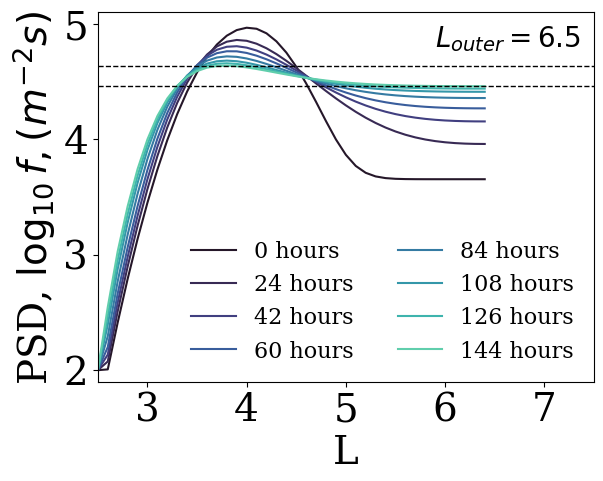

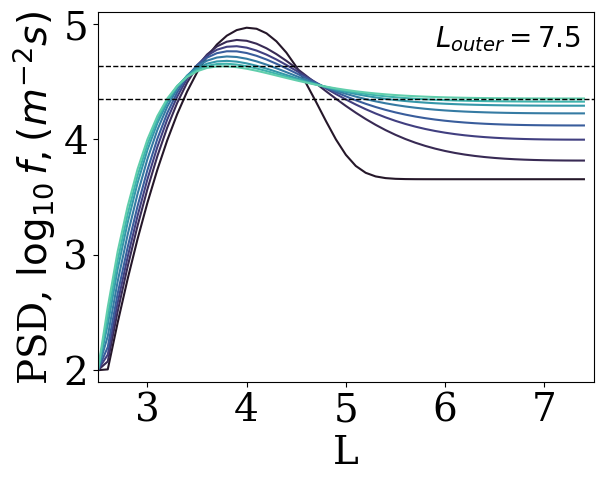

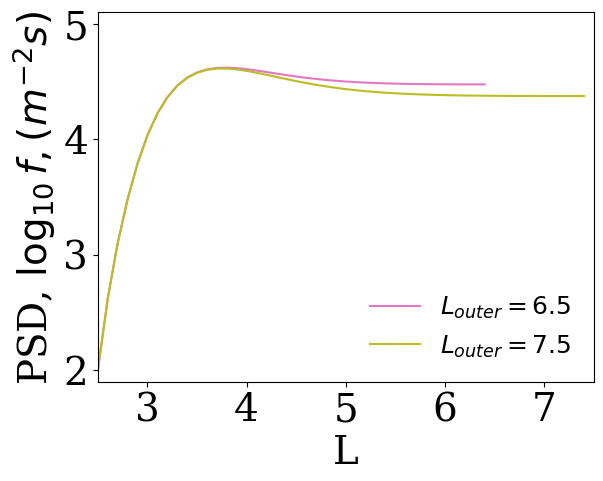

In [ ]:
#and plot bits of each to compare


# a three panel plot, so bigger fonts
matplotlib.rcParams.update({'font.size': 28})
matplotlib.rcParams.update({'legend.fontsize': 20})

log_arr = np.array(psd_array_Oz_N)
log_arr[log_arr<1E-3] = 100
log_arr = np.log10(log_arr)


log_arr2 = np.array(psd_array_Oz_N2)
log_arr2[log_arr2<1E-3] = 100
log_arr2 = np.log10(log_arr2)


fig1, ax1 = plt.subplots()
temp1,labels1 = plot_cutthroughs(fig1,ax1,log_arr,L_N)
ax1.set_xlim([2.5,7.5])
ax1.set_xticks([3,4,5,6,7])
ax1.set_ylim([1.9,5.1])
#ax1.set_title('8 cut throughs, $L_{outer}=6.5$, Kp=4, Neumann ')
ax1.set_xlabel('L')
ax1.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax1.legend(labels1,fontsize=16,ncol=2,frameon=False)
ax1.text(5.9,4.8,'$L_{outer}=6.5$',fontsize=20)

# including a straight line for refences
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
max65 = np.log10(np.max(psd_array_Oz_N[cutthrough_ind][:]))
ob65 = np.log10(psd_array_Oz_N[cutthrough_ind][-1])
ax1.plot([2.5,7.5],[max65,max65],'k',linestyle='dashed',linewidth=1)
ax1.plot([2.5,7.5],[ob65,ob65],'k',linestyle='dashed',linewidth=1)

fig1.savefig('figs/cutthroughsL65.pdf',dpi = 600,bbox_inches='tight')
fig1.savefig('figs/cutthroughsL65.svg',dpi = 600,bbox_inches='tight')

fig2, ax2 = plt.subplots()
temp2,labels2 = plot_cutthroughs(fig2,ax2,log_arr2,L_N2)
ax2.set_xlim([2.5,7.5])
ax2.set_ylim([1.9,5.1])
ax2.set_xticks([3,4,5,6,7])
#ax2.set_title('8 cut throughs, $L_{outer}=7.5$, Kp=4, Neumann ')
ax2.set_xlabel('L')
ax2.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax2.text(5.9,4.8,'$L_{outer}=7.5$',fontsize=20)
#ax2.legend(labels2,fontsize=16,ncol=2,frameon=False)


cutthrough_ind = np.round(np.linspace(0,log_arr2.shape[0], 9 )).astype(int)[-2]
max75 = np.log10(np.max(psd_array_Oz_N2[cutthrough_ind][:]))
ob75 = np.log10(psd_array_Oz_N2[cutthrough_ind][-1])
ax2.plot([2.5,7.5],[max75,max75],'k',linestyle='dashed',linewidth=1)
ax2.plot([2.5,7.5],[ob75,ob75],'k',linestyle='dashed',linewidth=1)


fig2.savefig('figs/cutthroughsL75.pdf',dpi = 600,bbox_inches='tight')
fig2.savefig('figs/cutthroughsL75.svg',dpi = 600,bbox_inches='tight')


# and the last of each plot
  # plot 2 - the final psds
fig3, ax3 = plt.subplots()
ax3.plot(L_N,log_arr[-1][:],color='tab:pink')#psd_array_N[-1][:])
ax3.plot(L_N2,log_arr2[-1][:],color='tab:olive')#psd_array_N2[-1][:])
ax3.set_xlim([2.5,7.5])
ax3.set_xticks([3,4,5,6,7])
ax3.set_ylim([1.9,5.1])
ax3.set_xlabel('L')
ax3.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax3.legend(['$L_{outer}=6.5$','$L_{outer}=7.5$'], fontsize=18, frameon=False,loc='lower right')
fig3.savefig('figs/L6575endexamples.pdf',dpi = 600,bbox_inches='tight')
fig3.savefig('figs/L6575endexamples.svg',dpi = 600,bbox_inches='tight')

reset_fonts()

## Neumann, including loss

In [ ]:
# # Heatmap showing one example: Run once with L=6.5 and Kp = 4 LOSS RATE VERSION
# psd_array_Oz_N_LR,L_N, D_Oz_N = single_run({},
#                              **{'kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4'})

# # Make a run with a more distant boundary to compare; plot cutthroughs of both
# psd_array_Oz_N2_LR, L_N2,D_Oz_N2 = single_run({},**{'kp':4,'L_outer':7.5,'loss':'Shprits2007-eq4'})

# # save these
# np.savetxt("csv-outputs/psd_array_Oz_N_LR.csv",np.array(psd_array_Oz_N_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_Oz_N2_LR.csv",np.array(psd_array_Oz_N2_LR),delimiter=",")
# np.savetxt("csv-outputs/D_Oz_N_LR.csv",np.array(D_Oz_N_LR),delimiter=",")
# np.savetxt("csv-outputs/D_Oz_N2_LR.csv",np.array(D_Oz_N2_LR),delimiter=",")

KeyboardInterrupt: 

In [ ]:
# read them in

df = pd.read_csv('psd_array_Oz_N_LR.csv', sep=',', header=None)
psd_array_Oz_N_LR = df.values
df = pd.read_csv('psd_array_Oz_N2_LR.csv', sep=',', header=None)
psd_array_Oz_N2_LR = df.values


FileNotFoundError: [Errno 2] No such file or directory: 'psd_array_Oz_N_LR.csv'

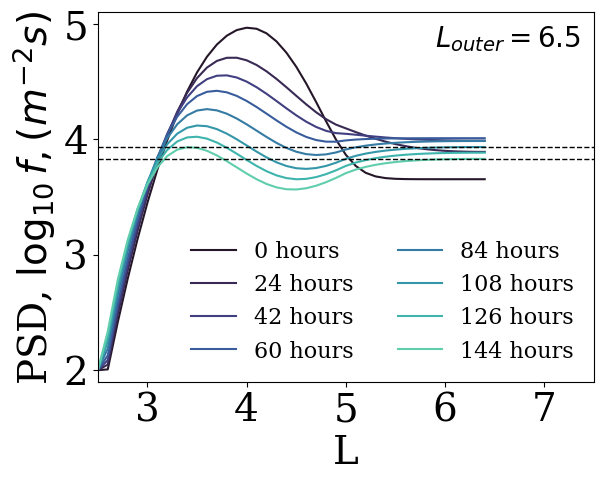

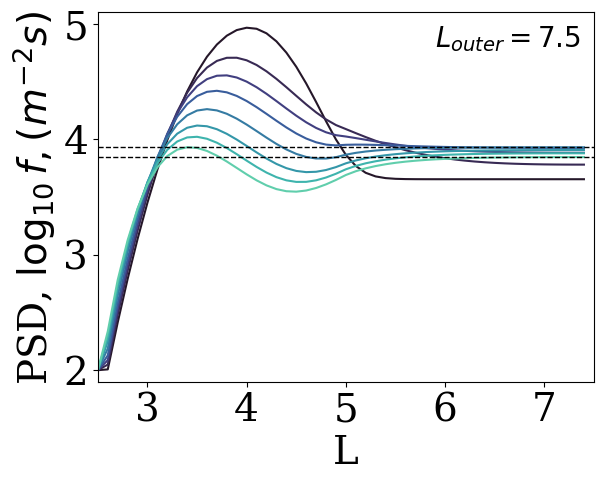

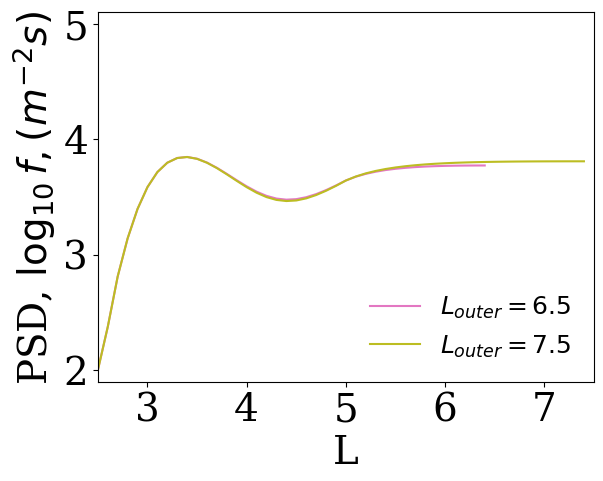

In [ ]:
#and plot bits of each to compare


# a three panel plot, so bigger fonts
matplotlib.rcParams.update({'font.size': 28})
matplotlib.rcParams.update({'legend.fontsize': 20})

log_arr = np.array(psd_array_Oz_N_LR)
log_arr[log_arr<1E-3] = 100
log_arr = np.log10(log_arr)


log_arr2 = np.array(psd_array_Oz_N2_LR)
log_arr2[log_arr2<1E-3] = 100
log_arr2 = np.log10(log_arr2)


fig1, ax1 = plt.subplots()
temp1, labels1 = plot_cutthroughs(fig1,ax1,log_arr,L_N)
ax1.set_xlim([2.5,7.5])
ax1.set_ylim([1.9,5.1])
ax1.set_xticks([3,4,5,6,7])
#ax1.set_title('8 cut throughs, $L_{outer}=6.5$, Kp=4, Neumann ')
ax1.set_xlabel('L')
ax1.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax1.legend(labels1,fontsize=16,ncol=2,frameon=False)
ax1.text(5.9,4.8,'$L_{outer}=6.5$',fontsize=20)

# including a straight line for refences
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
max65 = np.log10(np.max(psd_array_Oz_N_LR[cutthrough_ind][:]))
ob65 = np.log10(psd_array_Oz_N_LR[cutthrough_ind][-1])
ax1.plot([2.5,7.5],[max65,max65],'k',linestyle='dashed',linewidth=1)
ax1.plot([2.5,7.5],[ob65,ob65],'k',linestyle='dashed',linewidth=1)

fig1.savefig('figs/cutthroughsL65_LR.pdf',dpi = 600,bbox_inches='tight')
fig1.savefig('figs/cutthroughsL65_LR.svg',dpi = 600,bbox_inches='tight')

fig2, ax2 = plt.subplots()
temp2, labels2 = plot_cutthroughs(fig2,ax2,log_arr2,L_N2)
ax2.set_xlim([2.5,7.5])
ax2.set_ylim([1.9,5.1])
ax2.set_xticks([3,4,5,6,7])
ax2.set_xlabel('L')
ax2.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax2.text(5.9,4.8,'$L_{outer}=7.5$',fontsize=20)


cutthrough_ind = np.round(np.linspace(0,log_arr2.shape[0], 9 )).astype(int)[-2]
max75 = np.log10(np.max(psd_array_Oz_N2_LR[cutthrough_ind][:]))
ob75 = np.log10(psd_array_Oz_N2_LR[cutthrough_ind][-1])
ax2.plot([2.5,7.5],[max75,max75],'k',linestyle='dashed',linewidth=1)
ax2.plot([2.5,7.5],[ob75,ob75],'k',linestyle='dashed',linewidth=1)


fig2.savefig('figs/cutthroughsL75_LR.pdf',dpi = 600,bbox_inches='tight')
fig2.savefig('figs/cutthroughsL75_LR.svg',dpi = 600,bbox_inches='tight')


# and the last of each plot
  # plot 2 - the final psds
fig3, ax3 = plt.subplots()
ax3.plot(L_N,log_arr[-1][:],color='tab:pink')#psd_array_N[-1][:])
ax3.plot(L_N2,log_arr2[-1][:],color='tab:olive')#psd_array_N2[-1][:])
ax3.set_xlim([2.5,7.5])
ax3.set_xticks([3,4,5,6,7])
ax3.set_ylim([1.9,5.1])
ax3.set_xlabel('L')
ax3.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax3.legend(['$L_{outer}=6.5$','$L_{outer}=7.5$'], fontsize=18, frameon=False,loc='lower right')
fig3.savefig('figs/L6575endexamples_LR.pdf',dpi = 600,bbox_inches='tight')
fig3.savefig('figs/L6575endexamples_LR.svg',dpi = 600,bbox_inches='tight')

reset_fonts()

## Dirichlet, no loss


In [ ]:
# # Make a run with a more distant boundary to compare; plot cutthroughs of both
# psd_array_Oz_D2, L_D2,D_Oz_D2 = single_run({},**{'rtype':'d','kp':4,'L_outer':7.5})


# # save these
# np.savetxt("csv-outputs/psd_array_Oz_D2.csv",np.array(psd_array_Oz_D2),delimiter=",")
# np.savetxt("csv-outputs/D_Oz_D2.csv",np.array(D_Oz_D2),delimiter=",")
# np.savetxt("csv-outputs/L_D2.csv",np.array(L_D2),delimiter=",")

In [ ]:

df = pd.read_csv('psd_array_Oz_D.csv', sep=',', header=None)
psd_array_Oz_D = df.values
df = pd.read_csv('psd_array_Oz_D2.csv', sep=',', header=None)
psd_array_Oz_D2 = df.values

df = pd.read_csv('L_D.csv', sep=',', header=None)
L_D = df.values
df = pd.read_csv('L_D2.csv', sep=',', header=None)
L_D2 = df.values

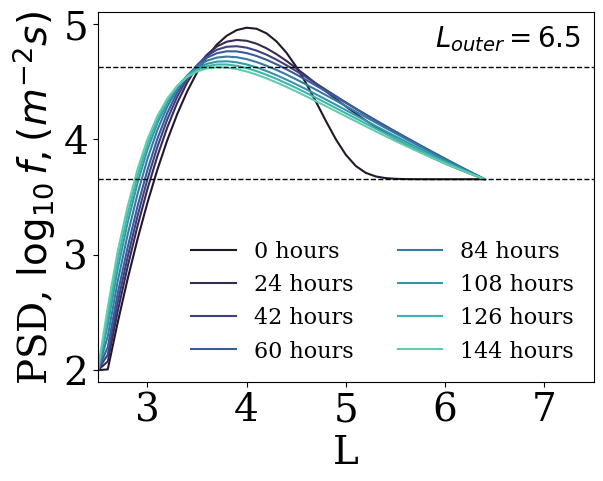

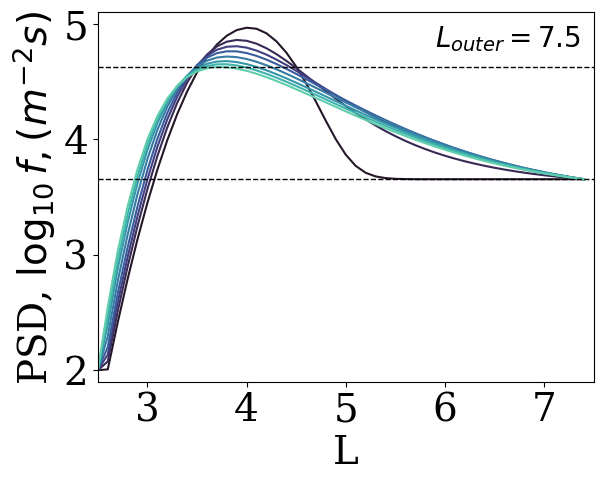

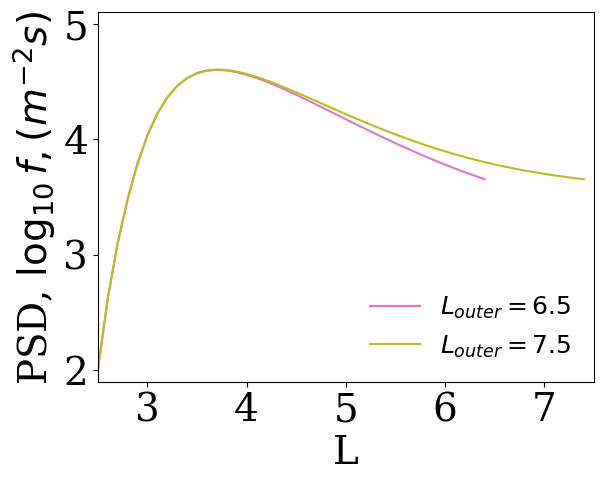

In [ ]:
#and plot bits of each to compare


# a three panel plot, so bigger fonts
matplotlib.rcParams.update({'font.size': 28})
matplotlib.rcParams.update({'legend.fontsize': 20})

log_arr = np.array(psd_array_Oz_D)
log_arr[log_arr<1E-3] = 100
log_arr = np.log10(log_arr)


log_arr2 = np.array(psd_array_Oz_D2)
log_arr2[log_arr2<1E-3] = 100
log_arr2 = np.log10(log_arr2)


fig1, ax1 = plt.subplots()
temp1, labels1 = plot_cutthroughs(fig1,ax1,log_arr,L_D)
ax1.set_xlim([2.5,7.5])
ax1.set_xticks([3,4,5,6,7])
ax1.set_ylim([1.9,5.1])
#ax1.set_title('8 cut throughs, $L_{outer}=6.5$, Kp=4, Neumann ')
ax1.set_xlabel('L')
ax1.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax1.legend(labels1,fontsize=16,ncol=2,frameon=False)
ax1.text(5.9,4.8,'$L_{outer}=6.5$',fontsize=20)

# including a straight line for refences
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
max65 = np.log10(np.max(psd_array_Oz_D[cutthrough_ind][:]))
ob65 = np.log10(psd_array_Oz_D[cutthrough_ind][-1])
ax1.plot([2.5,7.5],[max65,max65],'k',linestyle='dashed',linewidth=1)
ax1.plot([2.5,7.5],[ob65,ob65],'k',linestyle='dashed',linewidth=1)

fig1.savefig('figs/cutthroughsL65_D.pdf',dpi = 600,bbox_inches='tight')
fig1.savefig('figs/cutthroughsL65_D.svg',dpi = 600,bbox_inches='tight')

fig2, ax2 = plt.subplots()
temp2, labels2 = plot_cutthroughs(fig2,ax2,log_arr2,L_D2)
ax2.set_xlim([2.5,7.5])
ax2.set_ylim([1.9,5.1])
ax2.set_xticks([3,4,5,6,7])
#ax2.set_title('8 cut throughs, $L_{outer}=7.5$, Kp=4, Neumann ')
ax2.set_xlabel('L')
ax2.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax2.text(5.9,4.8,'$L_{outer}=7.5$',fontsize=20)


cutthrough_ind = np.round(np.linspace(0,log_arr2.shape[0], 9 )).astype(int)[-2]
max75 = np.log10(np.max(psd_array_Oz_D2[cutthrough_ind][:]))
ob75 = np.log10(psd_array_Oz_D2[cutthrough_ind][-1])
ax2.plot([2.5,7.5],[max75,max75],'k',linestyle='dashed',linewidth=1)
ax2.plot([2.5,7.5],[ob75,ob75],'k',linestyle='dashed',linewidth=1)


fig2.savefig('figs/cutthroughsL75_D.pdf',dpi = 600,bbox_inches='tight')
fig2.savefig('figs/cutthroughsL75_D.svg',dpi = 600,bbox_inches='tight')


# and the last of each plot
  # plot 2 - the final psds
fig3, ax3 = plt.subplots()
ax3.plot(L_D,log_arr[-1][:],color='tab:pink')#psd_array_N[-1][:])
ax3.plot(L_D2,log_arr2[-1][:],color='tab:olive')#psd_array_N2[-1][:])
ax3.set_xlim([2.5,7.5])
ax3.set_xticks([3,4,5,6,7])
ax3.set_ylim([1.9,5.1])
ax3.set_xlabel('L')
ax3.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax3.legend(['$L_{outer}=6.5$','$L_{outer}=7.5$'], fontsize=18, frameon=False,loc='lower right')
fig3.savefig('figs/L6575endexamples_D.pdf',dpi = 600,bbox_inches='tight')
fig3.savefig('figs/L6575endexamples_D.svg',dpi = 600,bbox_inches='tight')

reset_fonts()

## Dirichlet inlcuding loss

In [ ]:
# Heatmap showing one example: Run once with L=6.5 and Kp = 4 LOSS RATE VERSION
psd_array_Oz_D_LR,L_D, D_Oz_D = single_run({},
                             **{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4'})

# Make a run with a more distant boundary to compare; plot cutthroughs of both
psd_array_Oz_D2_LR, L_D2,D_Oz_D2 = single_run({},**{'rtype':'d','kp':4,'L_outer':7.5,'loss':'Shprits2007-eq4'})

# save these
np.savetxt("csv-outputs/psd_array_Oz_D_LR.csv",np.array(psd_array_Oz_D_LR),delimiter=",")
np.savetxt("csv-outputs/psd_array_Oz_D2_LR.csv",np.array(psd_array_Oz_D2_LR),delimiter=",")

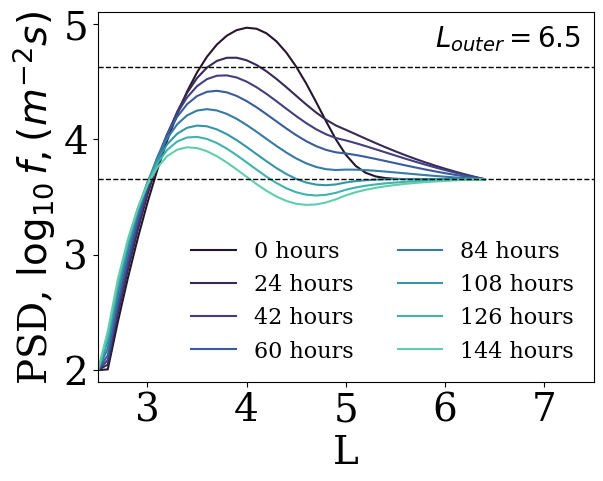

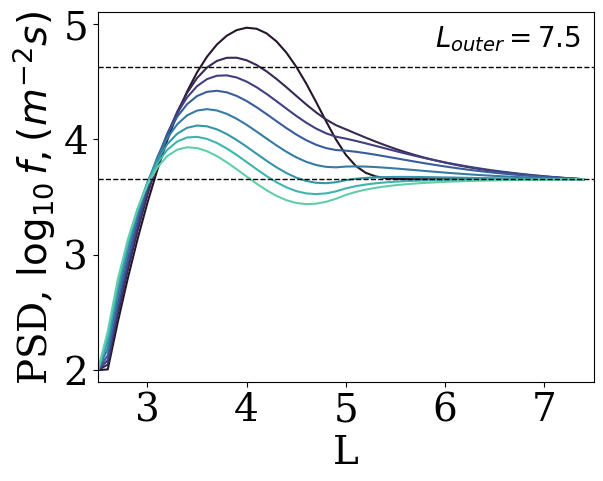

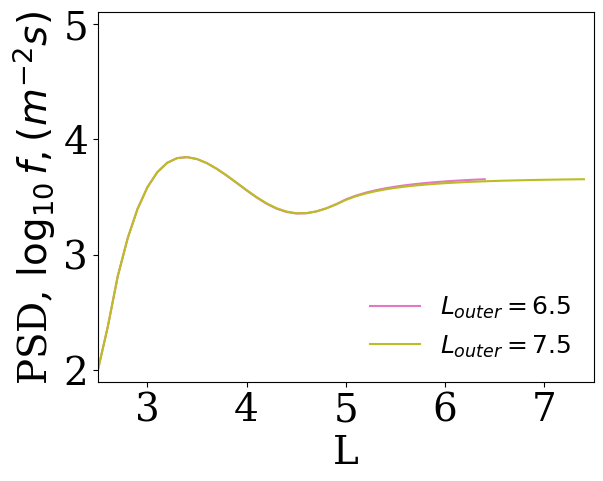

In [ ]:
#and plot bits of each to compare


# a three panel plot, so bigger fonts
matplotlib.rcParams.update({'font.size': 28})
matplotlib.rcParams.update({'legend.fontsize': 20})

log_arr = np.array(psd_array_Oz_D_LR)
log_arr[log_arr<1E-3] = 100
log_arr = np.log10(log_arr)


log_arr2 = np.array(psd_array_Oz_D2_LR)
log_arr2[log_arr2<1E-3] = 100
log_arr2 = np.log10(log_arr2)


fig1, ax1 = plt.subplots()
temp1 = plot_cutthroughs(fig1,ax1,log_arr,L_D)
ax1.set_xlim([2.5,7.5])
ax1.set_ylim([1.9,5.1])
ax1.set_xticks([3,4,5,6,7])
#ax1.set_title('8 cut throughs, $L_{outer}=6.5$, Kp=4, Neumann ')
ax1.set_xlabel('L')
ax1.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax1.legend(labels1,fontsize=16,ncol=2,frameon=False)
ax1.text(5.9,4.8,'$L_{outer}=6.5$',fontsize=20)

# including a straight line for refences
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
max65 = np.log10(np.max(psd_array_Oz_D[cutthrough_ind][:]))
ob65 = np.log10(psd_array_Oz_D[cutthrough_ind][-1])
ax1.plot([2.5,7.5],[max65,max65],'k',linestyle='dashed',linewidth=1)
ax1.plot([2.5,7.5],[ob65,ob65],'k',linestyle='dashed',linewidth=1)

fig1.savefig('figs/cutthroughsL65_D_LR.pdf',dpi = 600,bbox_inches='tight')
fig1.savefig('figs/cutthroughsL65_D_LR.svg',dpi = 600,bbox_inches='tight')

fig2, ax2 = plt.subplots()
temp2 = plot_cutthroughs(fig2,ax2,log_arr2,L_N2)
ax2.set_xlim([2.5,7.5])
ax2.set_ylim([1.9,5.1])
ax2.set_xticks([3,4,5,6,7])
#ax2.set_title('8 cut throughs, $L_{outer}=7.5$, Kp=4, Neumann ')
ax2.set_xlabel('L')
#ax2.set_ylabel('PSD')
ax2.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax2.text(5.9,4.8,'$L_{outer}=7.5$',fontsize=20)


cutthrough_ind = np.round(np.linspace(0,log_arr2.shape[0], 9 )).astype(int)[-2]
max75 = np.log10(np.max(psd_array_Oz_D2[cutthrough_ind][:]))
ob75 = np.log10(psd_array_Oz_D2[cutthrough_ind][-1])
ax2.plot([2.5,7.5],[max75,max75],'k',linestyle='dashed',linewidth=1)
ax2.plot([2.5,7.5],[ob75,ob75],'k',linestyle='dashed',linewidth=1)


fig2.savefig('figs/cutthroughsL75_D_LR.pdf',dpi = 600,bbox_inches='tight')
fig2.savefig('figs/cutthroughsL75_D_LR.svg',dpi = 600,bbox_inches='tight')


# and the last of each plot
  # plot 2 - the final psds
fig3, ax3 = plt.subplots()
ax3.plot(L_D,log_arr[-1][:],color='tab:pink')#psd_array_N[-1][:])
ax3.plot(L_D2,log_arr2[-1][:],color='tab:olive')#psd_array_N2[-1][:])
ax3.set_xlim([2.5,7.5])
ax3.set_xticks([3,4,5,6,7])
ax3.set_ylim([1.9,5.1])
ax3.set_xlabel('L')
ax3.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax3.legend(['$L_{outer}=6.5$','$L_{outer}=7.5$'], fontsize=18, frameon=False,loc='lower right')
fig3.savefig('figs/L6575endexamples_D_LR.pdf',dpi = 600,bbox_inches='tight')
fig3.savefig('figs/L6575endexamples_D_LR.svg',dpi = 600,bbox_inches='tight')

reset_fonts()

## $L_p$ Cutthroughs

In [ ]:
# read in the run above
df = pd.read_csv('psd_array_N_LR.csv', sep=',', header=None)
psd_array_N_LR = df.values
df = pd.read_csv('psd_array_D_LR.csv', sep=',', header=None)
psd_array_D_LR = df.values

df = pd.read_csv('psd_array_N_Lp3p5_LR.csv', sep=',', header=None)
psd_array_N_Lp3p5_LR = df.values
df = pd.read_csv('psd_array_D_Lp3p5_LR.csv', sep=',', header=None)
psd_array_D_Lp3p5_LR = df.values

df = pd.read_csv('psd_array_N_Lp6_LR.csv', sep=',', header=None)
psd_array_N_Lp6_LR = df.values
df = pd.read_csv('psd_array_D_Lp6_LR.csv', sep=',', header=None)
psd_array_D_Lp6_LR = df.values


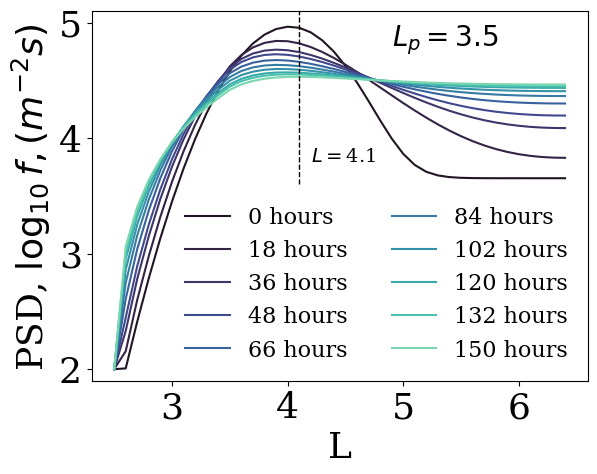

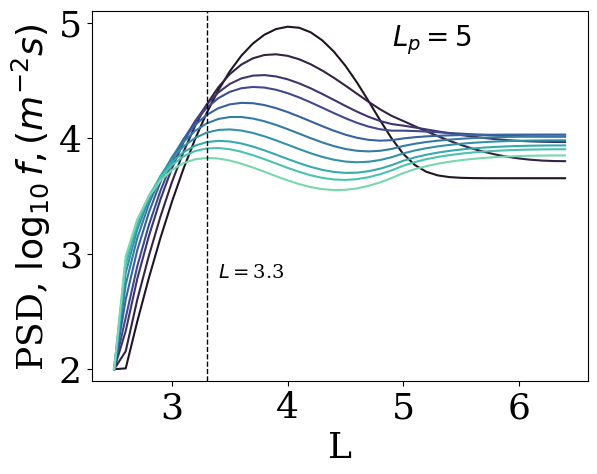

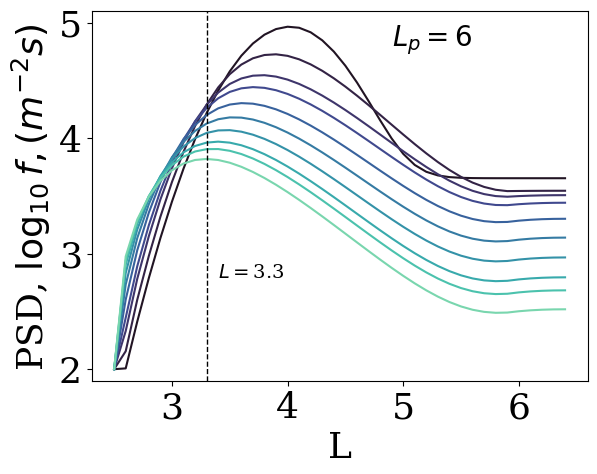

In [ ]:


temp = np.array(psd_array_N_Lp3p5_LR)
temp[temp<1E-3] = 100
temp = np.log10(temp)

fig1, ax1 = plt.subplots()
temp1, labels1 = plot_cutthroughs(fig1,ax1,temp,L_N,num_cutthroughs=10)
ax1.set_xlabel('L')
ax1.set_xticks([3,4,5,6,7])
ax1.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax1.legend(labels1,fontsize=16,ncol=2,frameon=False)
ax1.text(4.9,4.8,'$L_p=3.5$',fontsize=20)
ax1.set_ylim([1.9,5.1])


# indicate peak location at end of simulation
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
peak_val = np.max(psd_array_N_Lp3p5_LR[cutthrough_ind][:])
peak_loc = np.where(psd_array_N_Lp3p5_LR[cutthrough_ind][:] == peak_val)
peak_loc = L_N[peak_loc]
ax1.plot(peak_loc*[1,1],[3.6,5.1],'k',linestyle='dashed',linewidth=1)
ax1.text(peak_loc+0.1,3.8,f"$L=${peak_loc[0]:.1f}",fontsize=14)




fig1.savefig('figs/cutthroughsLp3p5-N.pdf',dpi = 600,bbox_inches='tight')


temp = np.array(psd_array_N_LR)
temp[temp<1E-3] = 100
temp = np.log10(temp)

fig2, ax2 = plt.subplots()
temp2,labels2 = plot_cutthroughs(fig2,ax2,temp,L_N,num_cutthroughs=10)
ax2.set_xlabel('L')
ax2.set_xticks([3,4,5,6,7])
ax2.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax2.text(4.9,4.8,'$L_p=5$',fontsize=20)
ax2.set_ylim([1.9,5.1])


# indicate peak location at end of simulation
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
temp_vals = psd_array_N_LR[cutthrough_ind][:]; temp_vals[12:]= 0;
peak_val = np.max(temp_vals)
peak_loc = np.where(psd_array_N_LR[cutthrough_ind][:] == peak_val)
peak_loc = L_N[peak_loc]
ax2.plot(peak_loc*[1,1],[1.9,5.1],'k',linestyle='dashed',linewidth=1)
ax2.text(peak_loc+0.1,2.8,f"$L=${peak_loc[0]:.1f}",fontsize=14)


fig2.savefig('figs/cutthroughsLp5-N.pdf',dpi = 600,bbox_inches='tight')

temp = np.array(psd_array_N_Lp6_LR)
temp[temp<1E-3] = 100
temp = np.log10(temp)

fig3, ax3 = plt.subplots()
temp3, labels3 = plot_cutthroughs(fig3,ax3,temp,L_N,num_cutthroughs=10)
ax3.set_xlabel('L')
ax3.set_xticks([3,4,5,6,7])
ax3.set_ylim([1.9,5.1])
ax3.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax3.text(4.9,4.8,'$L_p=6$',fontsize=20)



# indicate peak location at end of simulation
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
peak_val = np.max(psd_array_N_Lp6_LR[cutthrough_ind][:])
peak_loc = np.where(psd_array_N_Lp6_LR[cutthrough_ind][:] == peak_val)
peak_loc = L_N[peak_loc]
ax3.plot(peak_loc*[1,1],[1.9,5.1],'k',linestyle='dashed',linewidth=1)
ax3.text(peak_loc+0.1,2.8,f"$L=${peak_loc[0]:.1f}",fontsize=14)

fig3.savefig('figs/cutthroughsLp6-N.pdf',dpi = 600,bbox_inches='tight')

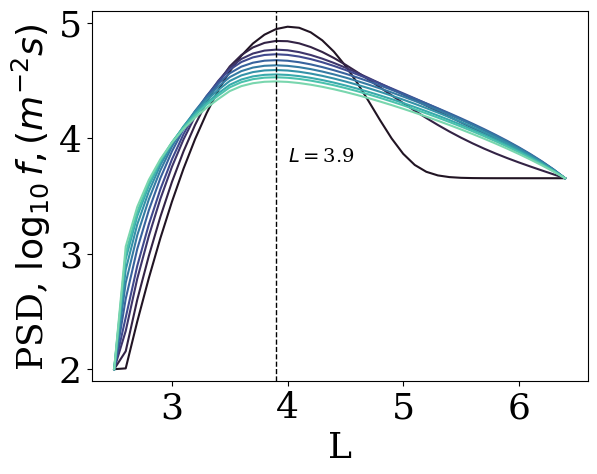

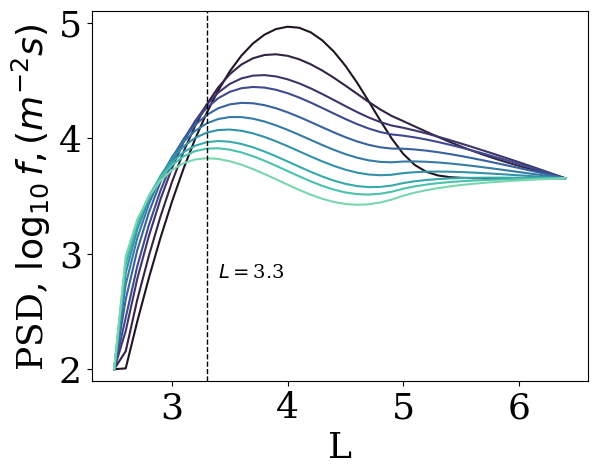

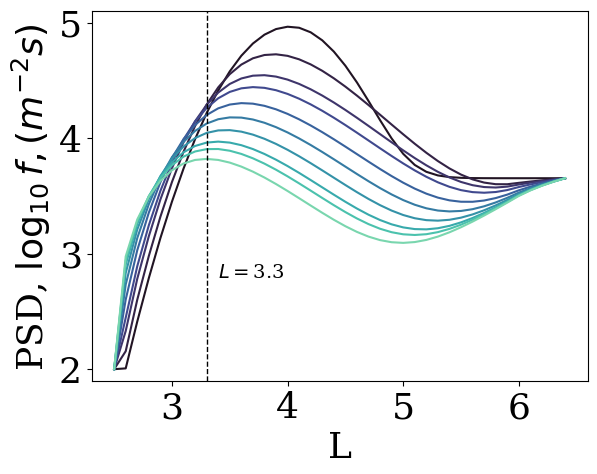

In [ ]:


temp = np.array(psd_array_D_Lp3p5_LR)
temp[temp<1E-3] = 100
temp = np.log10(temp)

fig1, ax1 = plt.subplots()
temp1,labels1 = plot_cutthroughs(fig1,ax1,temp,L_N,num_cutthroughs=10)
ax1.set_xlabel('L')
ax1.set_xticks([3,4,5,6,7])
ax1.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax1.set_ylim([1.9,5.1])


# indicate peak location at end of simulation
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
peak_val = np.max(psd_array_D_Lp3p5_LR[cutthrough_ind][:])
peak_loc = np.where(psd_array_D_Lp3p5_LR[cutthrough_ind][:] == peak_val)
peak_loc = L_N[peak_loc]
ax1.plot(peak_loc*[1,1],[1.9,5.1],'k',linestyle='dashed',linewidth=1)
ax1.text(peak_loc+0.1,3.8,f"$L=${peak_loc[0]:.1f}",fontsize=14)


fig1.savefig('figs/cutthroughsLp3p5-D.pdf',dpi = 600,bbox_inches='tight')


temp = np.array(psd_array_D_LR)
temp[temp<1E-3] = 100
temp = np.log10(temp)

fig2, ax2 = plt.subplots()
temp2, labels2 = plot_cutthroughs(fig2,ax2,temp,L_N,num_cutthroughs=10)
ax2.set_xlabel('L')
ax2.set_xticks([3,4,5,6,7])
ax2.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')
ax2.set_ylim([1.9,5.1])


# indicate peak location at end of simulation
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
temp_vals = psd_array_D_LR[cutthrough_ind][:]; temp_vals[12:]= 0;
peak_val = np.max(temp_vals)
peak_loc = np.where(psd_array_D_LR[cutthrough_ind][:] == peak_val)
peak_loc = L_N[peak_loc]
ax2.plot(peak_loc*[1,1],[1.9,5.1],'k',linestyle='dashed',linewidth=1)
ax2.text(peak_loc+0.1,2.8,f"$L=${peak_loc[0]:.1f}",fontsize=14)

fig2.savefig('figs/cutthroughsLp5-D.pdf',dpi = 600,bbox_inches='tight')

temp = np.array(psd_array_D_Lp6_LR)
temp[temp<1E-3] = 100
temp = np.log10(temp)

fig3, ax3 = plt.subplots()
temp3,labels3 = plot_cutthroughs(fig3,ax3,temp,L_N,num_cutthroughs=10)
ax3.set_xlabel('L')
ax3.set_xticks([3,4,5,6,7])
ax3.set_ylim([1.9,5.1])
ax3.set_ylabel('PSD, $\log_{10}{f}, (m^{-2}s)$')


# indicate peak location at end of simulation
cutthrough_ind = np.round(np.linspace(0,log_arr.shape[0], 9 )).astype(int)[-2]
peak_val = np.max(psd_array_D_Lp6_LR[cutthrough_ind][:])
peak_loc = np.where(psd_array_D_Lp6_LR[cutthrough_ind][:] == peak_val)
peak_loc = L_N[peak_loc]
ax3.plot(peak_loc*[1,1],[1.9,5.1],'k',linestyle='dashed',linewidth=1)
ax3.text(peak_loc+0.1,2.8,f"$L=${peak_loc[0]:.1f}",fontsize=14)



fig3.savefig('figs/cutthroughsLp6-D.pdf',dpi = 600,bbox_inches='tight')

# Gradients vs DLL ratio

very similar! what are the actual mass, energy percentages?


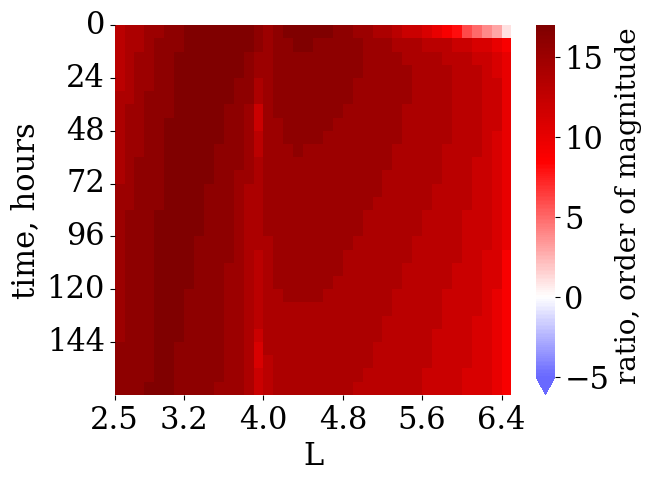

In [ ]:
# heatmap, order of magnitude ratio

matplotlib.rcParams.update({'font.size': 22})
#matplotlib.rcParams.update({'legend.fontsize': 20})


fig,ax = plt.subplots()
heatmap_cmap = sns.color_palette("seismic", as_cmap=True)
#heatmap_cmap = sns.color_palette("vlag", as_cmap=True)
# naughty, define these properly earlier
dt = 10
dl = 0.1
n =6
#f_return = 6*60*60/dt # every six hours, in seconds
f_return = 6 # every six hours, in hours
D_0 = 2.16 * 10**(-8) * 10**(0.217*5 + 0.461*4) # the scaling used in diffusion coefficient
D_0 =D_0/86400 # in sensible units of seconds^-1 rather than days^-1



# get all gradients
grads= []
for row in range(np.shape(psd_array_N)[0]):
    thisPSD = psd_array_N[row]
    fL = np.gradient(thisPSD, L_N)
    fL[-1] = (thisPSD[-1]-thisPSD[-2])/(2*dl)
    fL[0] = thisPSD[1]/(2*dl)


    grads.append(fL)


ratio = []
for row in range(np.shape(psd_array_N)[0]):
    fL_term = np.power(np.array(grads[row]),2)
    L_term = D_0*np.power(L_N,n-2)
    this_ratio = np.divide(fL_term, L_term)

    ratio.append(this_ratio)

e3_ratio = np.floor(np.log10(np.array(ratio)))



time_dim = np.array(psd_array_N).shape[0]
hmap = sns.heatmap(e3_ratio,cmap=heatmap_cmap,ax=ax,cbar=True,cbar_kws={'label':'ratio, order of magnitude ','extend':'min','ticks':[-5,0,5,10,15]},center=0,vmin=-5)#,vmax=5)
# max is actually 4.956
#cbar.set_label('PSD')

# set size https://stackoverflow.com/questions/48586738/seaborn-heatmap-colorbar-label-font-size
ax.figure.axes[-1].yaxis.label.set_size(20)



#cticks = ticks = [float(t.get_text().replace('−','-')) for t in cbar.ax.get_yticklabels()]
#cbar.ax.set_yticklabels([np.log10(tick) for tick in cticks])


ax.set_xlabel('L')
ax.set_ylabel('time, hours')


allyticklabels = f_return*np.arange(0,time_dim)
allxticklabels = L_N

numlabels = 6
ytick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)
xtick_ints = np.linspace(0, len(allxticklabels) - 1, numlabels ).astype(int)

ax.set_xticks(xtick_ints)
ax.set_xticklabels(allxticklabels[xtick_ints],rotation=0)
ax.set_yticks(ytick_ints)
ax.set_yticklabels(allyticklabels[ytick_ints],rotation=0)


#ax.set_title('$L_{outer}$=6.5, Kp=4, Neumann OBC')
fig.savefig('figs/e3_terms_week_N.pdf',dpi = 600,bbox_inches='tight')
fig.savefig('figs/e3_terms_week_N.svg',dpi = 600,bbox_inches='tight')

reset_fonts()

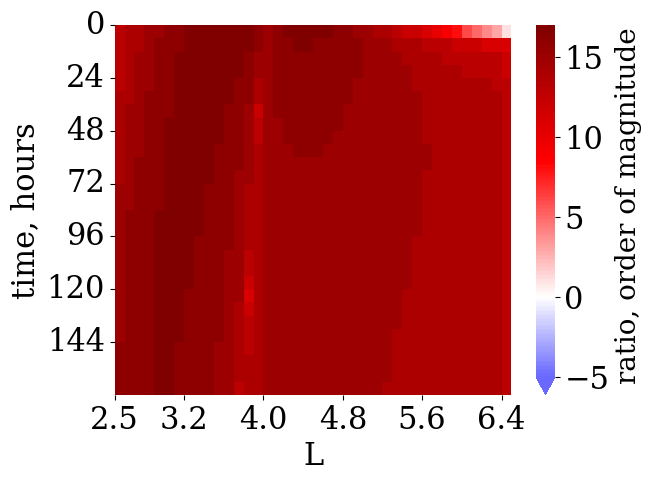

In [ ]:
# heatmap, order of magnitude ratio, Dirichlet

matplotlib.rcParams.update({'font.size': 22})

fig,ax = plt.subplots()
heatmap_cmap = sns.color_palette("seismic", as_cmap=True)
#heatmap_cmap = sns.color_palette("vlag", as_cmap=True)
# naughty, define these properly earlier
dt = 10
dl = 0.1
n =6
#f_return = 6*60*60/dt # every six hours, in seconds
f_return = 6 # every six hours, in hours


# get all gradients
grads= []
for row in range(np.shape(psd_array_D)[0]):
    thisPSD = psd_array_D[row]
    fL = np.gradient(thisPSD, L_D)
    fL[-1] = (thisPSD[-1]-thisPSD[-2])/(2*dl)
    fL[0] = thisPSD[1]/(2*dl)

    grads.append(fL)


ratio = []
for row in range(np.shape(psd_array_D)[0]):
    fL_term = np.power(np.array(grads[row]),2)
    L_term = D_0*np.power(L_D,n-2)
    this_ratio = np.divide(fL_term, L_term)

    ratio.append(this_ratio)

e3_ratio = np.floor(np.log10(np.array(ratio)))



time_dim = np.array(psd_array_D).shape[0]
hmap = sns.heatmap(e3_ratio,cmap=heatmap_cmap,ax=ax,cbar=True,cbar_kws={'label':'ratio, order of magnitude ','extend':'min','ticks':[-5,0,5,10,15]},center=0,vmin=-5)#,vmax=5)
# max is actually 4.956
#cbar.set_label('PSD')

# set size https://stackoverflow.com/questions/48586738/seaborn-heatmap-colorbar-label-font-size
ax.figure.axes[-1].yaxis.label.set_size(20)


#cticks = ticks = [float(t.get_text().replace('−','-')) for t in cbar.ax.get_yticklabels()]
#cbar.ax.set_yticklabels([np.log10(tick) for tick in cticks])


ax.set_xlabel('L')
ax.set_ylabel('time, hours')


allyticklabels = f_return*np.arange(0,time_dim)
allxticklabels = L_N

numlabels = 6
ytick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)
xtick_ints = np.linspace(0, len(allxticklabels) - 1, numlabels ).astype(int)

ax.set_xticks(xtick_ints)
ax.set_xticklabels(allxticklabels[xtick_ints],rotation=0)
ax.set_yticks(ytick_ints)
ax.set_yticklabels(allyticklabels[ytick_ints],rotation=0)


#ax.set_title('$L_{outer}$=6.5, Kp=4, Neumann OBC')
fig.savefig('figs/e3_terms_week_D.pdf',dpi = 600,bbox_inches='tight')
fig.savefig('figs/e3_terms_week_D.svg',dpi = 600,bbox_inches='tight')

reset_fonts()

# Investigating energy and mass terms

In [ ]:
# keep previous font settings for mass energy plots because I cba to redo all the text placement
reset_fonts(style='mass-energy')

In [ ]:

D0 = 2.16 * 10**(-8) * 10**(0.217*5 + 0.461*4)/(24*60*60)
# the diffusion coefficinet constant, in seconds^{-1} rather than days^{-1}

# energy and mass terms
def N_1( PSD, L, n = 6 ):
    # return the value of the first number term
    # L^{n-2} f_L |OB
    # PSD should be the function f at one point in time

    #fL = np.gradient(PSD, L)
    #N1 = D0*np.power(L[-1],n-2)*fL[-1]

    dl = 0.1
    fL_OB = (PSD[-1]-PSD[-2])/(2*dl)
    N1 = D0*np.power(L[-1],n-2)*fL_OB

    return N1

def N_2( PSD,L,n=6 ):
    # second term for Nt
    # L^{n-2} f_L |IB

    #fL = np.gradient(PSD, L)
    #N2 = -D0*np.power(L[0],n-2)*fL[0]

    # use central difference formula
    dl = 0.1
    fL_IB = PSD[1]/(2*dl)
    N2 = -D0*np.power(L[0],n-2)*fL_IB

    return N2


def E_1( PSD, L, n=6):

    #fL = np.gradient(PSD, L)
    #E1 = D0*L[-1]**(n-2)*PSD[-1]*fL[-1]


    dl = 0.1
    fL_OB = (PSD[-1]-PSD[-2])/(2*dl)
    E1 = D0*L[-1]**(n-2)*PSD[-1]*fL_OB

    return E1



def E_2( PSD, L, n=6):

    #fL = np.gradient(PSD, L)
    #E2 = -D0*L[0]**(n-2)*PSD[0]*fL[0]

    dl = 0.1
    fL_IB = PSD[1]/(2*dl)
    E2 = -D0*L[0]**(n-2)*PSD[0]*fL_IB

    return E2

def E_3( PSD, L, n=6 ):

    fL = np.gradient(PSD, L)

    # but do the edges myself
    dl = 0.1
    fL_IB = PSD[1]/(2*dl)
    fL_OB = (PSD[-1]-PSD[-2])/(2*dl)

    fL[0] = fL_IB
    fL[-1] = fL_OB

    integrand = -D0*np.multiply( np.power(L,n-2), np.power(fL,2) )
    E3 = np.trapz( integrand, L )

    return E3


# additional loss terms
def N_loss( PSD, L, n=6, plasmapause=5 ):

    tau = LossRate(L)
    lossterm = np.divide(np.ones(np.shape(PSD)),tau)
    lossterm[L>=plasmapause] = 0

    integrand = - np.multiply( PSD , np.multiply(lossterm, np.power(L,-2)) )
    Nloss = np.trapz(integrand,L)

    return Nloss


def E_loss( PSD, L, n=6, plasmapause=5  ):

    tau = LossRate(L)
    lossterm = np.divide(np.ones(np.shape(PSD)),tau)
    lossterm[L>=plasmapause] = 0

    integrand = - np.multiply( np.power(PSD,2) , np.multiply(lossterm, np.power(L,-2)) )
    Eloss = np.trapz(integrand,L)

    return Eloss



# totals

def N_tot( PSD,L, n=6):

    integrand = np.multiply( PSD, np.power(L,-2) )
    Ntot = np.trapz(integrand,L)

    return Ntot


def E_tot( PSD,L, n=6):

    integrand = np.multiply( np.power(PSD,2), np.power(L,-2) )
    Etot = np.trapz(integrand,L)

    return Etot


In [ ]:
def find_energy_terms(psd_array,L,n = 6):
    E1_vals = []; E2_vals = []; E3_vals = []; Etot_vals = [];

    for row in range(np.shape(psd_array)[0]):
        f = psd_array[row]

        E1_vals.append( E_1(f,L,n) )
        E2_vals.append( E_2(f,L,n) )
        E3_vals.append( E_3(f,L,n) )
        Etot_vals.append( E_tot(f,L,n) )

    return E1_vals, E2_vals, E3_vals, Etot_vals


def find_energy_terms_inc_loss(psd_array,L,n = 6,plasmapause=5):
    E1_vals = []; E2_vals = []; E3_vals = []; El_vals = []; Etot_vals = [];

    for row in range(np.shape(psd_array)[0]):
        f = psd_array[row]

        E1_vals.append( E_1(f,L,n) )
        E2_vals.append( E_2(f,L,n) )
        E3_vals.append( E_3(f,L,n) )
        El_vals.append( E_loss(f,L,n,plasmapause) )
        Etot_vals.append( E_tot(f,L,n) )

    return E1_vals, E2_vals, E3_vals, El_vals, Etot_vals

In [ ]:
def find_mass_terms(psd_array,L,n=6):

    M1_vals = []; M2_vals = []; Mtot_vals =[];

    for row in range(np.shape(psd_array)[0]):
        f = psd_array[row]

        M1_vals.append( N_1(f,L,n) ) #outer boundary loss
        M2_vals.append( N_2(f,L,n) ) # inner boundary loss
        Mtot_vals.append( N_tot(f,L,n) )

    return M1_vals, M2_vals, Mtot_vals


def find_mass_terms_inc_loss(psd_array,L,n=6,plasmapause=5):

    M1_vals = []; M2_vals = []; Ml_vals = []; Mtot_vals =[];

    for row in range(np.shape(psd_array)[0]):
        f = psd_array[row]

        M1_vals.append( N_1(f,L,n) )
        M2_vals.append( N_2(f,L,n) )
        Ml_vals.append( N_loss(f,L,n,plasmapause) )
        Mtot_vals.append( N_tot(f,L,n) )

    return M1_vals, M2_vals, Ml_vals, Mtot_vals

### plotting functions

In [ ]:
# sewttings for each type
def get_line_col( runname ):
    # colour based on Dirichlet or Neumann, with or without loss

    colpal = sns.color_palette("colorblind",4)

    cols = {
        "Neumann":colpal[0][:],
        "Dirichlet":colpal[1][:],
        "Neumann loss":colpal[2][:],
        "Dirichlet loss":colpal[3][:]
    }

    col = cols.get(runname)

    return col


def get_line_style( termname ):
    # line style based on term type

    styles = {
        'Ntot':'solid',
        'N1':'dashed',
        'N2':'dotted',
        'Nloss':'dashdot',
        'Etot':'solid',
        'E1':'dashed',
        'E2':'dotted',
        'E3':(5,(10,3)),#"long dash with offset",
        'Eloss':'dashdot'
    }

    style = styles.get(termname)

    return style

#### energy

In [ ]:
def plot_compare_total_energies(Etotzip,time_dim,normalisation=1):


    fig, ax = plt.subplots()

    for tot, label, rundeets in Etotzip:

        this_col = get_line_col( rundeets[0] )
        this_style = get_line_style( rundeets[1] )
        #print(tot)

        to_plot = np.abs(np.array(tot))
        to_plot = to_plot/normalisation
        to_plot = np.log10(to_plot)

        ax.plot(to_plot,label=label,
                color=this_col,linestyle= this_style )
        if (len(label) > 0 and len(rundeets[2]) == 2):
            ax.text(rundeets[2][0],rundeets[2][1],label,size=fsize_leg)

    # add time labels
    #f_return = 6*60*60 # every six hours, in seconds
    f_return = 6 # every six hours, in hours

    numlabels = 6
    allxticklabels = f_return*np.arange(0,time_dim)
    xtick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)

    ax.set_xticks(xtick_ints)
    ax.set_xticklabels(allxticklabels[xtick_ints])
    #ax.legend()
    ax.set_xlabel('time, hours')
    #ax.set_ylabel('$\mathcal{E}$, normalised by $\mathcal{E}_0$')
    #ax.set_ylabel('log10( $\mathcal{E}$ )')
    ax.set_ylabel("$\log_{10}( |\mathcal{E} / \mathcal{E}_0| )$")


    return fig, ax



def plot_compare_energy_terms(Etotzip,time_dim,normalisation=1):


    fig, ax = plt.subplots()

    for tot, label, rundeets in Etotzip:

        if np.all(np.abs(tot)==0):
            continue

        this_col = get_line_col( rundeets[0] )
        this_style = get_line_style( rundeets[1] )

        to_plot = np.abs(np.array(tot))
        to_plot = to_plot/normalisation
        to_plot = np.log10(to_plot)

        ax.plot(to_plot,label=label,
                color=this_col,linestyle= this_style )

        if (len(label) > 0 and len(rundeets[2]) == 2):
            ax.text(rundeets[2][0],rundeets[2][1],label,size=fsize_leg)


    f_return = 6 # every six hours, in hours

    numlabels = 7
    allxticklabels = f_return*np.arange(0,time_dim)
    xtick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)

    ax.set_xticks(xtick_ints)
    ax.set_xticklabels(allxticklabels[xtick_ints])
    #ax.legend()
    ax.set_xlabel('time, hours')
    ax.set_ylabel("$\log_{10}( |\mathcal{E}_t / \mathcal{E}_0| )$ terms")


    return fig, ax

def plot_compare_plain_energy_terms(Etotzip,time_dim,normalisation=1):
    # no log

    fig, ax = plt.subplots()


    for tot, label, rundeets in Etotzip:

        if np.all(np.abs(tot)==0):
            continue

        this_col = get_line_col( rundeets[0] )
        this_style = get_line_style( rundeets[1] )

        to_plot = np.array(tot)
        to_plot = to_plot/normalisation

        ax.plot(to_plot,label=label,
                color=this_col,linestyle= this_style )

        if (len(label) > 0 and len(rundeets[2]) == 2):
            ax.text(rundeets[2][0],rundeets[2][1],label,size=fsize_leg)



    # add time labels
    #f_return = 6*60*60 # every six hours, in seconds
    f_return = 6 # every six hours, in hours


    allxticklabels = f_return*np.arange(0,time_dim)
    xtick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)

    ax.set_xticks(xtick_ints)
    ax.set_xticklabels(allxticklabels[xtick_ints])
    #ax.legend()
    ax.set_xlabel('time, hours')
    ax.set_ylabel("$\mathcal{E}_t$ terms")


    return fig, ax

#### mass

In [ ]:
def plot_compare_total_masses(Etotzip,time_dim,normalisation=1):


    fig, ax = plt.subplots()

    for tot, label, rundeets in Etotzip:

        this_col = get_line_col( rundeets[0] )
        this_style = get_line_style( rundeets[1] )
        #print(tot)

        to_plot = np.abs(np.array(tot))
        to_plot = to_plot/normalisation
        to_plot=np.log10(to_plot)


        ax.plot(to_plot,label=label,
                color=this_col,linestyle= this_style )
        if len(label) > 0 and len(rundeets[2]) > 0:
            ax.text(rundeets[2][0],rundeets[2][1],label,size=fsize_leg)


    f_return = 6 # every six hours, in hours

    numlabels = 6
    allxticklabels = f_return*np.arange(0,time_dim)
    xtick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)

    ax.set_xticks(xtick_ints)
    ax.set_xticklabels(allxticklabels[xtick_ints])
    #ax.legend()
    ax.set_xlabel('time, hours')
    ax.set_ylabel('$\mathcal{N}$, normalised by $\mathcal{N}|_{t=0}$')
    #ax.set_ylabel('$\frac{\log_{10}( \mathcal{N} )|_{t}}{\log_{10}(\mathcal{N})|_{t=0}}$')
    ax.set_ylabel("$\log_{10}(|\mathcal{N} / \mathcal{N}_0|)$")


    return fig, ax


def plot_compare_mass_terms(Etotzip,time_dim,normalisation=1):


    fig, ax = plt.subplots()

    for tot, label, rundeets in Etotzip:
        if np.all(np.abs(tot)==0):
            continue

        this_col = get_line_col( rundeets[0] )
        this_style = get_line_style( rundeets[1] )


        to_plot = np.abs(np.array(tot))
        to_plot = to_plot/normalisation
        to_plot=np.log10(to_plot)


        ax.plot(to_plot,label=label,
                color=this_col,linestyle= this_style )
        if (len(label) > 0 and len(rundeets[2]) > 0):
            ax.text(rundeets[2][0],rundeets[2][1],label,size=fsize_leg)


    # add time labels
    #f_return = 6*60*60 # every six hours, in seconds
    f_return = 6 # every six hours, in hours

    numlabels = 6
    allxticklabels = f_return*np.arange(0,time_dim)
    xtick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)

    ax.set_xticks(xtick_ints)
    ax.set_xticklabels(allxticklabels[xtick_ints])
    #ax.legend() # decided to write on it instead
    ax.set_xlabel('time, hours')
    ax.set_ylabel("$\log_{10}(|\mathcal{N}_t / \mathcal{N}_0|)$ terms")


    return fig, ax

def plot_compare_plain_mass_terms(Etotzip,time_dim,normalisation=1):


    fig, ax = plt.subplots()


    for tot, label, rundeets in Etotzip:

        this_col = get_line_col( rundeets[0] )
        this_style = get_line_style( rundeets[1] )
        #print(tot)


        to_plot = np.array(tot)
        to_plot = to_plot/normalisation


        ax.plot(to_plot,label=label,
                color=this_col,linestyle= this_style )
        if (len(label) > 0 and len(rundeets[2]) > 0):
            ax.text(rundeets[2][0],rundeets[2][1],label,size=fsize_leg)



    numlabels = 6
    allxticklabels = f_return*np.arange(0,time_dim)
    xtick_ints = np.arange(0, time_dim, time_dim/7 ).astype(int)

    ax.set_xticks(xtick_ints)
    ax.set_xticklabels(allxticklabels[xtick_ints])
    #ax.legend()
    ax.set_xlabel('time, hours')
    ax.set_ylabel("$\mathcal{N}_t$ terms")


    return fig, ax


## Compare defaults for Neumann and Dirtichlet outer bounaries


In [ ]:
# # do the same settings as in example above
# psd_array_N,L_N,D_N = single_run({},**{'rtype':'n','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})
# psd_array_D,L_D,D_D = single_run({},**{'rtype':'d','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_N.csv",np.array(psd_array_N),delimiter=",")
# np.savetxt("csv-outputs/psd_array_D.csv",np.array(psd_array_D),delimiter=",")
# np.savetxt("csv-outputs/L_N.csv",np.array(L_N),delimiter=",")
# np.savetxt("csv-outputs/L_D.csv",np.array(L_D),delimiter=",")
# np.savetxt("csv-outputs/D_N.csv",np.array(D_N),delimiter=",")
# np.savetxt("csv-outputs/D_D.csv",np.array(D_D),delimiter=",")

In [ ]:
# read them in

df = pd.read_csv('psd_array_N.csv', sep=',', header=None)
psd_array_N = df.values
df = pd.read_csv('psd_array_D.csv', sep=',', header=None)
psd_array_D = df.values

df = pd.read_csv('L_N.csv', sep=',', header=None)
L_N = df.values.flatten()
df = pd.read_csv('L_D.csv', sep=',', header=None)
L_D = df.values.flatten()

#df = pd.read_csv('D_N.csv', sep=',', header=None)
#D_N = df.values
#df = pd.read_csv('D_D.csv', sep=',', header=None)
#D_D = df.values

In [ ]:
# set the value to normalise all plots by
Mvals = find_mass_terms(psd_array_N,L_N)
Evals = find_energy_terms(psd_array_N,L_N)

N0 = Mvals[-1][0]
E0 = Evals[-1][0]

#### total mass

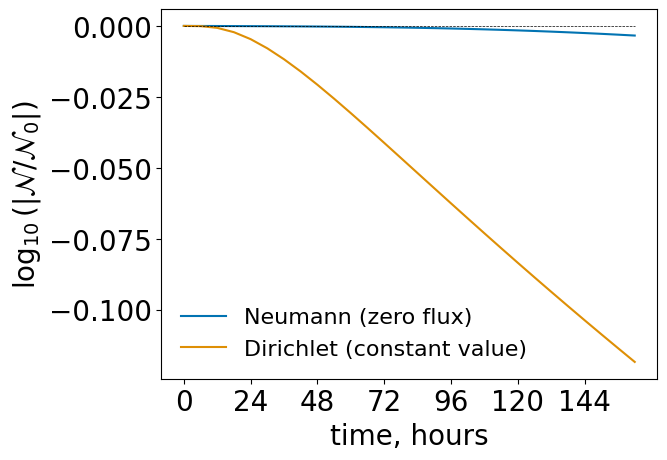

In [ ]:

# plot total mass
Mvals = find_mass_terms(psd_array_N,L_N)
Mvals2 = find_mass_terms(psd_array_D,L_D)

Mtots = [Mvals[-1],Mvals2[-1]]
labels = ['Neumann (zero flux)','Dirichlet (constant value)']
rundeets = [["Neumann",'Ntot',[]],['Dirichlet','Ntot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)
ax.plot([0,time_dim-1],[0,0],'k',linewidth=0.5,linestyle='--')
#ax.plot([0,time_dim-1],[1,1],'k',linewidth=0.5,linestyle='--')
#ax.set_ylim([0.95,1.001])

ax.legend(frameon=False)
fig.savefig('figs/Ntot_NvsD.pdf',dpi = 600,bbox_inches='tight')

#### mass change terms

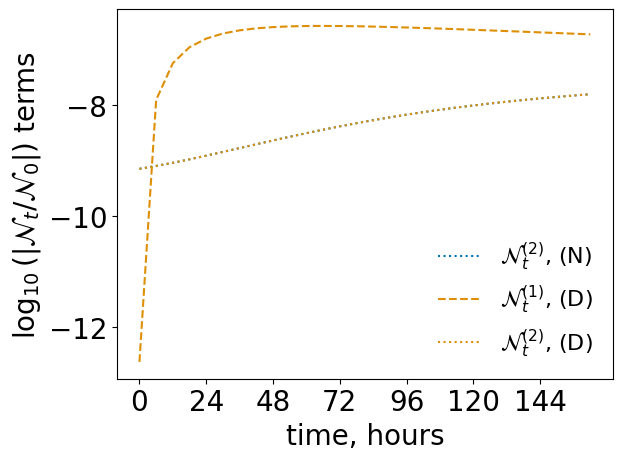

In [ ]:
# plot mass change terms
Mvals = find_mass_terms(psd_array_N,L_N)
Mvals2 = find_mass_terms(psd_array_D,L_D)

Mtots = [Mvals[1],Mvals2[0],Mvals2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '$\mathcal{N}_t^{(2)}$, (D)']
rundeets = [["Neumann",'N2',[]],['Dirichlet','N1',[]],['Dirichlet','N2',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it


fig, ax = plot_compare_mass_terms(Mtotzip,time_dim,normalisation=N0)
ax.legend(frameon=False)
fig.savefig('figs/Nterms_NvsD.pdf',dpi = 600,bbox_inches='tight')


Check that these are all negative (so these are all losses)


NameError: name 'f_return' is not defined

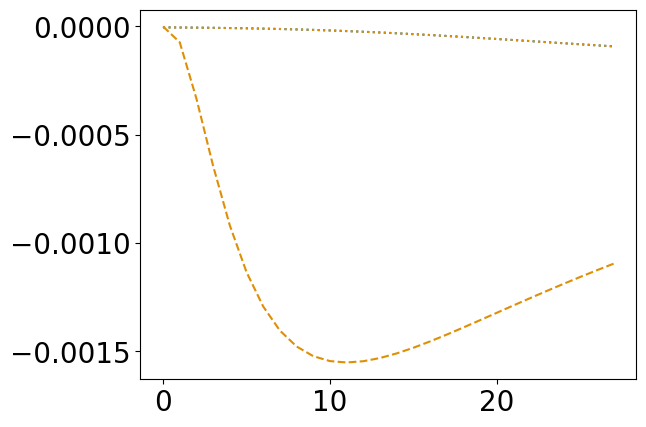

In [ ]:
# plot plain mass change terms
Mvals = find_mass_terms(psd_array_N,L_N)
Mvals2 = find_mass_terms(psd_array_D,L_D)

Mtots = [Mvals[1],Mvals2[0],Mvals2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '$\mathcal{N}_t^{(2)}$, (D)']
rundeets = [["Neumann",'N2',[]],['Dirichlet','N1',[]],['Dirichlet','N2',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
#matplotlib.rcParams.update({'legend.fontsize': 14})
fig, ax = plot_compare_plain_mass_terms(Mtotzip,time_dim)
ax.legend(frameon=False)
fig.savefig('figs/Nterms_plain_NvsD.pdf',dpi = 600,bbox_inches='tight')


#### total energy

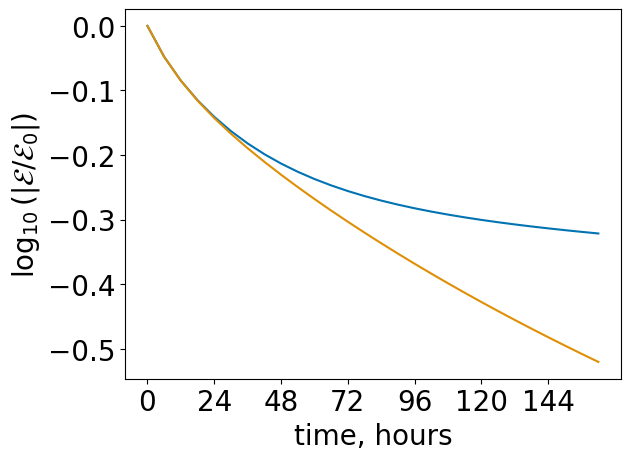

In [ ]:
# plot total energy
Mvals = find_energy_terms(psd_array_N,L_N)
Mvals2 = find_energy_terms(psd_array_D,L_D)

Mtots = [Mvals[-1],Mvals2[-1]]
labels = ['Neumann (zero flux)','Dirichlet OB (constant value)']
rundeets = [["Neumann",'Etot',[]],['Dirichlet','Etot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
#ax.legend()
fig.savefig('figs/Etot_NvsD.pdf',dpi = 600,bbox_inches='tight')

#### energy change

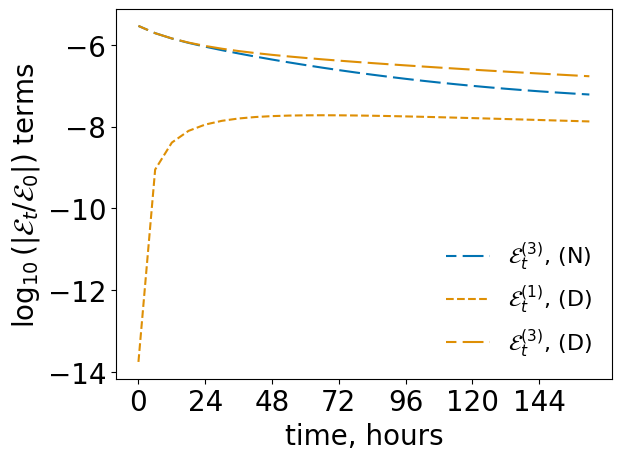

In [ ]:
# plot energy change terms
Mvals = find_energy_terms(psd_array_N,L_N)
Mvals2 = find_energy_terms(psd_array_D,L_D)

Mtots = [Mvals[2],Mvals2[0],Mvals2[2]]
labels = ['$\mathcal{E}_t^{(3)}$, (N)',
          '$\mathcal{E}_t^{(1)}$, (D)',
          '$\mathcal{E}_t^{(3)}$, (D)']
rundeets = [["Neumann",'E3',[]],['Dirichlet','E1',[]],['Dirichlet','E3',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.legend(frameon=False)
fig.savefig('figs/Eterms_NvsD.pdf',dpi = 600,bbox_inches='tight')


maybe try to show that the Neumann change in energy is trending to zero

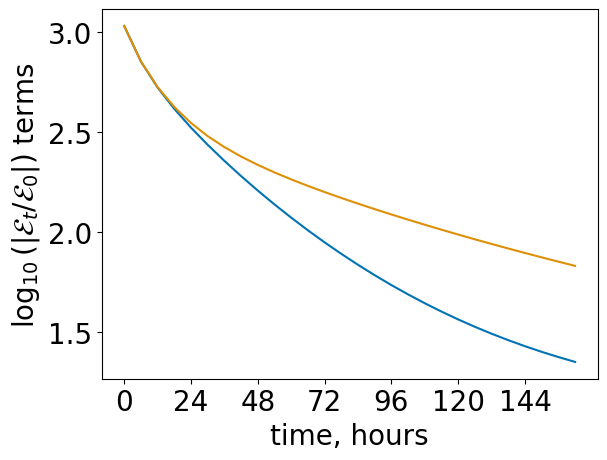

In [ ]:
# plot total energy change term
Mvals = find_energy_terms(psd_array_N,L_N)
Mvals2 = find_energy_terms(psd_array_D,L_D)

Mtots = [Mvals[2],(np.array(Mvals2[0])+np.array(Mvals2[2])).tolist()]
labels = ['$\mathcal{E}_t$, Neumann OB',
          '$\mathcal{E}_t$, Dirichlet OB (constant value)']
rundeets = [["Neumann",'Etot',[]],['Dirichlet','Etot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=1)
#ax.legend()
#fig.savefig('figs/Et_NvsD.pdf')

## $A$

In [ ]:
# # do the same settings as in example above
# psd_array_NA,L_NA,D_NA = single_run({'A':1e6},**{'rtype':'n','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})
# psd_array_DA,L_DA,D_DA = single_run({'A':1e6},**{'rtype':'d','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_NA.csv",np.array(psd_array_NA),delimiter=",")
# np.savetxt("csv-outputs/psd_array_DA.csv",np.array(psd_array_DA),delimiter=",")

In [ ]:
# read in the run above

df = pd.read_csv('psd_array_NA.csv', sep=',', header=None)
psd_array_NA = df.values
df = pd.read_csv('psd_array_DA.csv', sep=',', header=None)
psd_array_DA = df.values

#### total mass

<ipython-input-21-798d606a6b95>:23: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7dd227374a60> starts with '_'. It is thus excluded from the legend.
  ax.legend(['Neumann','_','Dirichlet','_'],frameon=False)
<ipython-input-21-798d606a6b95>:23: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7dd2273754e0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['Neumann','_','Dirichlet','_'],frameon=False)


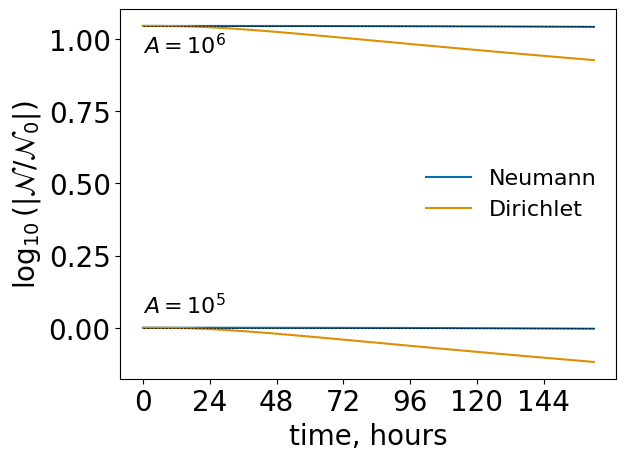

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_NA,L_N)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_DA,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['$A=10^5$','$A = 10^6$','(D) $A$ default','(D) $A = 10^6$']
rundeets = [["Neumann",'Ntot',[0,0.05]],["Neumann",'Ntot',[0,0.95]],
 ['Dirichlet','Ntot',[]],['Dirichlet','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)
#ax.set_ylim([0.9,1.3])

ax.plot([0,time_dim-1],[0,0],'k',linewidth=0.5,linestyle='--')
ax.plot([0,time_dim-1],[np.log10(MvalsN2[-1][0]/N0),np.log10(MvalsN2[-1][0]/N0)],'k',linewidth=0.5,linestyle='--')
#ax.set_yscale('log')
ax.legend(['Neumann','_','Dirichlet','_'],frameon=False)
fig.savefig('figs/Mtot_A_ND.pdf',dpi = 600,bbox_inches='tight')

#### mass change

look at teh differnt mass change terms. Do Neumann and Dirichlet separately as they overlay ach other otherwise

<ipython-input-857-e7ed576d364a>:27: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b22622bf0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-857-e7ed576d364a>:27: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b22354f70> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-857-e7ed576d364a>:27: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b22356650> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',


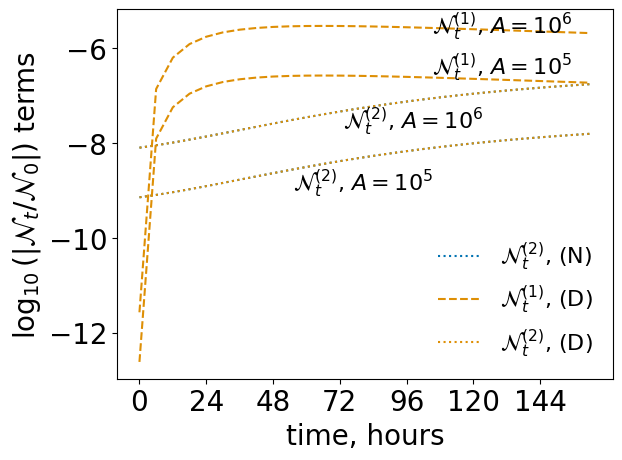

In [ ]:


# plot mass terms of both
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_NA,L_N)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_DA,L_D)


Mtots = [MvalsN[1],MvalsN2[1],MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, $A = 10^5$',
          '$\mathcal{N}_t^{(2)}$, $A = 10^6$',
          '$\mathcal{N}_t^{(1)}$, $A = 10^5$',
          '',#'$\mathcal{N}_t^{(2)}$, $A = 10^5$ (D)',
          '$\mathcal{N}_t^{(1)}$, $A=10^6$',
          '',#'$\mathcal{N}_t^{(2)}$, $A=10^6$ (D)',
          ]
rundeets = [["Neumann",'N2',[55/6,-9]],["Neumann",'N2',[73/6,-7.7]],
 ['Dirichlet','N1',[105/6,-6.55]],['Dirichlet','N2',[]],
 ['Dirichlet','N1',[105/6,-5.7]],['Dirichlet','N2',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim,normalisation=N0)

ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
          '_',#$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '$\mathcal{N}_t^{(2)}$, (D)',
          '_',#'$\mathcal{N}_t^{(1)}$, $B=2$ (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B=2$ (D)',
          ],frameon=False)
fig.savefig('figs/Mterms_A_ND.pdf',dpi = 600,bbox_inches='tight')



#### total energy

<ipython-input-24-f038859768d5>:21: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7dd225a647c0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['Neumann','_','Dirichlet','_'],frameon=False)
<ipython-input-24-f038859768d5>:21: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7dd225a65b40> starts with '_'. It is thus excluded from the legend.
  ax.legend(['Neumann','_','Dirichlet','_'],frameon=False)


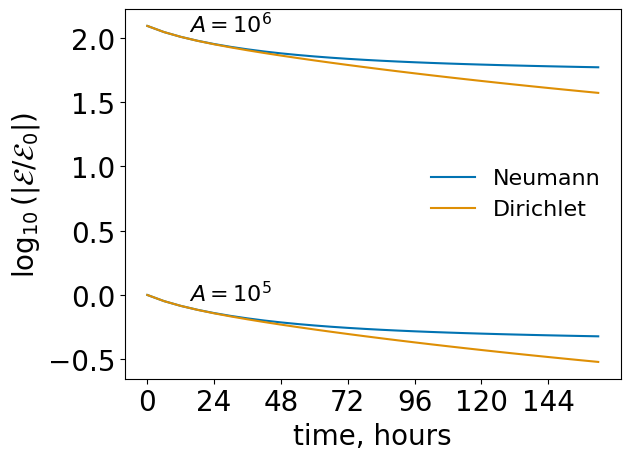

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_NA,L_N)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_DA,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
#labels = ['(N) $A$ default','(N) $A = 10^6$','(D) $A$ default','(D) $A = 10^6$']
labels = ['Neumann','_','Dirichlet','_']
rundeets = [["Neumann",'Etot',[]],["Neumann",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
#ax.set_yscale('log')

ax.legend(['Neumann','_','Dirichlet','_'],frameon=False)
ax.text(15/6,np.log10(0.9),'$A=10^5$',size=fsize_leg)
ax.text(15/6,np.log10(MvalsN2[-1][0]/E0)-0.05,'$A=10^6$',size=fsize_leg)
fig.savefig('figs/Etot_A.pdf',dpi = 600,bbox_inches='tight')

#### energy change

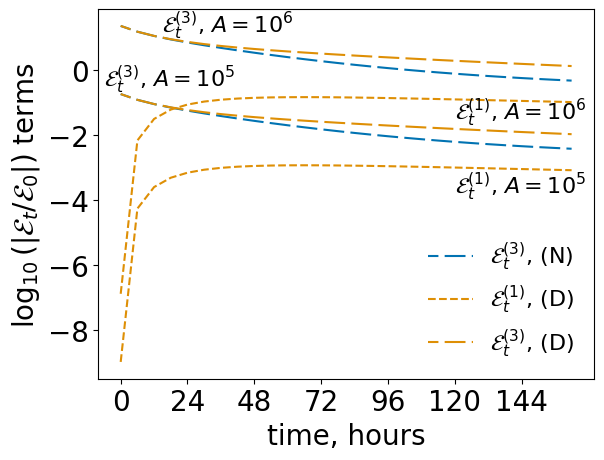

In [ ]:
# plot energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_NA,L_N)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_DA,L_D)

Mtots = [MvalsN[2],
         MvalsN2[2],
         MvalsD[0],
         MvalsD2[0],
         MvalsD[2],
         MvalsD2[2]
         ]
# labels = ['$\mathcal{E}_t^{(3)}$, $A= 10^5$ (N)',
#           '$\mathcal{E}_t^{(3)}$, $A = 10^6$ (N)',
#           '$\mathcal{E}_t^{(1)}$, $A= 10^5$ (D)',
#           '$\mathcal{E}_t^{(1)}$, $A = 10^6$ (D)',
#           '$\mathcal{E}_t^{(3)}$, $A= 10^5$ (D)',
#           '$\mathcal{E}_t^{(3)}$, $A = 10^6$ (D)'
#           ]
labels = ['$\mathcal{E}_t^{(3)}$, (N)','_',
          '$\mathcal{E}_t^{(1)}$, (D)','_',
          '$\mathcal{E}_t^{(3)}$, (D)','_'
          ]


rundeets = [["Neumann",'E3',[]],#[30/6,1.5-moveby]],
 ["Neumann",'E3',[]],#[20/6,3.5-moveby]],
 ['Dirichlet','E1',[]],#[110/6,0.2-moveby]],
  ['Dirichlet','E1',[]],#[110/6,3.05-moveby]],
 ['Dirichlet','E3',[]],#[90/6,2.15-moveby]],
  ['Dirichlet','E3',[]],#[90/6,4.45-moveby]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=N0)
ax.text(-6/6,-0.5,'$\mathcal{E}_t^{(3)}$, $A= 10^5$',size=fsize_leg)
ax.text(15/6,1.15,'$\mathcal{E}_t^{(3)}$, $A= 10^6$',size=fsize_leg)
ax.text(120/6,-3.8,'$\mathcal{E}_t^{(1)}$, $A= 10^5$',size=fsize_leg)
ax.text(120/6,-1.5,'$\mathcal{E}_t^{(1)}$, $A= 10^6$',size=fsize_leg)
ax.legend(frameon=False)
fig.savefig('figs/Eterms_A_ND.pdf',dpi = 600,bbox_inches='tight')

## $B$

In [ ]:
# # do the same settings as in example above
# psd_array_NB,L_NB,D_NB = single_run({'B':2},**{'rtype':'n','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})
# psd_array_DB,L_DB,D_DB = single_run({'B':2},**{'rtype':'d','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_NB.csv",np.array(psd_array_NB),delimiter=",")
# np.savetxt("csv-outputs/psd_array_DB.csv",np.array(psd_array_DB),delimiter=",")
# np.savetxt("csv-outputs/L_NB.csv",np.array(L_NB),delimiter=",")
# np.savetxt("csv-outputs/L_DB.csv",np.array(L_DB),delimiter=",")
# np.savetxt("csv-outputs/D_NB.csv",np.array(D_NB),delimiter=",")
# np.savetxt("csv-outputs/D_DB.csv",np.array(D_DB),delimiter=",")

In [ ]:
# read in the run above

df = pd.read_csv('psd_array_NB.csv', sep=',', header=None)
psd_array_NB = df.values
df = pd.read_csv('psd_array_DB.csv', sep=',', header=None)
psd_array_DB = df.values

df = pd.read_csv('L_NB.csv', sep=',', header=None)
L_NB = df.values.flatten()
df = pd.read_csv('L_DB.csv', sep=',', header=None)
L_DB = df.values.flatten()

#df = pd.read_csv('D_NB.csv', sep=',', header=None)
#D_NB = df.values
#df = pd.read_csv('D_DB.csv', sep=',', header=None)
#D_DB = df.values

#### total mass

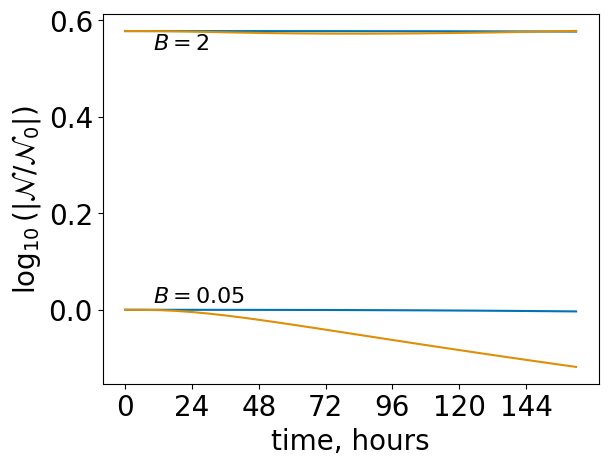

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_NB,L_NB)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_DB,L_DB)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $B$ default','(N) $B = 2$','(D) $B$ default','(D) $B = 2$']
rundeets = [["Neumann",'Ntot',[]],["Neumann",'Ntot',[]],
 ['Dirichlet','Ntot',[]],['Dirichlet','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)

ax.text(10/6,np.log10(1.1)-0.025,'$B=0.05$',size=fsize_leg)
ax.text(10/6,np.log10(MvalsN2[-1][0]/N0-0.15)-0.02,'$B=2$',size=fsize_leg)
fig.savefig('figs/Mtot_B_ND.pdf',dpi = 600,bbox_inches='tight')

this is hard to see. zoom in on the high step stuff

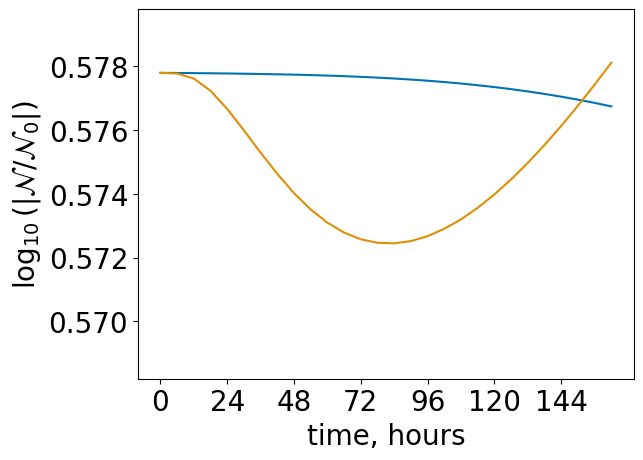

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_NB,L_NB)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_DB,L_DB)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $B$ default','(N) $B = 2$','(D) $B$ default','(D) $B = 2$']
rundeets = [["Neumann",'Ntot',[]],["Neumann",'Ntot',[]],
 ['Dirichlet','Ntot',[]],['Dirichlet','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)


ax.set_ylim([np.log10(3.7),np.log10(3.8)])
fig.savefig('figs/Mtot_B_ND_v2.pdf',dpi = 600,bbox_inches='tight')

#### mass change

<ipython-input-855-d01fd5d395e4>:28: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24e896c0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-855-d01fd5d395e4>:28: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24c1b3d0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-855-d01fd5d395e4>:28: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24c18910> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',


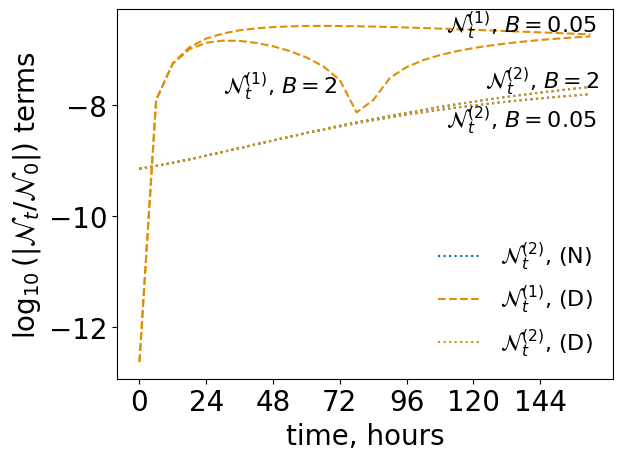

In [ ]:
# plot mass terms of both
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_NB,L_NB)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_DB,L_DB)


Mtots = [MvalsN[1],MvalsN2[1],MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, $B=0.05$',
          '$\mathcal{N}_t^{(2)}$, $B=2$',
          '$\mathcal{N}_t^{(1)}$, $B=0.05$',
          '',#'$\mathcal{N}_t^{(2)}$, $B$ default (D)',
          '$\mathcal{N}_t^{(1)}$, $B=2$',
          '',#'$\mathcal{N}_t^{(2)}$, $B=2$ (D)',
          ]

moveby = 3.8
rundeets = [["Neumann",'N2',[110/6,-8.4]],["Neumann",'N2',[124/6, -3.9-moveby]],
 ['Dirichlet','N1',[110/6,-2.9-moveby]],['Dirichlet','N2',[]],
 ['Dirichlet','N1',[30/6,-4-moveby]],['Dirichlet','N2',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim,normalisation=N0)
ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
          '_',#$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '$\mathcal{N}_t^{(2)}$, (D)',
          '_',#'$\mathcal{N}_t^{(1)}$, $B=2$ (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B=2$ (D)',
          ],frameon=False)
fig.savefig('figs/Mterms_B_ND.pdf',dpi = 600,bbox_inches='tight')

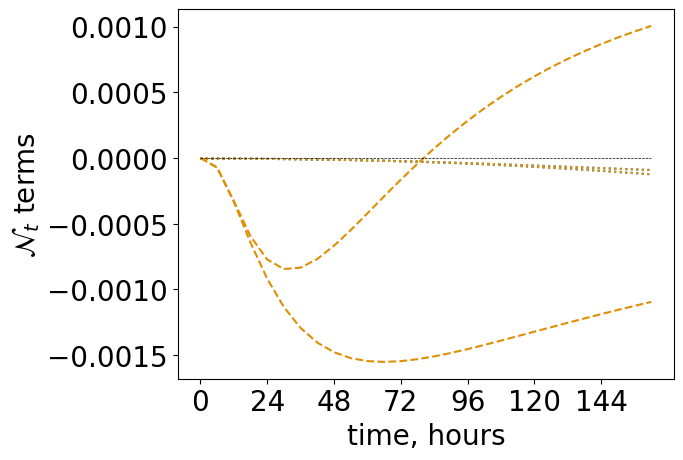

In [ ]:
# plot mass terms of both
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_NB,L_NB)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_DB,L_DB)


Mtots = [MvalsN[1],MvalsN2[1],MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, $B$ default (N),',
          '$\mathcal{N}_t^{(2)}$, $B=2$ (N)',
          '$\mathcal{N}_t^{(1)}$, $B$ default (D)',
          '$\mathcal{N}_t^{(2)}$, $B$ default (D)',
          '$\mathcal{N}_t^{(1)}$, $B=2$ (D)',
          '$\mathcal{N}_t^{(2)}$, $B=2$ (D)',
          ]
rundeets = [["Neumann",'N2',[]],["Neumann",'N2',[]],
 ['Dirichlet','N1',[]],['Dirichlet','N2',[]],
 ['Dirichlet','N1',[]],['Dirichlet','N2',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_plain_mass_terms(Mtotzip,time_dim,normalisation=1)
ax.plot([0,time_dim-1],[0,0],'k',linewidth=0.5,linestyle='--')
fig.savefig('figs/Mterms_B_ND_plain.pdf',dpi = 600,bbox_inches='tight')

#### total energy


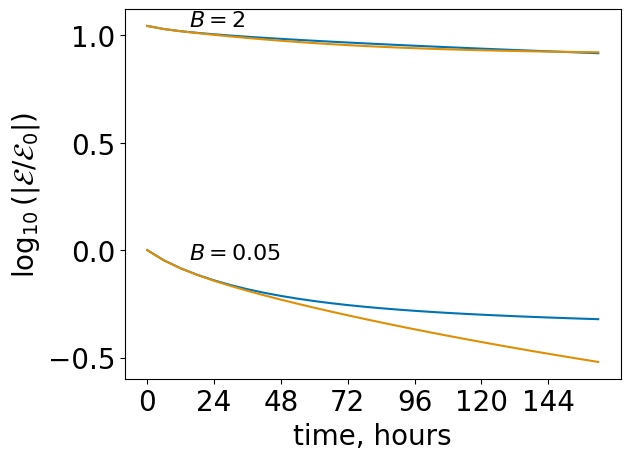

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_NB,L_NB)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_DB,L_DB)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $B$ default','(N) $B = 2$','(D) $B$ default','(D) $B = 2$']
rundeets = [["Neumann",'Etot',[]],["Neumann",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
ax.text(15/6,np.log10(1)-0.04,'$B=0.05$',size=fsize_leg)
ax.text(15/6,np.log10(MvalsN2[-1][0]/E0-0.5)+0.02,'$B=2$',size=fsize_leg)
fig.savefig('figs/Etot_B.pdf',dpi = 600,bbox_inches='tight')

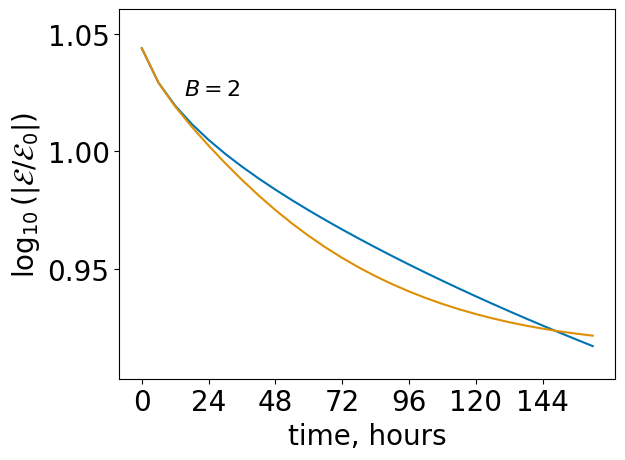

In [ ]:
# ZOOM plot total energy of
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_NB,L_NB)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_DB,L_DB)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $B$ default','(N) $B = 2$','(D) $B$ default','(D) $B = 2$']
rundeets = [["Neumann",'Etot',[]],["Neumann",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
#ax.text(15/6,1,'$B$ default',size='x-small')
ax.text(15/6,np.log10(MvalsN2[-1][0]/E0-0.5),'$B=2$',size=fsize_leg)
ax.set_ylim([np.log10(8),np.log10(11.5)])
fig.savefig('figs/Etot_B_v2.pdf',dpi = 600,bbox_inches='tight')

#### energy change

<ipython-input-859-849f7bdabc58>:38: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b27d7db40> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-859-849f7bdabc58>:38: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b27d7d090> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-859-849f7bdabc58>:38: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b27d7df00> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',


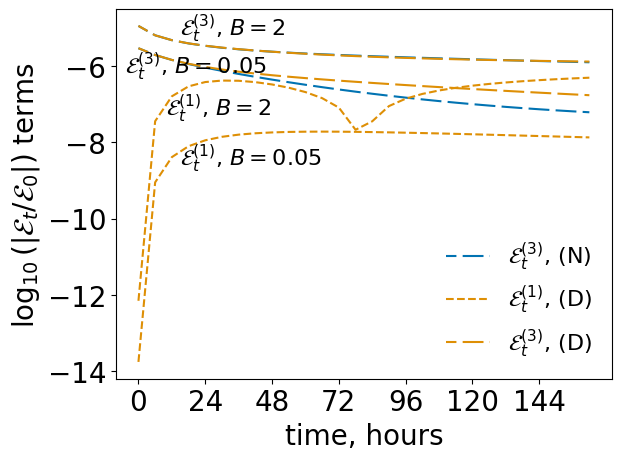

In [ ]:
# plot energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_NB,L_NB)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_DB,L_DB)

Mtots = [MvalsN[2],
         MvalsN2[2],
         MvalsD[0],
         MvalsD2[0],
         MvalsD[2],
         MvalsD2[2]
         ]
labels = ['$\mathcal{E}_t^{(3)}$, $B$ default (N)',
          '$\mathcal{E}_t^{(3)}$, $B = 2$ (N)',
          '$\mathcal{E}_t^{(1)}$, $B$ default (D)','$\mathcal{E}_t^{(1)}$, $B = 2$ (D)',
          '$\mathcal{E}_t^{(3)}$, $B$ default (D)',
          '$\mathcal{E}_t^{(3)}$, $B = 2$ (D)'
          ]
rundeets = [["Neumann",'E3',[]],
 ["Neumann",'E3',[]],
 ['Dirichlet','E1',[]],['Dirichlet','E1',[]],
 ['Dirichlet','E3',[]],
  ['Dirichlet','E3',[]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
moveby = 8.8
fig,ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.text(15/6,3.6-moveby,'$\mathcal{E}^{(3)}_t$, $B=2$',size=fsize_leg)
ax.text(-5/6,2.6-moveby,'$\mathcal{E}^{(3)}_t$, $B=0.05$',size=fsize_leg)
ax.text(15/6,0.2-moveby,'$\mathcal{E}^{(1)}_t$, $B=0.05$',size=fsize_leg)
ax.text(10/6,1.5-moveby,'$\mathcal{E}^{(1)}_t$, $B=2$',size=fsize_leg)
ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
          '$\mathcal{E}_t^{(1)}$, (D)','_',
          '$\mathcal{E}_t^{(3)}$, (D)','_'
          ],frameon=False)
fig.savefig('figs/Eterms_B_ND.pdf',dpi = 600,bbox_inches='tight')

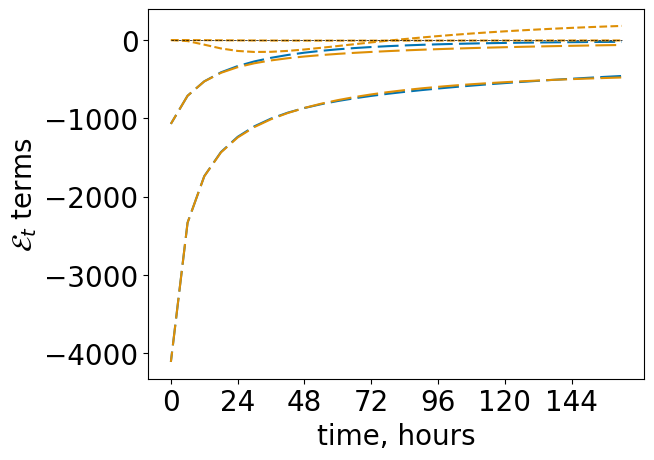

In [ ]:
# plot plain energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_NB,L_NB)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_DB,L_DB)

Mtots = [MvalsN[2],
         MvalsN2[2],
         MvalsD[0],
         MvalsD2[0],
         MvalsD[2],
         MvalsD2[2]
         ]
labels = ['$\mathcal{E}_t^{(3)}$, $B$ default (N)',
          '$\mathcal{E}_t^{(3)}$, $B = 2$ (N)',
          '$\mathcal{E}_t^{(1)}$, $B$ default (D)','$\mathcal{E}_t^{(1)}$, $B = 2$ (D)',
          '$\mathcal{E}_t^{(3)}$, $B$ default (D)',
          '$\mathcal{E}_t^{(3)}$, $B = 2$ (D)'
          ]
rundeets = [["Neumann",'E3',[]],
 ["Neumann",'E3',[]],
 ['Dirichlet','E1',[]],['Dirichlet','E1',[]],
 ['Dirichlet','E3',[]],
  ['Dirichlet','E3',[]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_plain_energy_terms(Mtotzip,time_dim,normalisation=1)
ax.plot([0,time_dim-1],[0,0],'k',linewidth=0.5,linestyle='--')
fig.savefig('figs/Eterms_B_ND_plain.pdf',dpi = 600,bbox_inches='tight')

## $\mu$


In [ ]:
# psd_array_Nmu,L_N,D_Nmu = single_run({'mu':5},**{'rtype':'n','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})
# psd_array_Dmu,L_D,D_Dmu = single_run({'mu':5},**{'rtype':'d','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_Nmu.csv",np.array(psd_array_Nmu),delimiter=",")
# np.savetxt("csv-outputs/psd_array_Dmu.csv",np.array(psd_array_Dmu),delimiter=",")
# np.savetxt("csv-outputs/D_Nmu.csv",np.array(D_Nmu),delimiter=",")
# np.savetxt("csv-outputs/D_Dmu.csv",np.array(D_Dmu),delimiter=",")

In [ ]:
# read in the run above
df = pd.read_csv('psd_array_Nmu.csv', sep=',', header=None)
psd_array_Nmu = df.values
df = pd.read_csv('psd_array_Dmu.csv', sep=',', header=None)
psd_array_Dmu = df.values


#### total mass

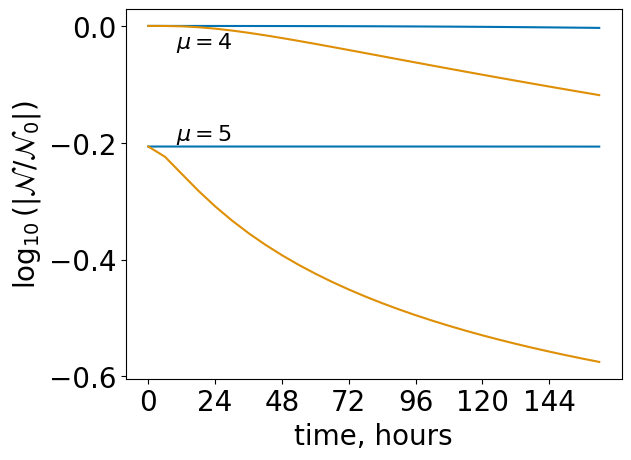

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_Nmu,L_N)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_Dmu,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $\mu$ default','(N) $\mu = 5$','(D) $\mu$ default','(D) $\mu = 5$']
rundeets = [["Neumann",'Ntot',[]],["Neumann",'Ntot',[]],
 ['Dirichlet','Ntot',[]],['Dirichlet','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)
#ax.legend()
ax.text(10/6,np.log10(0.96)-0.02,'$\mu=4$',size=fsize_leg)
ax.text(10/6,np.log10(MvalsN2[-1][0]/N0+0.015),'$\mu=5$',size=fsize_leg)
fig.savefig('figs/Mtot_mu_ND.pdf',dpi = 600,bbox_inches='tight')


#### mass change

<ipython-input-853-30ed5bb79955>:26: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24b70430> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-853-30ed5bb79955>:26: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24b71720> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-853-30ed5bb79955>:26: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b22d010c0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',


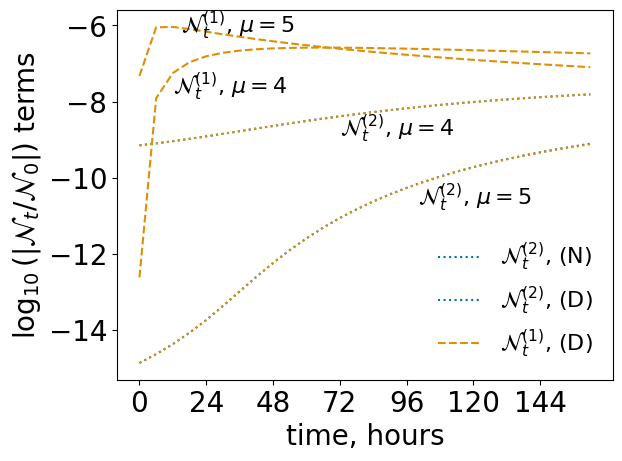

In [ ]:
# plot mass terms of both
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_Nmu,L_N)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_Dmu,L_D)


Mtots = [MvalsN[1],MvalsN2[1],MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, $\mu=4$',# (N),(D)',
          '$\mathcal{N}_t^{(2)}$, $\mu=5$',# (N),(D)',
          '$\mathcal{N}_t^{(1)}$, $\mu=4$',# (D)',
          '',#'$\mathcal{N}_t^{(2)}$, $\mu$ default (D)',
          '$\mathcal{N}_t^{(1)}$, $\mu=5$',# (D)',
          '',#'$\mathcal{N}_t^{(2)}$, $\mu=5$ (D)',
          ]
rundeets = [["Neumann",'N2',[72/6,-8.9]],["Neumann",'N2',[100/6,-10.7]],
 ['Dirichlet','N1',[12/6,-7.8]],['Dirichlet','N2',[76/6,-9.3]],
 ['Dirichlet','N1',[15/6,-6.2]],['Dirichlet','N2',[126/6,-10.7]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=N0)
ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(2)}$, (D)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B$ default (D)',
          '_',#'$\mathcal{N}_t^{(1)}$, $B=2$ (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B=2$ (D)',
          ],frameon=False)
fig.savefig('figs/Mterms_mu_ND.pdf',dpi = 600,bbox_inches='tight')

#### total energy

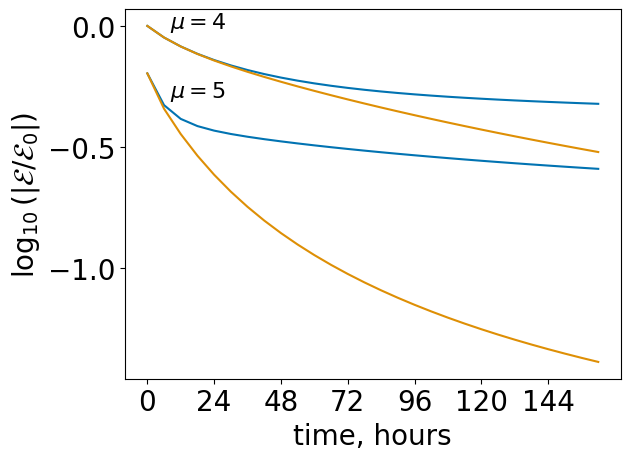

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_Nmu,L_N)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_Dmu,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $\mu=4$','(N) $\mu = 5$','(D) $\mu$ default','(D) $\mu = 5$']
rundeets = [["Neumann",'Etot',[]],["Neumann",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
ax.text(8/6,-0.01,'$\mu=4$',size=fsize_leg)
ax.text(8/6,np.log10(MvalsN2[-1][0]/E0-0.13),'$\mu=5$',size=fsize_leg)
fig.savefig('figs/Etot_mu_ND.pdf',dpi = 600,bbox_inches='tight')

<ipython-input-860-450ebd084336>:33: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24ebeef0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-860-450ebd084336>:33: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24b25b10> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-860-450ebd084336>:33: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24b26f50> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',


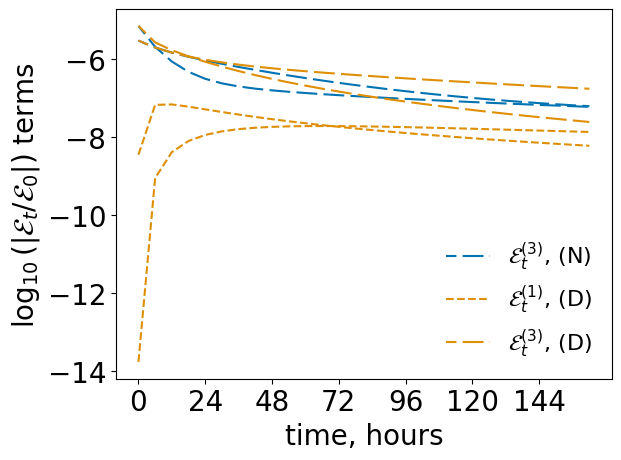

In [ ]:
# plot energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_Nmu,L_N)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_Dmu,L_D)

Mtots = [MvalsN[2],
         MvalsN2[2],
         MvalsD[0],
         MvalsD2[0],
         MvalsD[2],
         MvalsD2[2]
         ]
labels = ['$\mathcal{E}_t^{(3)}$, $\mu$ default (N)',
          '$\mathcal{E}_t^{(3)}$, $\mu = 5$ (N)',
          '$\mathcal{E}_t^{(1)}$, $\mu$ default (D)','$\mathcal{E}_t^{(1)}$, $\mu = 5$ (D)',
          '$\mathcal{E}_t^{(3)}$, $\mu$ default (D)',
          '$\mathcal{E}_t^{(3)}$, $\mu = 5$ (D)'
          ]
rundeets = [["Neumann",'E3',[]],
 ["Neumann",'E3',[]],
 ['Dirichlet','E1',[]],['Dirichlet','E1',[]],
 ['Dirichlet','E3',[]],
  ['Dirichlet','E3',[]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
          '$\mathcal{E}_t^{(1)}$, (D)','_',
          '$\mathcal{E}_t^{(3)}$, (D)','_'
          ],frameon=False)
fig.savefig('figs/Eterms_mu_ND.pdf',dpi = 600,bbox_inches='tight')


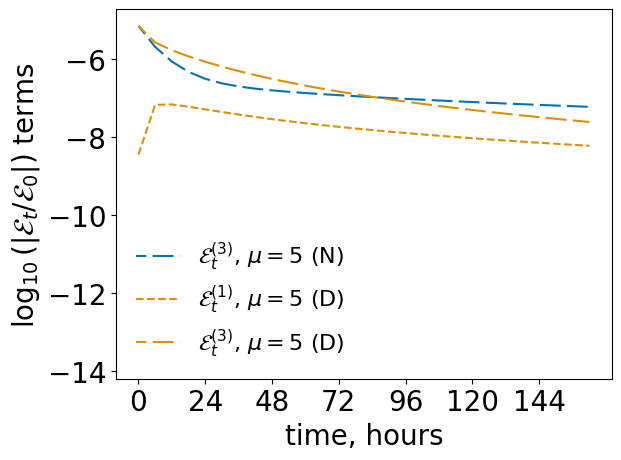

In [ ]:
# plot energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_Nmu,L_N)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_Dmu,L_D)

Mtots = [#MvalsN[2],
         MvalsN2[2],
         #MvalsD[0],
         MvalsD2[0],
         #MvalsD[2],
         MvalsD2[2]
         ]
labels = [#'$\mathcal{E}_t^{(3)}$, $\mu$ default (N)',
          '$\mathcal{E}_t^{(3)}$, $\mu = 5$ (N)',
          #'$\mathcal{E}_t^{(1)}$, $\mu$ default (D)',
          '$\mathcal{E}_t^{(1)}$, $\mu = 5$ (D)',
          #'$\mathcal{E}_t^{(3)}$, $\mu$ default (D)',
          '$\mathcal{E}_t^{(3)}$, $\mu = 5$ (D)'
          ]
rundeets = [#["Neumann",'E3',[]],
 ["Neumann",'E3',[]],
 #['Dirichlet','E1',[]],
  ['Dirichlet','E1',[]],
 #['Dirichlet','E3',[]],
  ['Dirichlet','E3',[]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.set_ylim([-14.188534866265584, -4.731155385427497])
ax.legend(frameon=False)
fig.savefig('figs/Eterms_mu_ND_muonly.pdf',dpi = 600,bbox_inches='tight')

## $\sigma$

In [ ]:
# # do the same settings as in example above
# psd_array_Nsig,L_Nsig,D_Nsig = single_run({'sig':0.5},**{'rtype':'n','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})
# psd_array_Dsig,L_Dsig,D_Dsig = single_run({'sig':0.5},**{'rtype':'d','kp':4,'L_outer':6.5,'diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_Nsig.csv",np.array(psd_array_Nsig),delimiter=",")
# np.savetxt("csv-outputs/psd_array_Dsig.csv",np.array(psd_array_Dsig),delimiter=",")
# np.savetxt("csv-outputs/L_Nsig.csv",np.array(L_Nsig),delimiter=",")
# np.savetxt("csv-outputs/L_Dsig.csv",np.array(L_Dsig),delimiter=",")
# np.savetxt("csv-outputs/D_Nsig.csv",np.array(D_Nsig),delimiter=",")
# np.savetxt("csv-outputs/D_Dsig.csv",np.array(D_Dsig),delimiter=",")

In [ ]:
# read in the run above
df = pd.read_csv('psd_array_Nsig.csv', sep=',', header=None)
psd_array_Nsig = df.values
df = pd.read_csv('psd_array_Dsig.csv', sep=',', header=None)
psd_array_Dsig = df.values


#### total mass

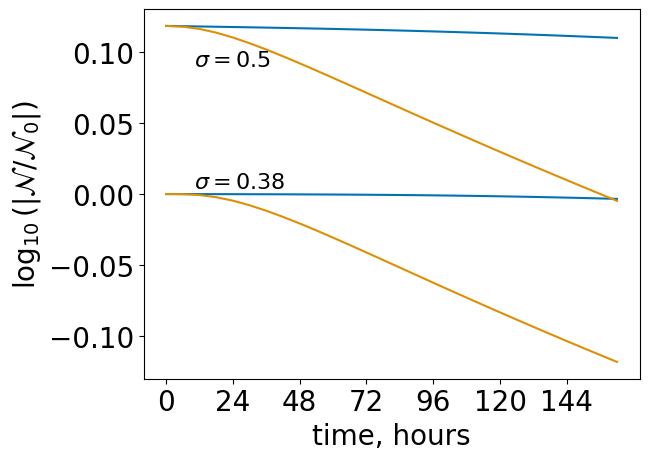

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_Nsig,L_N)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_Dsig,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $\sigma$ default','(N) $\sigma = 0.5$','(D) $\sigma$ default','(D) $\sigma = 0.5$']
rundeets = [["Neumann",'Ntot',[]],["Neumann",'Ntot',[]],
 ['Dirichlet','Ntot',[]],['Dirichlet','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)
#ax.legend()
ax.text(10/6,np.log10(1.01),'$\sigma=0.38$',size=fsize_leg)
ax.text(10/6,0.09,'$\sigma=0.5$',size=fsize_leg)
fig.savefig('figs/Mtot_sig_ND.pdf',dpi = 600,bbox_inches='tight')


#### mass change

<ipython-input-864-c644063a9e6b>:28: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24967e80> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-864-c644063a9e6b>:28: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b249653c0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-864-c644063a9e6b>:28: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b249671f0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',


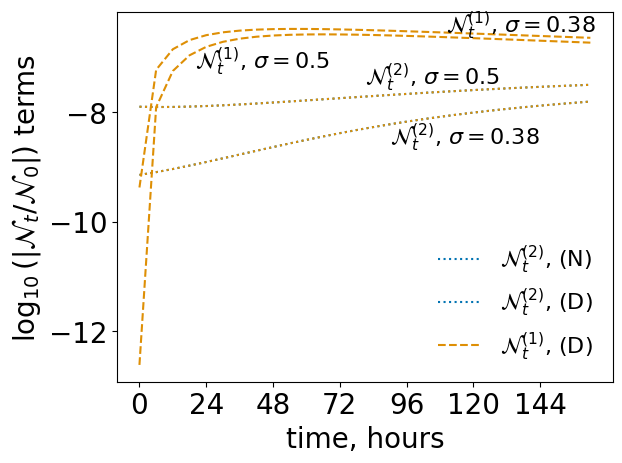

In [ ]:
# plot mass terms of both
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_Nsig,L_N)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_Dsig,L_D)


Mtots = [MvalsN[1],MvalsN2[1],MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, $\sigma=0.38$',
          '$\mathcal{N}_t^{(2)}$, $\sigma=0.5$',
          '$\mathcal{N}_t^{(1)}$, $\sigma=0.38$',
          '',#'$\mathcal{N}_t^{(2)}$, $\sigma$ default (D)',
          '$\mathcal{N}_t^{(1)}$, $\sigma=0.5$',
          '',#'$\mathcal{N}_t^{(2)}$, $\sigma=0.5$ (D)',
          ]
rundeets = [["Neumann",'N2',[90/6,-8.6]],["Neumann",'N2',[81/6,-7.5]],
 ['Dirichlet','N1',[110/6,-6.55]],['Dirichlet','N2',[130/6,-8.6]],
 ['Dirichlet','N1',[20/6,-7.2]],['Dirichlet','N2',[115/6,-7.5]]]



Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim,normalisation=N0)
ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(2)}$, (D)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B$ default (D)',
          '_',#'$\mathcal{N}_t^{(1)}$, $B=2$ (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B=2$ (D)',
          ],frameon=False)
fig.savefig('figs/Mterms_sig_ND.pdf',dpi = 600,bbox_inches='tight')

#### total energy

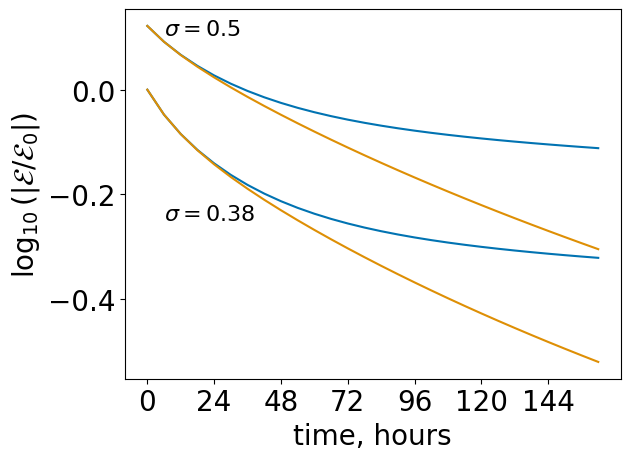

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_Nsig,L_N)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_Dsig,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $\sigma$ default','(N) $\sigma = 0.5$','(D) $\sigma$ default','(D) $\sigma = 0.5$']
rundeets = [["Neumann",'Etot',[]],["Neumann",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
ax.text(6/6,-0.25,'$\sigma=0.38$',size=fsize_leg)
ax.text(6/6,np.log10(MvalsN2[-1][0]/E0-0.05),'$\sigma=0.5$',size=fsize_leg)
fig.savefig('figs/Etot_sig_ND.pdf',dpi = 600,bbox_inches='tight')

#### energy change

<ipython-input-861-41fb020912cf>:35: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b22ad0eb0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-861-41fb020912cf>:35: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24c19d50> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-861-41fb020912cf>:35: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24c1a290> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',


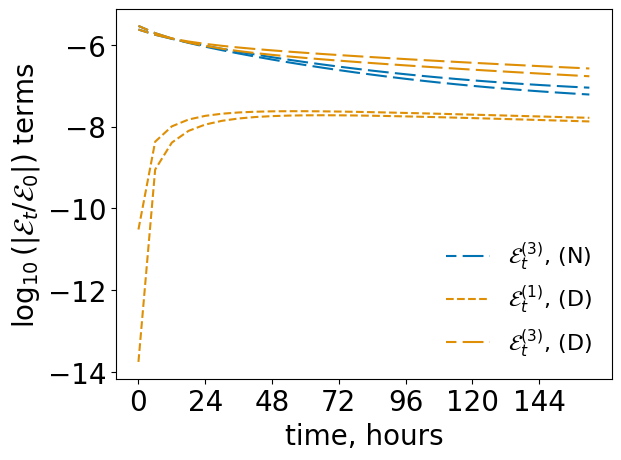

In [ ]:
# plot energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_Nsig,L_N)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_Dsig,L_D)

Mtots = [MvalsN[2],
         MvalsN2[2],
         MvalsD[0],
         MvalsD2[0],
         MvalsD[2],
         MvalsD2[2]
         ]
labels = ['$\mathcal{E}_t^{(3)}$, $\sigma$ default (N)',
          '$\mathcal{E}_t^{(3)}$, $\sigma = 0.5$ (N)',
          '$\mathcal{E}_t^{(1)}$, $\sigma$ default (D)',
          '$\mathcal{E}_t^{(1)}$, $\sigma = 0.5$ (D)',
          '$\mathcal{E}_t^{(3)}$, $\sigma$ default (D)',
          '$\mathcal{E}_t^{(3)}$, $\sigma = 0.5$ (D)'
          ]
rundeets = [["Neumann",'E3',[]],
 ["Neumann",'E3',[]],
 ['Dirichlet','E1',[]],
  ['Dirichlet','E1',[]],
 ['Dirichlet','E3',[]],
  ['Dirichlet','E3',[]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
          '$\mathcal{E}_t^{(1)}$, (D)','_',
          '$\mathcal{E}_t^{(3)}$, (D)','_'
          ],frameon=False)
fig.savefig('figs/Eterms_sig_ND.pdf',dpi = 600,bbox_inches='tight')

## $L_{outer}$



In [ ]:
# # do the same settings as in example above
# psd_array_N_L_outer,L_N_L_outer,D_N_L_outer = single_run({},**{'rtype':'n','kp':4,'L_outer':7.5,'diffcoeffs':'L^6'})
# psd_array_D_L_outer,L_D_L_outer,D_D_L_outer = single_run({},**{'rtype':'d','kp':4,'L_outer':7.5,'diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_N_L_outer.csv",np.array(psd_array_N_L_outer),delimiter=",")
# np.savetxt("csv-outputs/psd_array_D_L_outer.csv",np.array(psd_array_D_L_outer),delimiter=",")
# np.savetxt("csv-outputs/L_N_L_outer.csv",np.array(L_N_L_outer),delimiter=",")
# np.savetxt("csv-outputs/L_D_L_outer.csv",np.array(L_D_L_outer),delimiter=",")
# np.savetxt("csv-outputs/D_N_L_outer.csv",np.array(D_N_L_outer),delimiter=",")
# np.savetxt("csv-outputs/D_D_L_outer.csv",np.array(D_D_L_outer),delimiter=",")


In [ ]:
# read in the run above
df = pd.read_csv('psd_array_N_L_outer.csv', sep=',', header=None)
psd_array_N_L_outer = df.values
df = pd.read_csv('psd_array_D_L_outer.csv', sep=',', header=None)
psd_array_D_L_outer = df.values

df = pd.read_csv('L_N_L_outer.csv', sep=',', header=None)
L_N_L_outer = df.values.flatten()
df = pd.read_csv('L_D_L_outer.csv', sep=',', header=None)
L_D_L_outer = df.values.flatten()

#### total mass


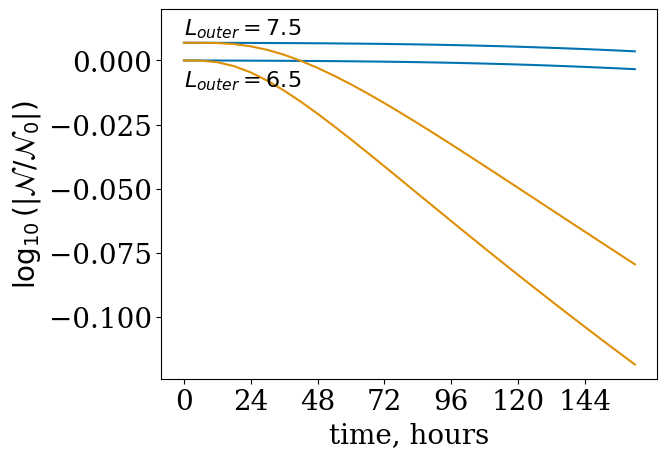

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_D_L_outer,L_D_L_outer)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['$L_{outer}=6.5$','$L_{outer} = 7.5$','(D) $L_{outer}$ default','(D) $L_{outer} = 7.5$']
rundeets = [["Neumann",'Ntot',[0,-0.01]],["Neumann",'Ntot',[0,0.01]],
 ['Dirichlet','Ntot',[]],['Dirichlet','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)
ax.set_ylim([-0.124,0.02])
fig.savefig('figs/Mtot_Louter_ND.pdf',dpi = 600,bbox_inches='tight')

let's work out some numbers, to quantify the effect of different Dirichlet OB locations.



In [ ]:
# mass at start with L = 7.5
print(MvalsN2[-1][0])

# mass at start with L = 6.5
print(MvalsN[-1][0])
# print(N0) # check they are the same!

# and mass at the end?
print(MvalsN2[-1][-1])
print(MvalsN[-1][-1])

# total amount lost
massLoss2 = MvalsN2[-1][-1] - MvalsN2[-1][0]
massLoss = MvalsN[-1][-1] - MvalsN[-1][0]


print(massLoss2)
print(massLoss)

# proportional amount lost
pmassLoss2 = massLoss2/MvalsN2[-1][0]
pmassLoss = massLoss/MvalsN[-1][0]

print(pmassLoss2)
print(pmassLoss)

6027.337013160875
5932.310019701115
5981.155841943641
5886.127819318539
-46.181171217234805
-46.18220038257641
-0.007661952719152223
-0.007784859562161451


#### mass change

<ipython-input-867-dd7098dc8892>:26: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24d03400> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-867-dd7098dc8892>:26: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24d003d0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
<ipython-input-867-dd7098dc8892>:26: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24d01ba0> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',


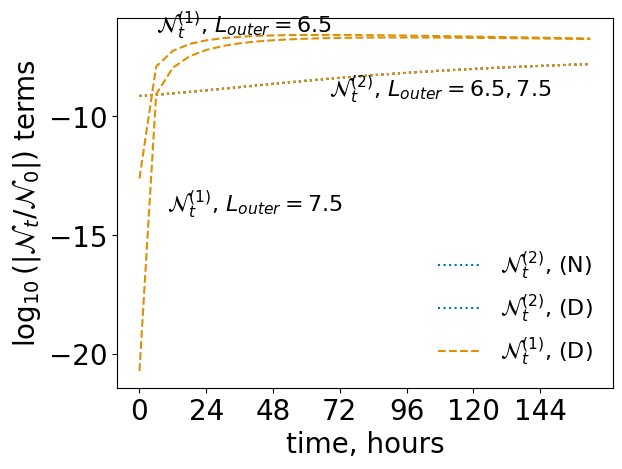

In [ ]:
# plot mass terms of both
MvalsN = find_mass_terms(psd_array_N,L_N)
MvalsN2 = find_mass_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsD = find_mass_terms(psd_array_D,L_D)
MvalsD2 = find_mass_terms(psd_array_D_L_outer,L_D_L_outer)


Mtots = [MvalsN[1],MvalsN2[1],MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1]]
labels = ['$\mathcal{N}_t^{(2)}$, $L_{outer}=6.5,7.5$ ',
          '$\mathcal{N}_t^{(2)}$, $L_{outer}=7.5$ ,',
          '$\mathcal{N}_t^{(1)}$, $L_{outer}=6.5$ ',
          '$\mathcal{N}_t^{(2)}$, $L_{outer}$ default (D),',
          '$\mathcal{N}_t^{(1)}$, $L_{outer}=7.5$ ',
          '$\mathcal{N}_t^{(2)}$, $L_{outer}=7.5$ ',
          ]
rundeets = [["Neumann",'N2',[68/6,-9.2]],["Neumann",'N2',[]],
 ['Dirichlet','N1',[6/6,-6.5]],['Dirichlet','N2',[]],
 ['Dirichlet','N1',[10/6,-14]],['Dirichlet','N2',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim,normalisation=N0)
ax.legend(['$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(2)}$, (D)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B$ default (D)',
          '_',#'$\mathcal{N}_t^{(1)}$, $B=2$ (D)',
          '_',#'$\mathcal{N}_t^{(2)}$, $B=2$ (D)',
          ],frameon=False)
fig.savefig('figs/Mterms_Louter_ND.pdf',dpi = 600,bbox_inches='tight')

#### total energy

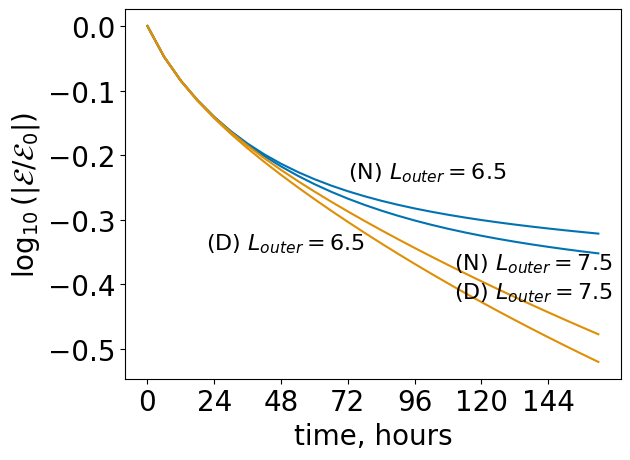

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_D_L_outer,L_D_L_outer)


Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $L_{outer}=6.5$','(N) $L_{outer} = 7.5$','(D) $L_{outer}=6.5$','(D) $L_{outer} = 7.5$']
rundeets = [["Neumann",'Etot',[72/6,np.log10(0.58)]],["Neumann",'Etot',[110/6,np.log10(0.42)]],
 ['Dirichlet','Etot',[21/6,np.log10(0.45)]],['Dirichlet','Etot',[110/6,np.log10(0.37)+0.01]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
#ax.set_yscale('log')
#ax.legend()
fig.savefig('figs/Etot_Louter.pdf',dpi = 600,bbox_inches='tight')

#### energy change

<ipython-input-862-f0301186ffef>:34: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b22969930> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-862-f0301186ffef>:34: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b2296b490> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
<ipython-input-862-f0301186ffef>:34: UserWarning: The label '_' of <matplotlib.lines.Line2D object at 0x7f9b24e8a260> starts with '_'. It is thus excluded from the legend.
  ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',


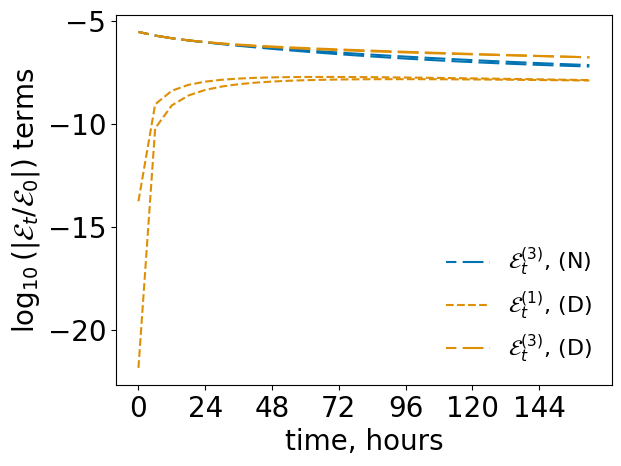

In [ ]:
# plot energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_D_L_outer,L_D_L_outer)

Mtots = [MvalsN[2],
         MvalsN2[2],
         MvalsD[0],
         MvalsD2[0],
         MvalsD[2],
         MvalsD2[2]
         ]
labels = ['$\mathcal{E}_t^{(3)}$, $L_{outer}$ default (N)',
          '$\mathcal{E}_t^{(3)}$, $L_{outer} = 7.5$ (N)',
          '$\mathcal{E}_t^{(1)}$, $L_{outer}$ default (D)','$\mathcal{E}_t^{(1)}$, $L_{outer} = 7.5$ (D)',
          '$\mathcal{E}_t^{(3)}$, $L_{outer}$ default (D)',
          '$\mathcal{E}_t^{(3)}$, $L_{outer} = 7.5$ (D)'
          ]
rundeets = [["Neumann",'E3',[]],
 ["Neumann",'E3',[]],
 ['Dirichlet','E1',[]],
  ['Dirichlet','E1',[]],
 ['Dirichlet','E3',[]],
  ['Dirichlet','E3',[]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.legend(['$\mathcal{E}_t^{(3)}$, (N)','_',
          '$\mathcal{E}_t^{(1)}$, (D)','_',
          '$\mathcal{E}_t^{(3)}$, (D)','_'
          ],frameon=False)
fig.savefig('figs/Eterms_Louter_ND.pdf',dpi = 600,bbox_inches='tight')

what is going on.

why is energy for N L=6.5  higher than L = 7.5

(1) plateua is higher?
(2) reconfiguration loss is less strong

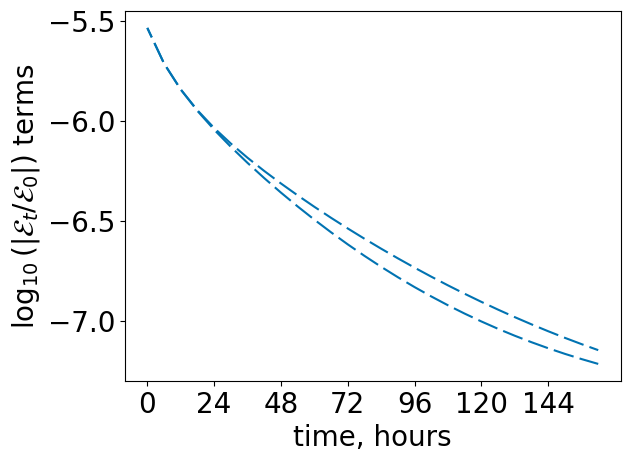

In [ ]:
# plot just the neumann energy changes

# plot energy terms
MvalsN = find_energy_terms(psd_array_N,L_N)
MvalsN2 = find_energy_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsD = find_energy_terms(psd_array_D,L_D)
MvalsD2 = find_energy_terms(psd_array_D_L_outer,L_D_L_outer)

Mtots = [MvalsN[2],
         MvalsN2[2]
         ]
labels = ['$\mathcal{E}_t^{(3)}$, $L_{outer}$ default (N)',
          '$\mathcal{E}_t^{(3)}$, $L_{outer} = 7.5$ (N)'
          ]
rundeets = [["Neumann",'E3',[]],
 ["Neumann",'E3',[]]
            ]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
fig.savefig('figs/Eterms_Louter_N.pdf',dpi = 600,bbox_inches='tight')

(reconfiguration term is larger for L=7.5)

## Compare defaults for Neumann and Dirtichlet outer bounaries (with loss)


In [ ]:
# psd_array_N_LR,L_N,D_N_LR = single_run({},**{'rtype':'n','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})
# psd_array_D_LR,L_D,D_D_LR = single_run({},**{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_N_LR.csv",np.array(psd_array_N_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_D_LR.csv",np.array(psd_array_D_LR),delimiter=",")

# np.savetxt("csv-outputs/D_N_LR.csv",np.array(D_N_LR),delimiter=",")
# np.savetxt("csv-outputs/D_D_LR.csv",np.array(D_D_LR),delimiter=",")

In [ ]:
# read them in

df = pd.read_csv('psd_array_N_LR.csv', sep=',', header=None)
psd_array_N_LR = df.values
df = pd.read_csv('psd_array_D_LR.csv', sep=',', header=None)
psd_array_D_LR = df.values

#df = pd.read_csv('D_N_LR.csv', sep=',', header=None)
#D_N_LR = df.values
#df = pd.read_csv('D_D_LR.csv', sep=',', header=None)
#D_D_LR = df.values

#### total mass

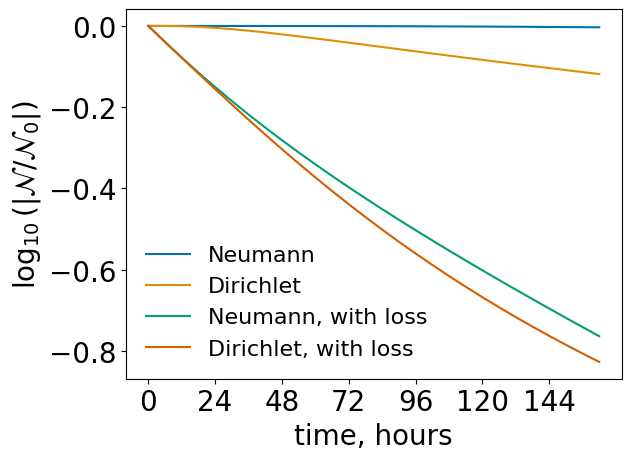

In [ ]:
# plot total mass

Mvals = find_mass_terms(psd_array_N,L_N)
Mvals2 = find_mass_terms(psd_array_D,L_D)

MLvals = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MLvals2 = find_mass_terms_inc_loss(psd_array_D_LR,L_D)

Mtots = [Mvals[-1],Mvals2[-1],MLvals[-1],MLvals2[-1]]
labels = ['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss']
rundeets = [["Neumann",'Ntot',[]],['Dirichlet','Ntot',[]],["Neumann loss",'Ntot',[]],['Dirichlet loss','Ntot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation=N0)
ax.legend(frameon=False)
fig.savefig('figs/Ntot_NvsD_loss.pdf',dpi = 600,bbox_inches='tight')

#### mass change

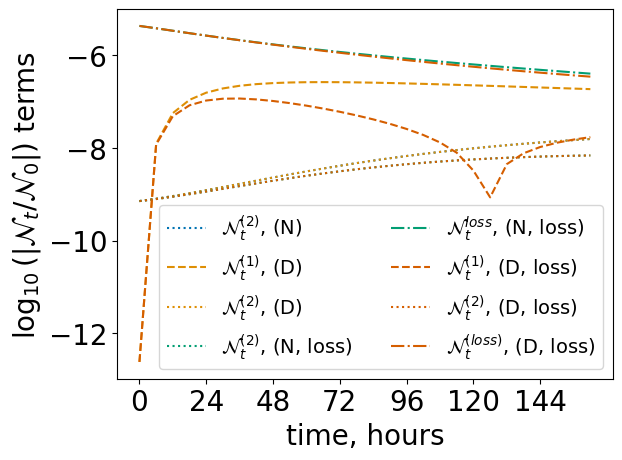

In [ ]:
# plot mass change terms
Mvals = find_mass_terms(psd_array_N,L_N)
Mvals2 = find_mass_terms(psd_array_D,L_D)
MLvals = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MLvals2 = find_mass_terms_inc_loss(psd_array_D_LR,L_D)

Mtots = [Mvals[1],Mvals2[0],Mvals2[1],MLvals[1],MLvals[2],MLvals2[0],MLvals2[1],MLvals2[2]]
labels = ['$\mathcal{N}_t^{(2)}$, (N)',
          '$\mathcal{N}_t^{(1)}$, (D)',
          '$\mathcal{N}_t^{(2)}$, (D)',
    '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{loss}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$, (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)']
rundeets = [["Neumann",'N2',[]],['Dirichlet','N1',[]],['Dirichlet','N2',[]],
    ["Neumann loss",'N2',[]],["Neumann loss",'Nloss',[]],
 ['Dirichlet loss','N1',[]],['Dirichlet loss','N2',[]],["Dirichlet loss",'Nloss',[]]]



Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=N0)
ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Nterms_NvsD_loss.pdf',dpi = 600,bbox_inches='tight')

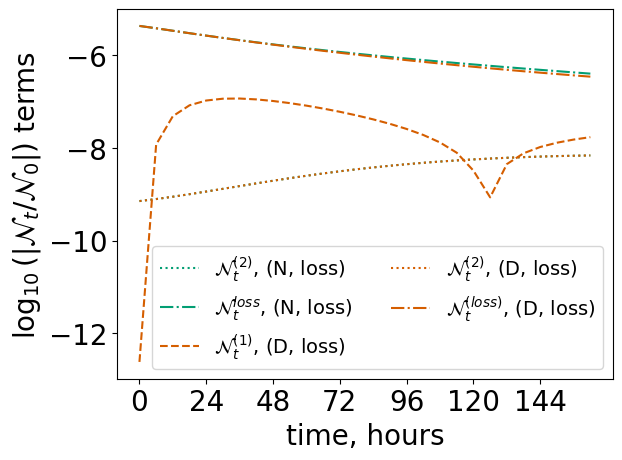

In [ ]:
# plot mass change terms, loss veriosn only
Mvals = find_mass_terms(psd_array_N,L_N)
Mvals2 = find_mass_terms(psd_array_D,L_D)
MLvals = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MLvals2 = find_mass_terms_inc_loss(psd_array_D_LR,L_D)

Mtots = [#Mvals[1],Mvals2[0],Mvals2[1],
         MLvals[1],MLvals[2],MLvals2[0],MLvals2[1],MLvals2[2]]
labels = [#'$\mathcal{N}_t^{(2)}$, (N))',
          #'$\mathcal{N}_t^{(1)}$, (D)',
          #'$\mathcal{N}_t^{(2)}$, (D)',
    '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{loss}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$, (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)']
rundeets = [#["Neumann",'N2',[]],['Dirichlet','N1',[]],['Dirichlet','N2',[]],
    ["Neumann loss",'N2',[]],["Neumann loss",'Nloss',[]],
 ['Dirichlet loss','N1',[]],['Dirichlet loss','N2',[]],["Dirichlet loss",'Nloss',[]]]



Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=N0)
ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Nterms_NvsD_loss_lossONLY.pdf',dpi = 600,bbox_inches='tight')

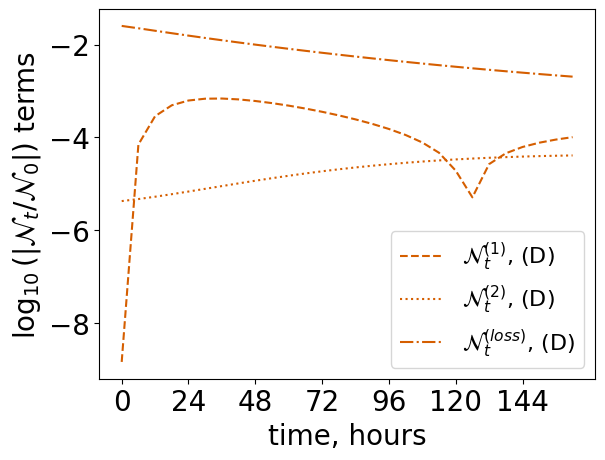

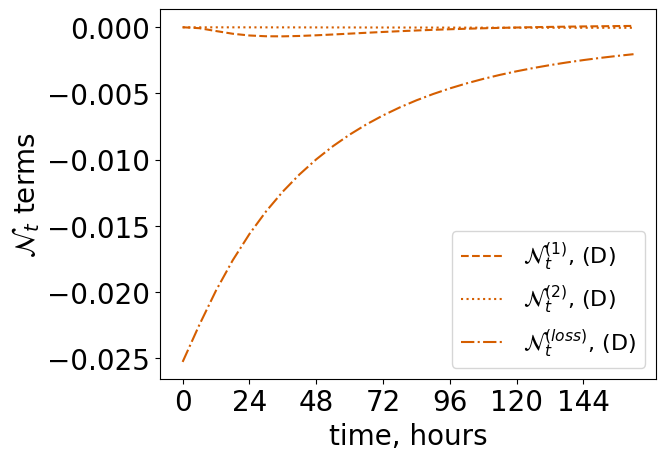

In [ ]:
# plot mass change terms, Dirichlet only
Mvals = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
Mvals2 = find_mass_terms_inc_loss(psd_array_D_LR,L_D)

Mtots = [Mvals2[0],Mvals2[1],Mvals2[2]]
labels = ['$\mathcal{N}_t^{(1)}$, (D)',
          '$\mathcal{N}_t^{(2)}$, (D)',
          '$\mathcal{N}_t^{(loss)}$, (D)']
rundeets = [['Dirichlet loss','N1',[]],['Dirichlet loss','N2',[]],["Dirichlet loss",'Nloss',[]],]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim)
ax.legend()
fig.savefig('figs/Nterms_Dirichlet_loss.pdf',dpi = 600,bbox_inches='tight')



Mtotzip = zip(Mtots,labels,rundeets)
fig, ax = plot_compare_plain_mass_terms(Mtotzip,time_dim)
ax.legend()
fig.savefig('figs/Nterms_Dirichlet_loss_plain.pdf',dpi = 600,bbox_inches='tight')

#### energy

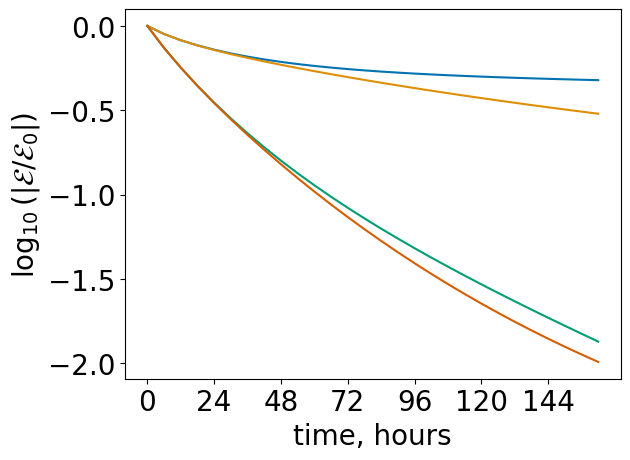

In [ ]:
# plot total energy
Mvals = find_energy_terms(psd_array_N,L_N)
Mvals2 = find_energy_terms(psd_array_D,L_D)

MLvals = find_energy_terms_inc_loss(psd_array_N_LR,L_N)
MLvals2 = find_energy_terms_inc_loss(psd_array_D_LR,L_D)

Mtots = [Mvals[-1],Mvals2[-1],MLvals[-1],MLvals2[-1]]
labels = ['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss']
rundeets = [["Neumann",'Etot',[]],['Dirichlet','Etot',[]],["Neumann loss",'Etot',[]],['Dirichlet loss','Etot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
#ax.legend(frameon=False)
fig.savefig('figs/Etot_NvsD_loss.pdf',dpi = 600,bbox_inches='tight')

wait, so they nearly reach zero?? check the distributions

#### energy change

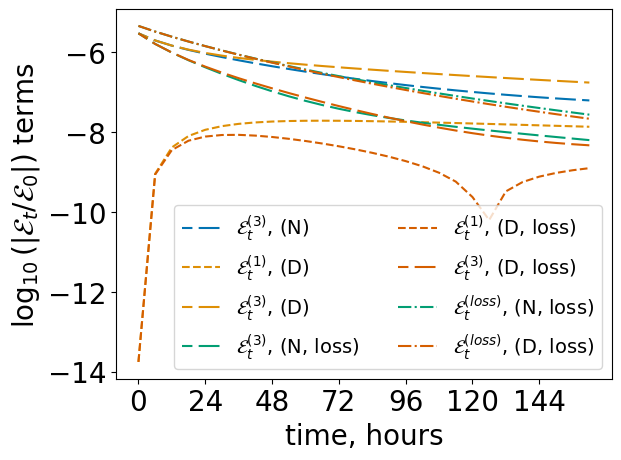

In [ ]:
# plot energy change terms

Mvals = find_energy_terms(psd_array_N,L_N)
Mvals2 = find_energy_terms(psd_array_D,L_D)
MLvals = find_energy_terms_inc_loss(psd_array_N_LR,L_N)
MLvals2 = find_energy_terms_inc_loss(psd_array_D_LR,L_D)

Mtots = [Mvals[2],Mvals2[0],Mvals2[2],MLvals[2],MLvals2[0],MLvals2[2],MLvals[3],MLvals2[3]]
labels = ['$\mathcal{E}_t^{(3)}$, (N)',
          '$\mathcal{E}_t^{(1)}$, (D)',
          '$\mathcal{E}_t^{(3)}$, (D)',
    '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$, (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)'
          ]
rundeets = [["Neumann",'E3',[]],['Dirichlet','E1',[]],['Dirichlet','E3',[]],
    ["Neumann loss",'E3',[]],['Dirichlet loss','E1',[]],['Dirichlet loss','E3',[]],
            ["Neumann loss",'Eloss',[]],['Dirichlet loss','Eloss',[]]]



Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Eterms_NvsD_loss.pdf',dpi = 600,bbox_inches='tight')


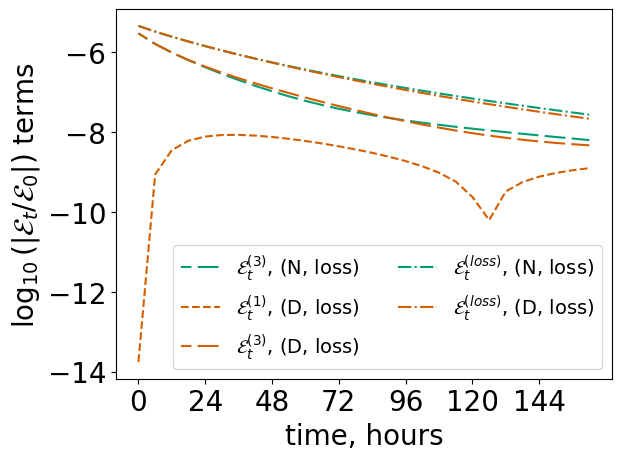

In [ ]:
# plot energy change terms, loss verions only

Mvals = find_energy_terms(psd_array_N,L_N)
Mvals2 = find_energy_terms(psd_array_D,L_D)
MLvals = find_energy_terms_inc_loss(psd_array_N_LR,L_N)
MLvals2 = find_energy_terms_inc_loss(psd_array_D_LR,L_D)

Mtots = [#Mvals[2],Mvals2[0],Mvals2[2],
         MLvals[2],MLvals2[0],MLvals2[2],MLvals[3],MLvals2[3]]
labels = [#'$\mathcal{E}_t^{(3)}$, (N)',
          #'$\mathcal{E}_t^{(1)}$, (D)',
          #'$\mathcal{E}_t^{(3)}$, (D)',
    '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$, (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)'
          ]
rundeets = [#["Neumann",'E3',[]],['Dirichlet','E1',[]],['Dirichlet','E3',[]],
    ["Neumann loss",'E3',[]],['Dirichlet loss','E1',[]],['Dirichlet loss','E3',[]],
            ["Neumann loss",'Eloss',[]],['Dirichlet loss','Eloss',[]]]



Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim,normalisation=E0)
ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Eterms_NvsD_loss_lossONLY.pdf',dpi = 600,bbox_inches='tight')


## $A$, with loss


In [ ]:
# # do the same settings as in example above
# psd_array_NA_LR,L_NA,D_NA = single_run({'A':1e6},**{'rtype':'n','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})
# psd_array_DA_LR,L_DA,D_DA = single_run({'A':1e6},**{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_NA_LR.csv",np.array(psd_array_NA_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_DA_LR.csv",np.array(psd_array_DA_LR),delimiter=",")


In [ ]:
# read them in

df = pd.read_csv('psd_array_NA_LR.csv', sep=',', header=None)
psd_array_NA_LR = df.values
df = pd.read_csv('psd_array_DA_LR.csv', sep=',', header=None)
psd_array_DA_LR = df.values


#### total mass

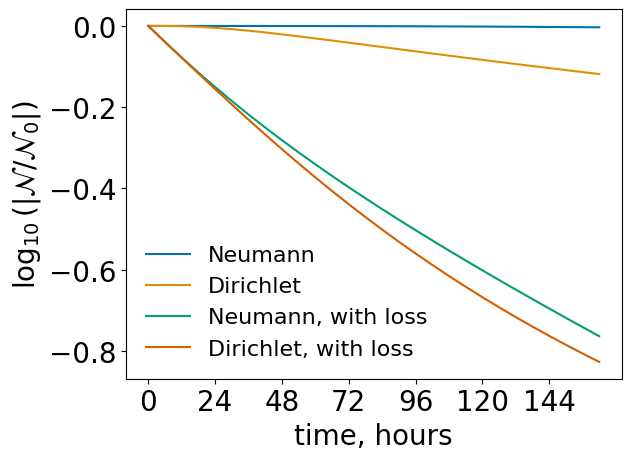

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_NA,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_NA_LR,L_N)
MvalsD = find_mass_terms(psd_array_DA,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_DA_LR,L_D)



Mtots = [MvalsN[-1],MvalsD[-1],MvalsN2[-1],MvalsD2[-1]]
labels = ['(N) $A=10^6$, no loss','(D) $A=10^6$, no loss','(N) $A = 10^6$,loss','(D) $A = 10^6, loss$']
rundeets = [["Neumann",'Ntot',[]],['Dirichlet','Ntot',[]],["Neumann loss",'Ntot',[]], ['Dirichlet loss','Ntot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')
ax.legend(['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss'],frameon=False)
fig.savefig('figs/Mtot_A_ND_loss.pdf',dpi = 600,bbox_inches='tight')

#### mass change

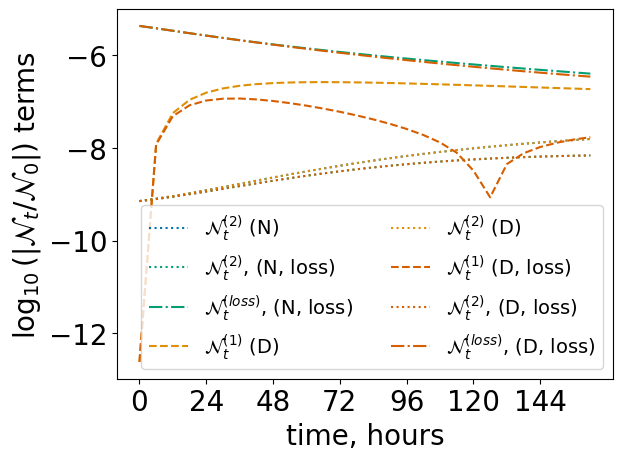

In [ ]:
# plot mass change
MvalsN = find_mass_terms(psd_array_NA,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_NA_LR,L_N)
MvalsD = find_mass_terms(psd_array_DA,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_DA_LR,L_D)

Mtots = [MvalsN[1],MvalsN2[1],MvalsN2[2],
         MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1],MvalsD2[2]]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{(loss)}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'N2',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet",'N1',[]],
  ["Dirichlet",'N2',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Nterms_A_ND_loss.pdf',dpi = 600,bbox_inches='tight')

#### total energy

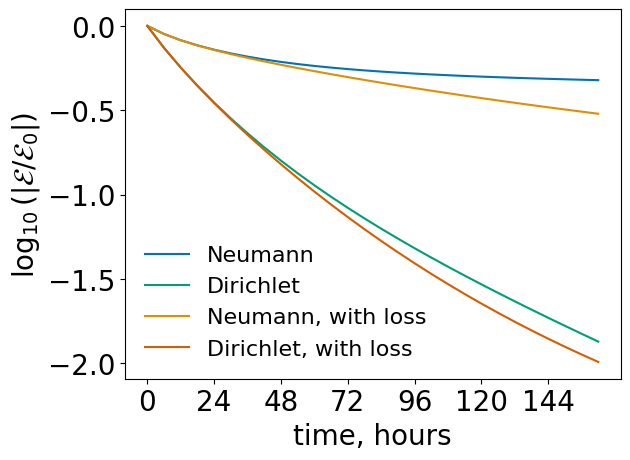

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_NA,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_NA_LR,L_N)
MvalsD = find_energy_terms(psd_array_DA,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_DA_LR,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $A=10^6$, no loss','(N) $A = 10^6$,loss','(D) $A=10^6$, no loss','(D) $A = 10^6, loss$']
rundeets = [["Neumann",'Etot',[]],["Neumann loss",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet loss','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')

ax.legend(['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss'],frameon=False)
fig.savefig('figs/Etot_A_ND_loss.pdf',dpi = 600,bbox_inches='tight')

#### energy change

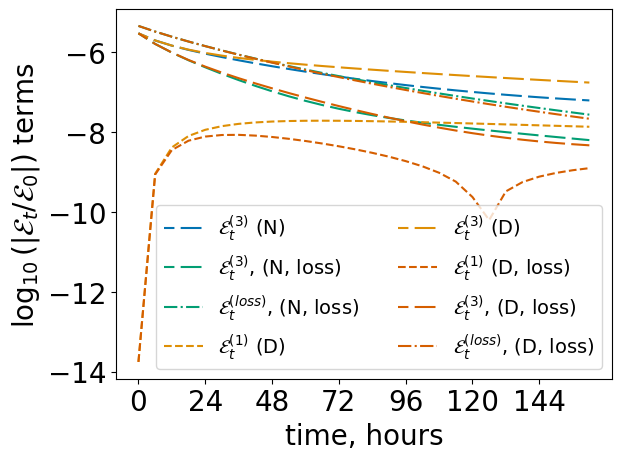

In [ ]:
# plot energy change
MvalsN = find_energy_terms(psd_array_NA,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_NA_LR,L_N)
MvalsD = find_energy_terms(psd_array_DA,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_DA_LR,L_D)

Mtots = [MvalsN[2],MvalsN2[2],MvalsN2[3],
         MvalsD[0],MvalsD[2],MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet",'E1',[]],
  ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Eterms_A_ND_loss.pdf',dpi = 600,bbox_inches='tight')

## $B$, with loss

In [ ]:
# # do the same settings as in example above
# psd_array_NB_LR,L_NB,D_NB = single_run({'B':2},**{'rtype':'n','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})
# psd_array_DB_LR,L_DB,D_DB = single_run({'B':2},**{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_NB_LR.csv",np.array(psd_array_NB_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_DB_LR.csv",np.array(psd_array_DB_LR),delimiter=",")


In [ ]:
# read them in

df = pd.read_csv('psd_array_NB_LR.csv', sep=',', header=None)
psd_array_NB_LR = df.values
df = pd.read_csv('psd_array_DB_LR.csv', sep=',', header=None)
psd_array_DB_LR = df.values


#### total mass

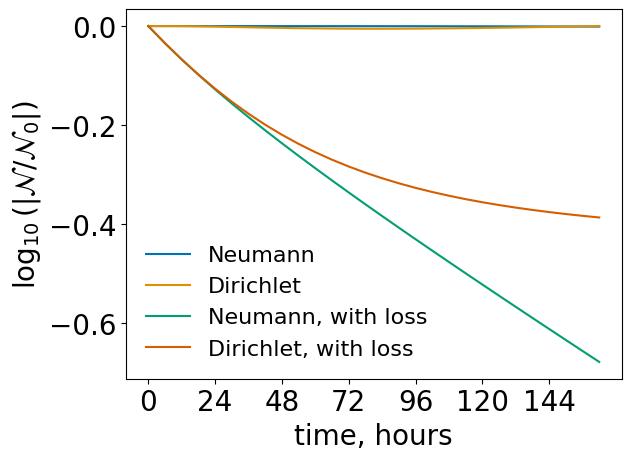

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_NB,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_NB_LR,L_N)
MvalsD = find_mass_terms(psd_array_DB,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_DB_LR,L_D)

Mtots = [MvalsN[-1],MvalsD[-1],MvalsN2[-1],MvalsD2[-1]]
labels = ['(N) $B=2$, no loss','(D) $B=2$, no loss','(N) $B=2$,loss','(D) $B=2$, loss']
rundeets = [["Neumann",'Ntot',[]],['Dirichlet','Ntot',[]],["Neumann loss",'Ntot',[]], ['Dirichlet loss','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')


fig.savefig('figs/Mtot_B_ND_loss.pdf',dpi = 600,bbox_inches='tight')

# and save with legend
ax.legend(['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss'],frameon=False)
fig.savefig('figs/Mtot_B_ND_loss_withleg.pdf',dpi = 600,bbox_inches='tight')

#### mass change

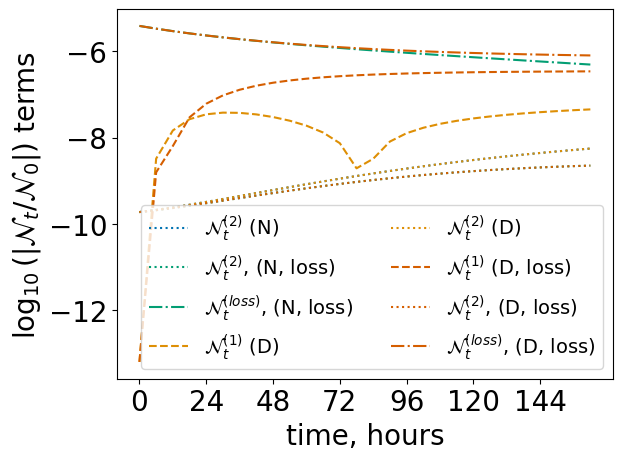

In [ ]:
# plot mass change
MvalsN = find_mass_terms(psd_array_NB,L_NB)
MvalsN2 = find_mass_terms_inc_loss(psd_array_NB_LR,L_NB)
MvalsD = find_mass_terms(psd_array_DB,L_DB)
MvalsD2 = find_mass_terms_inc_loss(psd_array_DB_LR,L_DB)

Mtots = [MvalsN[1],MvalsN2[1],MvalsN2[2],
         MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1],MvalsD2[2]]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{(loss)}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'N2',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet",'N1',[]],
  ["Dirichlet",'N2',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])

fig.savefig('figs/Nterms_B_ND_loss.pdf',dpi = 600,bbox_inches='tight')

# and save again with legend
ax.legend(ncol=2,fontsize=fsize_leg-2)
fig.savefig('figs/Nterms_B_ND_loss_withleg.pdf',dpi = 600,bbox_inches='tight')

In [ ]:
# # plot mass change
# MvalsN = find_mass_terms(psd_array_NB,L_NB)
# MvalsN2 = find_mass_terms_inc_loss(psd_array_NB_LR,L_NB)
# MvalsD = find_mass_terms(psd_array_DB,L_DB)
# MvalsD2 = find_mass_terms_inc_loss(psd_array_DB_LR,L_DB)

# Mtots = [MvalsN[1],MvalsN2[1],MvalsN2[2],
#          MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1],MvalsD2[2]]
# labels = ['$\mathcal{N}_t^{(2)}$ (N)',
#           '$\mathcal{N}_t^{(2)}$, (N, loss)',
#           '$\mathcal{N}_t^{(loss)}$, (N, loss)',
#           '$\mathcal{N}_t^{(1)}$ (D)',
#           '$\mathcal{N}_t^{(2)}$ (D)',
#           '$\mathcal{N}_t^{(1)}$ (D, loss)',
#           '$\mathcal{N}_t^{(2)}$, (D, loss)',
#           '$\mathcal{N}_t^{(loss)}$, (D, loss)',

# ]
# rundeets = [["Neumann",'N2',[]],
#  ["Neumann loss",'N2',[]],
#  ["Neumann loss",'Nloss',[]],
#   ["Dirichlet",'N1',[]],
#   ["Dirichlet",'N2',[]],
#   ["Dirichlet loss",'N1',[]],
#   ["Dirichlet loss",'N2',[]],
#   ["Dirichlet loss",'Nloss',[]]
# ]

# Mtotzip = zip(Mtots,labels,rundeets)

# time_dim = np.array(psd_array_N).shape[0]

# # plot it
# fig, ax = plot_compare_plain_mass_terms(Mtotzip,time_dim,)
# ax.legend(ncol=2,fontsize=)
# fig.savefig('figs/Nterms_B_ND_loss_plain.pdf',dpi = 600,bbox_inches='tight')

#### total energy

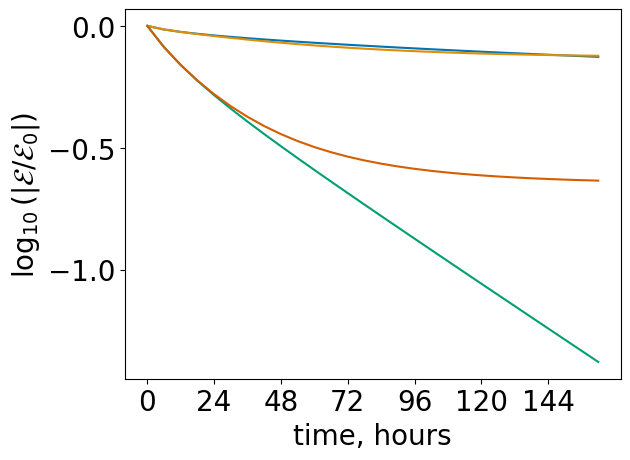

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_NB,L_NB)
MvalsN2 = find_energy_terms_inc_loss(psd_array_NB_LR,L_NB)
MvalsD = find_energy_terms(psd_array_DB,L_DB)
MvalsD2 = find_energy_terms_inc_loss(psd_array_DB_LR,L_DB)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $B=2$, no loss','(N) $B=2$,loss','(D) $B=2$, no loss','(D) $B=2$, loss']
rundeets = [["Neumann",'Etot',[]],["Neumann loss",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet loss','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')
#ax.legend(['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss'],frameon=False)
fig.savefig('figs/Etot_B_ND_loss.pdf',dpi = 600,bbox_inches='tight')

#### energy change

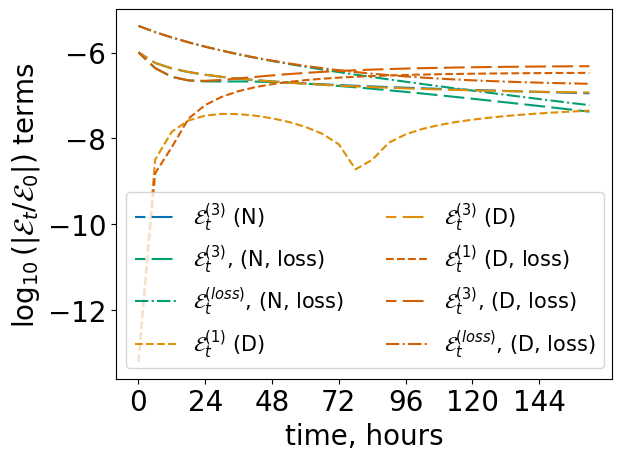

In [ ]:
# plot energy change
MvalsN = find_energy_terms(psd_array_NB,L_NB)
MvalsN2 = find_energy_terms_inc_loss(psd_array_NB_LR,L_NB)
MvalsD = find_energy_terms(psd_array_DB,L_DB)
MvalsD2 = find_energy_terms_inc_loss(psd_array_DB_LR,L_DB)

Mtots = [MvalsN[2],MvalsN2[2],MvalsN2[3],
         MvalsD[0],MvalsD[2],MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet",'E1',[]],
  ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])

fig.savefig('figs/Eterms_B_ND_loss.pdf',dpi = 600,bbox_inches='tight')

# and save again with legend
ax.legend(ncol=2,fontsize=fsize_leg-1)
fig.savefig('figs/Eterms_B_ND_loss_withleg.pdf',dpi = 600,bbox_inches='tight')

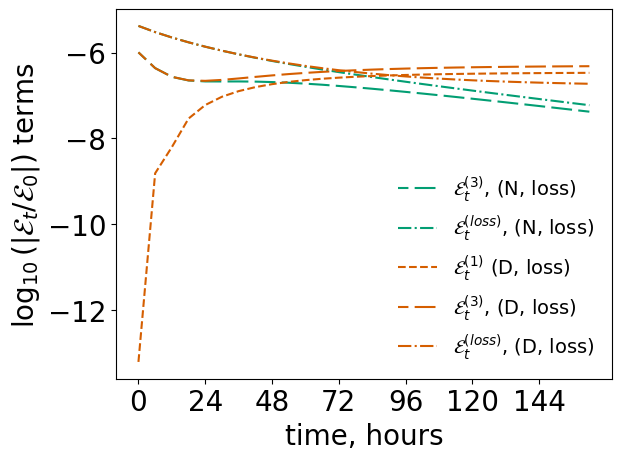

In [ ]:
# plot energy change
MvalsN = find_energy_terms(psd_array_NB,L_NB)
MvalsN2 = find_energy_terms_inc_loss(psd_array_NB_LR,L_NB)
MvalsD = find_energy_terms(psd_array_DB,L_DB)
MvalsD2 = find_energy_terms_inc_loss(psd_array_DB_LR,L_DB)

Mtots = [#MvalsN[2],
         MvalsN2[2],MvalsN2[3],
         #MvalsD[0],MvalsD[2],
         MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = [#'$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          #'$\mathcal{E}_t^{(1)}$ (D)',
          #'$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [#["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
 #["Dirichlet",'E1',[]],
 # ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(frameon=False,fontsize=14)
fig.savefig('figs/Eterms_B_ND_lossONLY.pdf',dpi = 600,bbox_inches='tight')

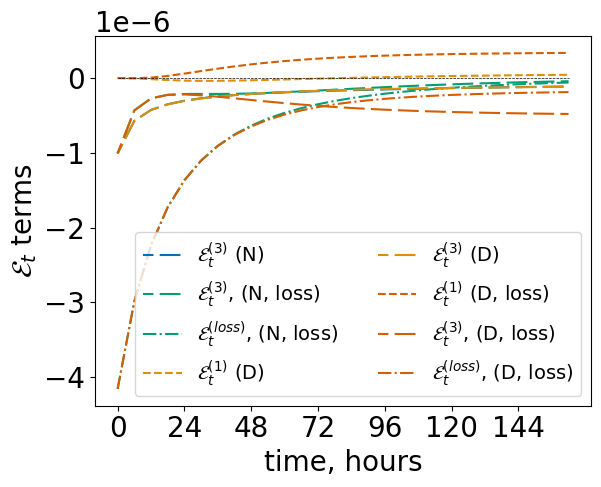

In [ ]:
# plot energy change
MvalsN = find_energy_terms(psd_array_NB,L_NB)
MvalsN2 = find_energy_terms_inc_loss(psd_array_NB_LR,L_NB)
MvalsD = find_energy_terms(psd_array_DB,L_DB)
MvalsD2 = find_energy_terms_inc_loss(psd_array_DB_LR,L_DB)

Mtots = [MvalsN[2],MvalsN2[2],MvalsN2[3],
         MvalsD[0],MvalsD[2],MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet",'E1',[]],
  ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_plain_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(ncol=2,fontsize=14)
ax.plot([0,time_dim-1],[0,0],'k',linewidth=0.5,linestyle='--')
fig.savefig('figs/Eterms_B_ND_loss_plain.pdf',dpi = 600,bbox_inches='tight')

## $\mu$, with loss

In [ ]:
# psd_array_Nmu_LR,L_N,D_Nmu_LR = single_run({'mu':5},**{'rtype':'n','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})
# psd_array_Dmu_LR,L_D,D_Dmu_LR = single_run({'mu':5},**{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_Nmu_LR.csv",np.array(psd_array_Nmu_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_Dmu_LR.csv",np.array(psd_array_Dmu_LR),delimiter=",")


In [ ]:
# read them in

df = pd.read_csv('psd_array_Nmu_LR.csv', sep=',', header=None)
psd_array_Nmu_LR = df.values
df = pd.read_csv('psd_array_Dmu_LR.csv', sep=',', header=None)
psd_array_Dmu_LR = df.values


#### total mass

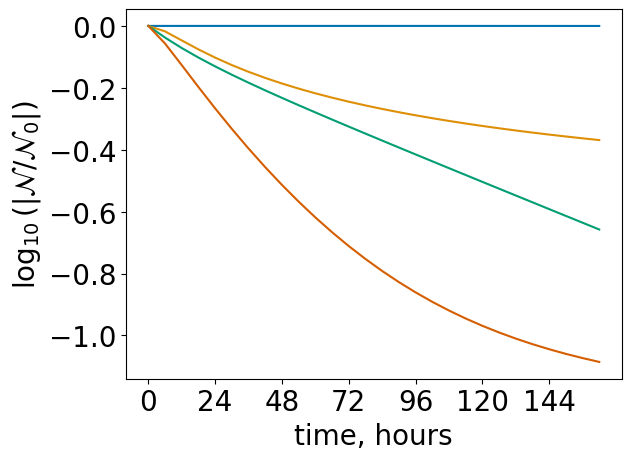

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_Nmu,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_Nmu_LR,L_N)
MvalsD = find_mass_terms(psd_array_Dmu,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_Dmu_LR,L_D)

Mtots = [MvalsN[-1],MvalsD[-1],MvalsN2[-1],MvalsD2[-1]]
labels = ['(N) $\mu=5$, no loss','(D) $\mu=5$, no loss','(N) $\mu=5$,loss','(D) $\mu=5$, loss']
rundeets = [["Neumann",'Ntot',[]],['Dirichlet','Ntot',[]],["Neumann loss",'Ntot',[]], ['Dirichlet loss','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')

#ax.legend(['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss'],frameon=False)
fig.savefig('figs/Mtot_mu_ND_loss.pdf',dpi = 600,bbox_inches='tight')

#### mass change


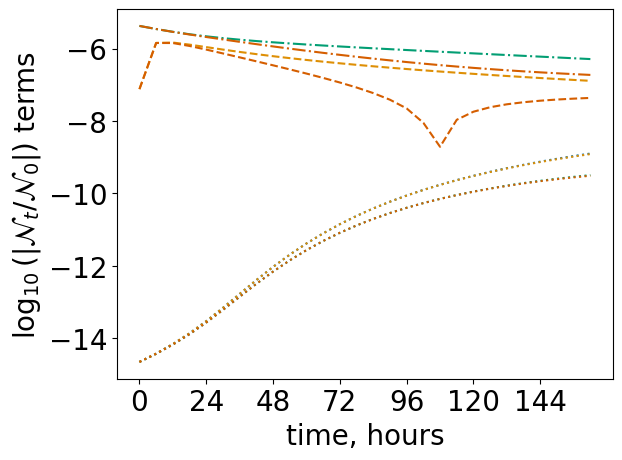

In [ ]:
# plot mass change
MvalsN = find_mass_terms(psd_array_Nmu,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_Nmu_LR,L_N)
MvalsD = find_mass_terms(psd_array_Dmu,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_Dmu_LR,L_D)

Mtots = [MvalsN[1],MvalsN2[1],MvalsN2[2],
         MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1],MvalsD2[2]]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{(loss)}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'N2',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet",'N1',[]],
  ["Dirichlet",'N2',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Nterms_mu_ND_loss.pdf',dpi = 600,bbox_inches='tight')

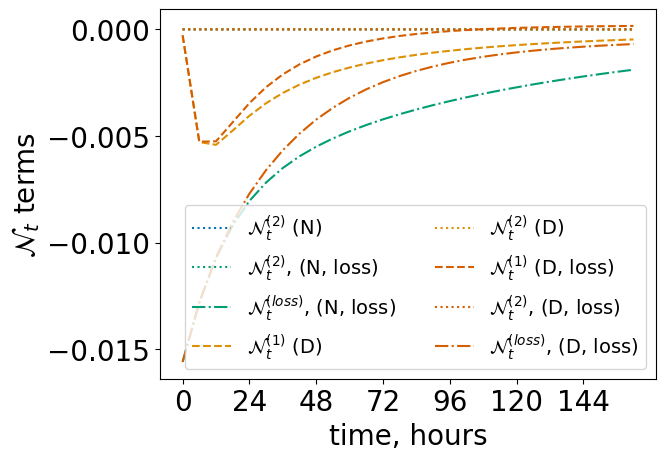

In [ ]:
# plot plain mass change
MvalsN = find_mass_terms(psd_array_Nmu,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_Nmu_LR,L_N)
MvalsD = find_mass_terms(psd_array_Dmu,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_Dmu_LR,L_D)

Mtots = [MvalsN[1],MvalsN2[1],MvalsN2[2],
         MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1],MvalsD2[2]]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{(loss)}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'N2',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet",'N1',[]],
  ["Dirichlet",'N2',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_plain_mass_terms(Mtotzip,time_dim)
ax.legend(ncol=2,fontsize=14)
fig.savefig('figs/Nterms_mu_ND_loss_plain.pdf',dpi = 600,bbox_inches='tight')

#### total energy

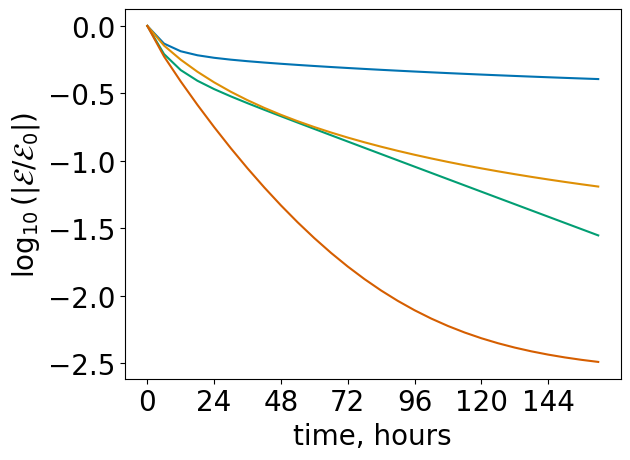

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_Nmu,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_Nmu_LR,L_N)
MvalsD = find_energy_terms(psd_array_Dmu,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_Dmu_LR,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $\mu=5$, no loss','(N) $\mu=5$,loss','(D) $\mu=5$, no loss','(D) $\mu=5$, loss']
rundeets = [["Neumann",'Etot',[]],["Neumann loss",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet loss','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')
fig.savefig('figs/Etot_mu_ND_loss.pdf',dpi = 600,bbox_inches='tight')

#### energy change

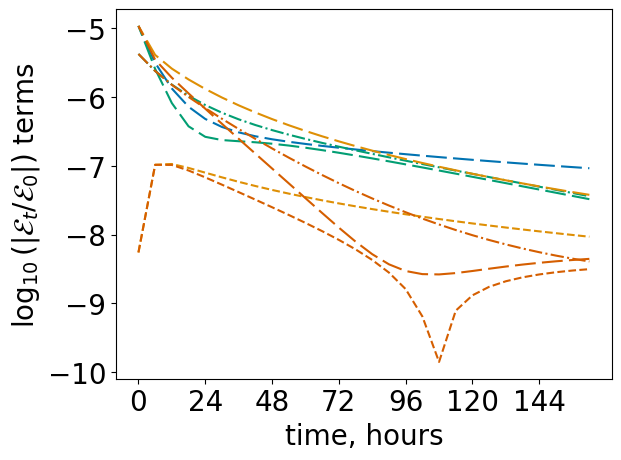

In [ ]:
# plot energy change
MvalsN = find_energy_terms(psd_array_Nmu,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_Nmu_LR,L_N)
MvalsD = find_energy_terms(psd_array_Dmu,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_Dmu_LR,L_D)

Mtots = [MvalsN[2],MvalsN2[2],MvalsN2[3],
         MvalsD[0],MvalsD[2],MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet",'E1',[]],
  ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend(fontsize=14)
ax.legend().remove()
fig.savefig('figs/Eterms_mu_ND_loss.pdf',dpi = 600,bbox_inches='tight')

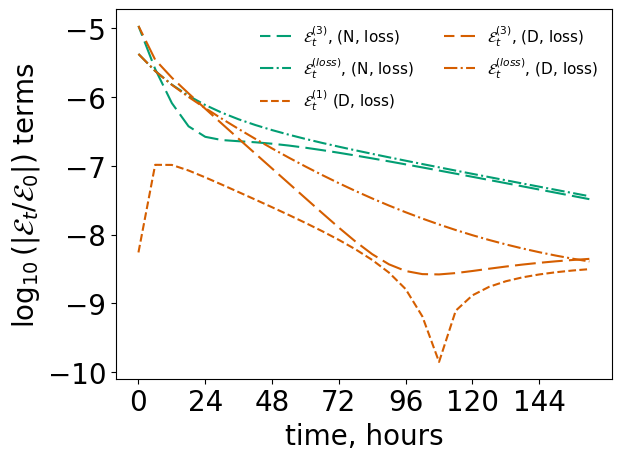

In [ ]:
# plot energy change; lossy onlty
MvalsN = find_energy_terms(psd_array_Nmu,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_Nmu_LR,L_N)
MvalsD = find_energy_terms(psd_array_Dmu,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_Dmu_LR,L_D)

Mtots = [#MvalsN[2],
         MvalsN2[2],MvalsN2[3],
         #MvalsD[0],MvalsD[2],
         MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = [#'$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          #'$\mathcal{E}_t^{(1)}$ (D)',
          #'$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [#["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
 # ["Dirichlet",'E1',[]],
 # ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(fontsize=11,ncols=2,frameon=False)
fig.savefig('figs/Eterms_mu_ND_lossONLY.pdf',dpi = 600,bbox_inches='tight')

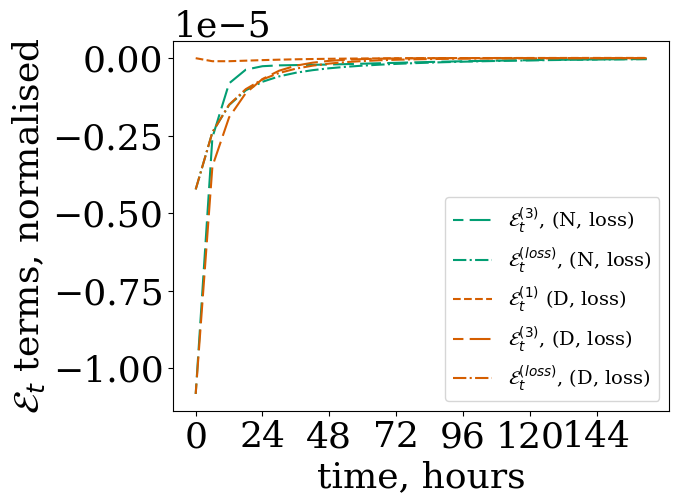

In [ ]:
# plot energy change, loss only, (plain)
MvalsN = find_energy_terms(psd_array_Nmu,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_Nmu_LR,L_N)
MvalsD = find_energy_terms(psd_array_Dmu,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_Dmu_LR,L_D)

Mtots = [#MvalsN[2],
         MvalsN2[2],MvalsN2[3],
         #MvalsD[0],MvalsD[2],
         MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = [#'$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          #'$\mathcal{E}_t^{(1)}$ (D)',
          #'$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [#["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
 # ["Dirichlet",'E1',[]],
 # ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_plain_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(fontsize=14)
ax.set_ylabel('$\mathcal{E}_t$ terms, normalised')
#ax.set_ylim([0,1e-8])
fig.savefig('figs/Eterms_mu_ND_loss_plain.pdf',dpi = 600,bbox_inches='tight')

## $\sigma$, with loss


In [ ]:
# # do the same settings as in example above
# psd_array_Nsig_LR,L_Nsig,D_Nsig = single_run({'sig':0.5},**{'rtype':'n','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})
# psd_array_Dsig_LR,L_Dsig,D_Dsig = single_run({'sig':0.5},**{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_Nsig_LR.csv",np.array(psd_array_Nsig_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_Dsig_LR.csv",np.array(psd_array_Dsig_LR),delimiter=",")


In [ ]:
# read in the run above
df = pd.read_csv('psd_array_Nsig_LR.csv', sep=',', header=None)
psd_array_Nsig_LR = df.values
df = pd.read_csv('psd_array_Dsig_LR.csv', sep=',', header=None)
psd_array_Dsig_LR = df.values


### total mass

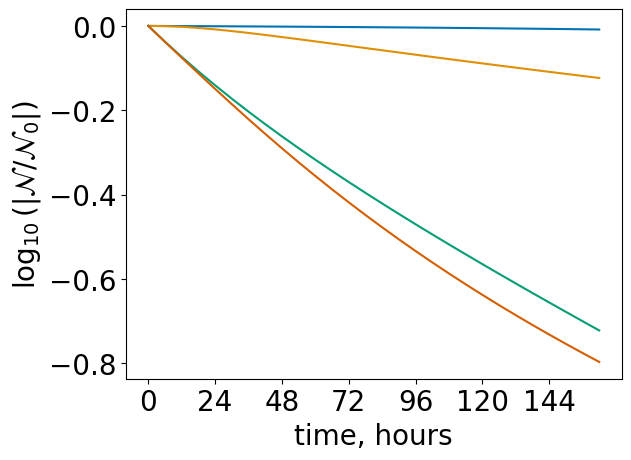

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_Nsig,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_Nsig_LR,L_N)
MvalsD = find_mass_terms(psd_array_Dsig,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_Dsig_LR,L_D)


Mtots = [MvalsN[-1],MvalsD[-1],MvalsN2[-1],MvalsD2[-1]]
labels = ['(N) $\sigma=0.5$, no loss','(D) $\sigma=0.5$, no loss','(N) $\sigma=0.5$,loss','(D) $\sigma=0.5$, loss']
rundeets = [["Neumann",'Ntot',[]],['Dirichlet','Ntot',[]],["Neumann loss",'Ntot',[]], ['Dirichlet loss','Ntot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation= MvalsN[-1][0])

#ax.legend(['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss'],frameon=False)
fig.savefig('figs/Mtot_sig_ND_loss.pdf',dpi = 600,bbox_inches='tight')

### mass change

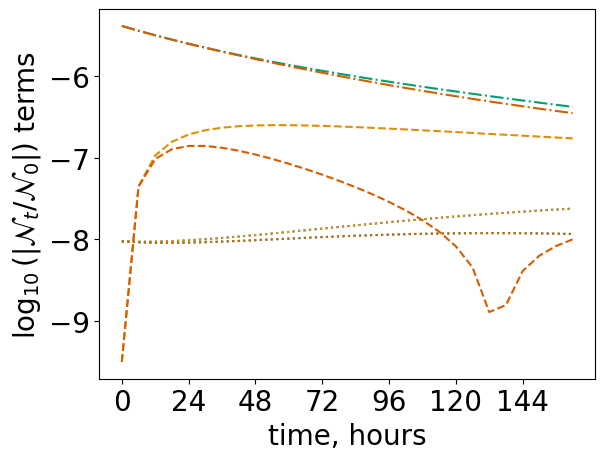

In [ ]:
# plot mass change
MvalsN = find_mass_terms(psd_array_Nsig,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_Nsig_LR,L_N)
MvalsD = find_mass_terms(psd_array_Dsig,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_Dsig_LR,L_D)

Mtots = [MvalsN[1],MvalsN2[1],MvalsN2[2],
         MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1],MvalsD2[2]]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{(loss)}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'N2',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet",'N1',[]],
  ["Dirichlet",'N2',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend(fontsize=14)
fig.savefig('figs/Nterms_sig_ND_loss.pdf',dpi = 600,bbox_inches='tight')

### total energy

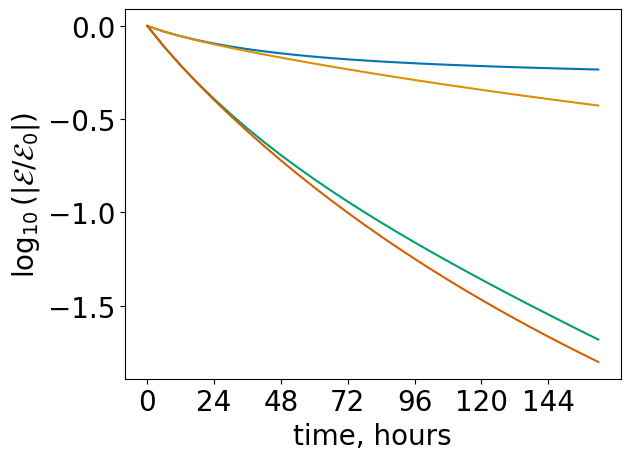

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_Nsig,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_Nsig_LR,L_N)
MvalsD = find_energy_terms(psd_array_Dsig,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_Dsig_LR,L_D)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $\sigma=0.5$, no loss','(N) $\sigma=0.5$,loss','(D) $\sigma=0.5$, no loss','(D) $\sigma=0.5$, loss']
rundeets = [["Neumann",'Etot',[]],["Neumann loss",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet loss','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')
fig.savefig('figs/Etot_sig_ND_loss.pdf',dpi = 600,bbox_inches='tight')

### energy change

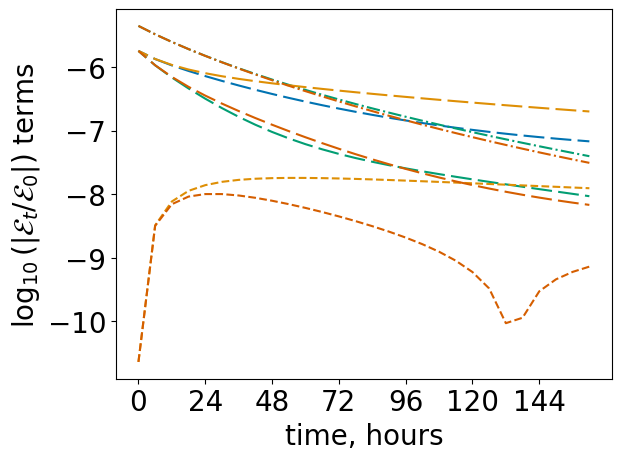

In [ ]:
# plot energy change
MvalsN = find_energy_terms(psd_array_Nsig,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_Nsig_LR,L_N)
MvalsD = find_energy_terms(psd_array_Dsig,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_Dsig_LR,L_D)

Mtots = [MvalsN[2],MvalsN2[2],MvalsN2[3],
         MvalsD[0],MvalsD[2],MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet",'E1',[]],
  ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend(fontsize=14,ncol=2)
fig.savefig('figs/Eterms_sig_ND_loss.pdf',dpi = 600,bbox_inches='tight')

## $L_{outer}$, with loss

In [ ]:
# # do the same settings as in example above
# psd_array_N_L_outer_LR,L_N_L_outer,D_N_L_outer = single_run({},**{'rtype':'n','kp':4,'L_outer':7.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})
# psd_array_D_L_outer_LR,L_D_L_outer,D_D_L_outer = single_run({},**{'rtype':'d','kp':4,'L_outer':7.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6'})

# # save these
# np.savetxt("csv-outputs/psd_array_N_L_outer_LR.csv",np.array(psd_array_N_L_outer_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_D_L_outer_LR.csv",np.array(psd_array_D_L_outer_LR),delimiter=",")



In [ ]:
# read in the run above
df = pd.read_csv('psd_array_N_L_outer_LR.csv', sep=',', header=None)
psd_array_N_L_outer_LR = df.values
df = pd.read_csv('psd_array_D_L_outer_LR.csv', sep=',', header=None)
psd_array_D_L_outer_LR = df.values



### total mass

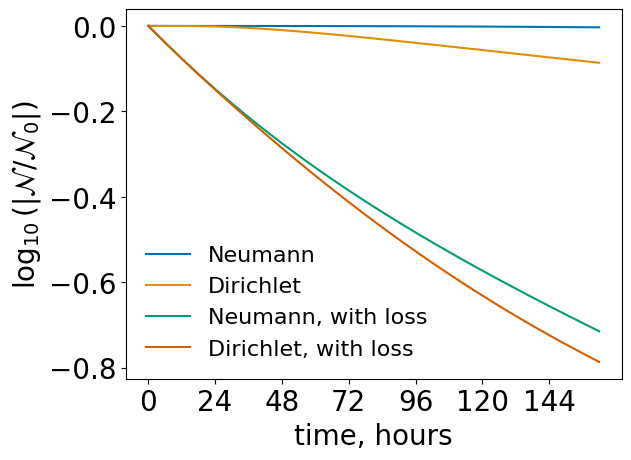

In [ ]:
# plot total mass of
MvalsN = find_mass_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_L_outer_LR,L_N_L_outer)
MvalsD = find_mass_terms(psd_array_D_L_outer,L_D_L_outer)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_L_outer_LR,L_D_L_outer)


Mtots = [MvalsN[-1],MvalsD[-1],MvalsN2[-1],MvalsD2[-1]]
labels = ['(N) $L_{outer}=7.5$, no loss','(D) $L_{outer}=7.5$, no loss','(N) $L_{outer}=7.5$,loss','(D) $L_{outer}=7.5$, loss']
rundeets = [["Neumann",'Ntot',[]],['Dirichlet','Ntot',[]],["Neumann loss",'Ntot',[]], ['Dirichlet loss','Ntot',[]]]


Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

fig.savefig('figs/Mtot_L_outer_ND_loss.pdf',dpi = 600,bbox_inches='tight')

# and save again with legend
ax.legend(['Neumann','Dirichlet','Neumann, with loss','Dirichlet, with loss'],frameon=False)
fig.savefig('figs/Mtot_L_outer_ND_loss_withleg.pdf',dpi = 600,bbox_inches='tight')

### mass change

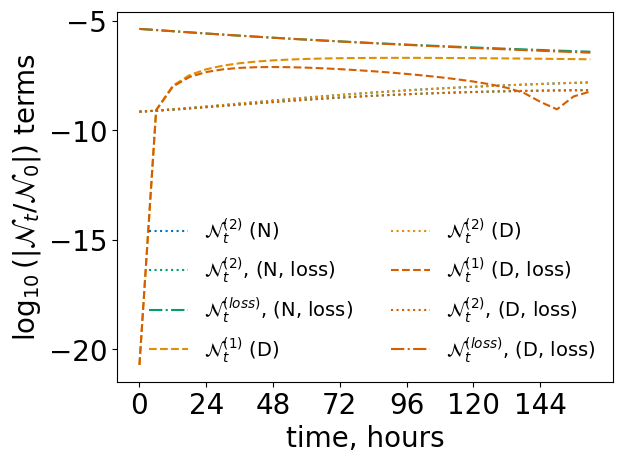

In [ ]:
# plot mass change
MvalsN = find_mass_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_L_outer_LR,L_N_L_outer)
MvalsD = find_mass_terms(psd_array_D_L_outer,L_D_L_outer)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_L_outer_LR,L_D_L_outer)

Mtots = [MvalsN[1],MvalsN2[1],MvalsN2[2],
         MvalsD[0],MvalsD[1],MvalsD2[0],MvalsD2[1],MvalsD2[2]]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, loss)',
          '$\mathcal{N}_t^{(loss)}$, (N, loss)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, loss)',
          '$\mathcal{N}_t^{(2)}$, (D, loss)',
          '$\mathcal{N}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'N2',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet",'N1',[]],
  ["Dirichlet",'N2',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])


fig.savefig('figs/Nterms_L_outer_ND_loss.pdf',dpi = 600,bbox_inches='tight')

# and save again with legend
ax.legend(ncol=2,fontsize=fsize_leg-2,frameon=False)
fig.savefig('figs/Nterms_L_outer_ND_loss_withleg.pdf',dpi = 600,bbox_inches='tight')

### total energy

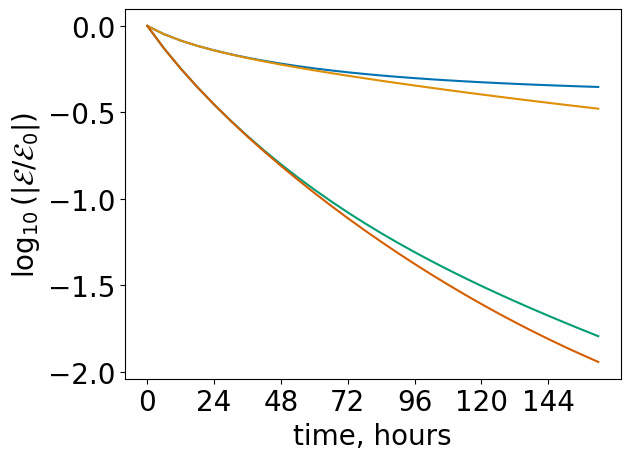

In [ ]:
# plot total energy of
MvalsN = find_energy_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_L_outer_LR,L_N_L_outer)
MvalsD = find_energy_terms(psd_array_D_L_outer,L_D_L_outer)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_L_outer_LR,L_D_L_outer)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $L_{outer}=7.5$, no loss','(N) $L_{outer}=7.5$,loss','(D) $L_{outer}=7.5$, no loss','(D) $L_{outer}=7.5$, loss']
rundeets = [["Neumann",'Etot',[]],["Neumann loss",'Etot',[]],
 ['Dirichlet','Etot',[]],['Dirichlet loss','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')
fig.savefig('figs/Etot_L_outer_ND_loss.pdf',dpi = 600,bbox_inches='tight')

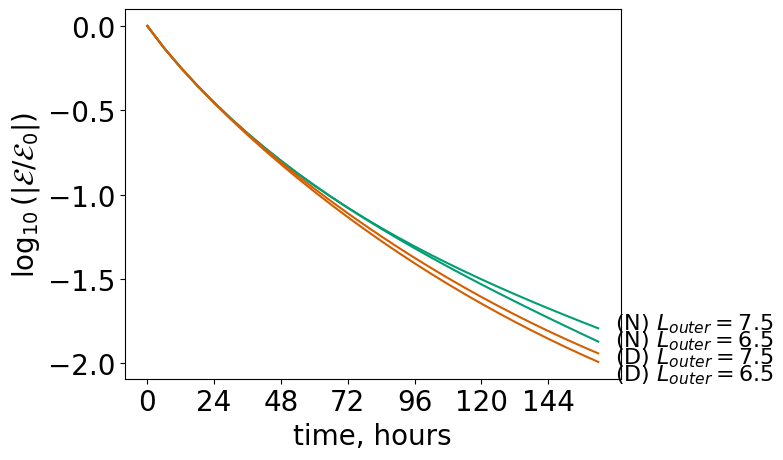

In [ ]:
# do again, for Autumn MIST
# plot total energy of
MvalsN = find_energy_terms_inc_loss(psd_array_N_LR,L_N)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_L_outer_LR,L_N_L_outer)
MvalsD = find_energy_terms_inc_loss(psd_array_D_LR,L_D)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_L_outer_LR,L_D_L_outer)


Mtots = [MvalsN[-1],MvalsN2[-1],MvalsD[-1],MvalsD2[-1]]
labels = ['(N) $L_{outer}=6.5$','(N) $L_{outer}=7.5$','(D) $L_{outer}=6.5$','(D) $L_{outer}=7.5$']
rundeets = [["Neumann loss",'Etot',[168/6,-1.9]],["Neumann loss",'Etot',[168/6,-1.8]],
 ['Dirichlet loss','Etot',[168/6, -2.1]],['Dirichlet loss','Etot',[168/6, -2.0]]]
#labels = ['(N) $L_{outer} = 6.5$','(N) $L_{outer} = 7.5$','(D) $L_{outer} = 6.5$','(D) $L_{outer} = 7.5$']
#rundeets = [["Neumann",'Etot',[72/6,np.log10(0.58)]],["Neumann",'Etot',[140/6,np.log10(0.42)]],
 #['Dirichlet','Etot',[35/6,np.log10(0.45)]],['Dirichlet','Etot',[140/6,np.log10(0.37)]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation=E0)
#ax.set_yscale('log')
#ax.legend()
#plt.rcParams.update({'font.size': 18})
fig.savefig('figs/AMIST_Etot_Louter_LR.pdf',bbox_inches='tight',dpi = 600)

### energy change


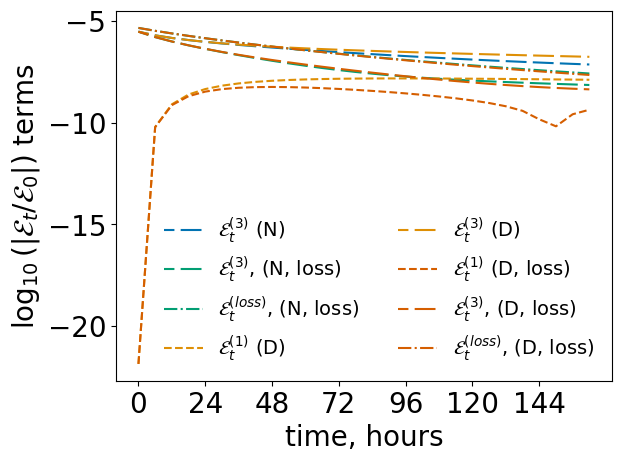

In [ ]:
# plot energy change
MvalsN = find_energy_terms(psd_array_N_L_outer,L_N_L_outer)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_L_outer_LR,L_N_L_outer)
MvalsD = find_energy_terms(psd_array_D_L_outer,L_D_L_outer)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_L_outer_LR,L_D_L_outer)

Mtots = [MvalsN[2],MvalsN2[2],MvalsN2[3],
         MvalsD[0],MvalsD[2],MvalsD2[0],MvalsD2[2],MvalsD2[3]]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(3)}$, (N, loss)',
          '$\mathcal{E}_t^{(loss)}$, (N, loss)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(1)}$ (D, loss)',
          '$\mathcal{E}_t^{(3)}$, (D, loss)',
          '$\mathcal{E}_t^{(loss)}$, (D, loss)',

]
rundeets = [["Neumann",'E3',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet",'E1',[]],
  ["Dirichlet",'E3',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])

fig.savefig('figs/Eterms_L_outer_ND_loss.pdf',dpi = 600,bbox_inches='tight')

# and save again with legend
ax.legend(ncol=2,fontsize=fsize_leg-2,frameon=False)
fig.savefig('figs/Eterms_L_outer_ND_loss_withleg.pdf',dpi = 600,bbox_inches='tight')

## $L_p=3.5,5,6$


In [ ]:
# psd_array_N_Lp3p5_LR,L_N,D_N_LR = single_run({},**{'rtype':'n','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6','Lp':3.5})
# psd_array_D_Lp3p5_LR,L_D,D_D_LR = single_run({},**{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6','Lp':3.5})

# psd_array_N_Lp6_LR,L_N,D_N_LR = single_run({},**{'rtype':'n','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6','Lp':6})
# psd_array_D_Lp6_LR,L_D,D_D_LR = single_run({},**{'rtype':'d','kp':4,'L_outer':6.5,'loss':'Shprits2007-eq4','diffcoeffs':'L^6','Lp':6})

# # save these
# np.savetxt("csv-outputs/psd_array_N_Lp3p5_LR.csv",np.array(psd_array_N_Lp3p5_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_D_Lp3p5_LR.csv",np.array(psd_array_D_Lp3p5_LR),delimiter=",")


# np.savetxt("csv-outputs/psd_array_N_Lp6_LR.csv",np.array(psd_array_N_Lp6_LR),delimiter=",")
# np.savetxt("csv-outputs/psd_array_D_Lp6_LR.csv",np.array(psd_array_D_Lp6_LR),delimiter=",")



In [ ]:
# read in the run above
df = pd.read_csv('psd_array_N_LR.csv', sep=',', header=None)
psd_array_N_LR = df.values
df = pd.read_csv('psd_array_D_LR.csv', sep=',', header=None)
psd_array_D_LR = df.values

df = pd.read_csv('psd_array_N_Lp3p5_LR.csv', sep=',', header=None)
psd_array_N_Lp3p5_LR = df.values
df = pd.read_csv('psd_array_D_Lp3p5_LR.csv', sep=',', header=None)
psd_array_D_Lp3p5_LR = df.values

df = pd.read_csv('psd_array_N_Lp6_LR.csv', sep=',', header=None)
psd_array_N_Lp6_LR = df.values
df = pd.read_csv('psd_array_D_Lp6_LR.csv', sep=',', header=None)
psd_array_D_Lp6_LR = df.values


### total mass

In [ ]:
!python reset_fonts()

/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `python reset_fonts()'


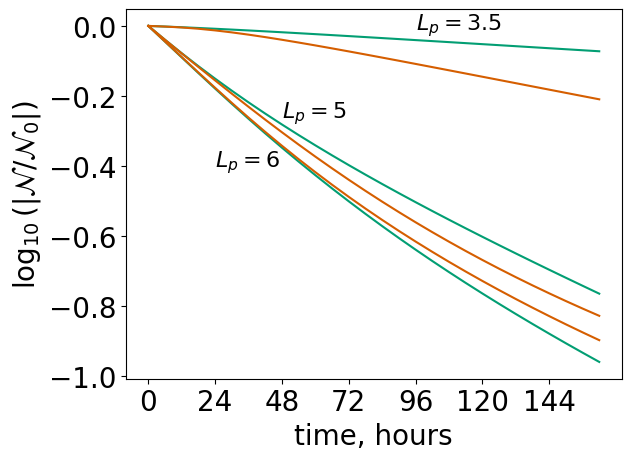

In [ ]:
reset_fonts(style='mass-energy')
# plot total mass of
MvalsN = find_mass_terms(psd_array_N_LR,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_mass_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_mass_terms(psd_array_D_LR,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_mass_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsN3[-1],MvalsD[-1],MvalsD2[-1],MvalsD3[-1]]
labels = ['(N) $L_p=5$, loss','(N) $L_p=3.5$,loss','(N) $L_p=6$, loss','(D) $L_p=5$, loss','(D) $L_p=3.5$, loss','(D) $L_p=6$, loss']
rundeets = [["Neumann loss",'Ntot',[]],["Neumann loss",'Ntot',[]],["Neumann loss",'Ntot',[]],
 ['Dirichlet loss','Ntot',[]],['Dirichlet loss','Ntot',[]],['Dirichlet loss','Ntot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig,ax = plot_compare_total_masses(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')
ax.text(96/6,-0.01,'$L_p=3.5$',size=fsize_leg)
ax.text(48/6,-0.26,'$L_p=5$',size=fsize_leg)
ax.text(24/6,-0.4,'$L_p=6$',size=fsize_leg)
fig.savefig('figs/Mtot_Lp_ND_loss_all.pdf',dpi = 600,bbox_inches='tight')

### mass change

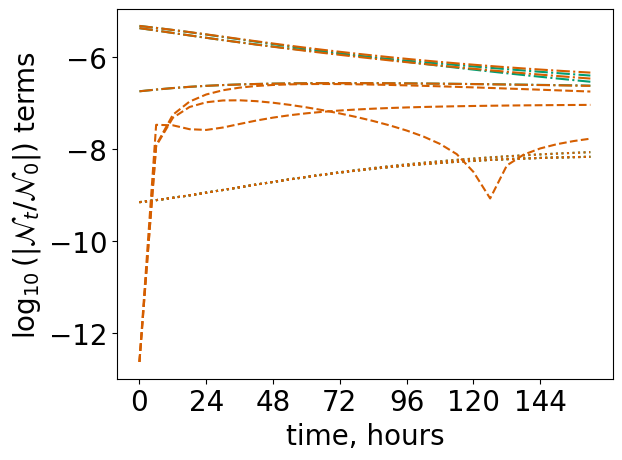

In [ ]:
# plot mass change
MvalsN = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_mass_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_mass_terms_inc_loss(psd_array_D_LR,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_mass_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [MvalsN[1],MvalsN[2],
         MvalsN2[1],MvalsN2[2],
         MvalsN3[1],MvalsN3[2],
         MvalsD[0],MvalsD[1],MvalsD[2],
         MvalsD2[0],MvalsD2[1],MvalsD2[2],
         MvalsD3[0],MvalsD3[1],MvalsD3[2]
         ]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(loss)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, $L_p=3.5$)',
          '$\mathcal{N}_t^{(loss)}$, (N, $L_p=3.5$)',
          '$\mathcal{N}_t^{(2)}$, (N, $L_p=6$)',
          '$\mathcal{N}_t^{(loss)}$, (N, $L_p=6$)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(loss)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, $L_p=3.5$)',
          '$\mathcal{N}_t^{(2)}$, (D, $L_p=3.5$)',
          '$\mathcal{N}_t^{(loss)}$, (D, $L_p=3.5$)',
          '$\mathcal{N}_t^{(1)}$ (D, $L_p=6$)',
          '$\mathcal{N}_t^{(2)}$, (D, $L_p=6$)',
          '$\mathcal{N}_t^{(loss)}$, (D, $L_p=6$)',

]
rundeets = [["Neumann loss",'N2',[]],
    ["Neumann loss",'Nloss',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend()
fig.savefig('figs/Nterms_Lp_ND_loss_all.pdf',dpi = 600,bbox_inches='tight')

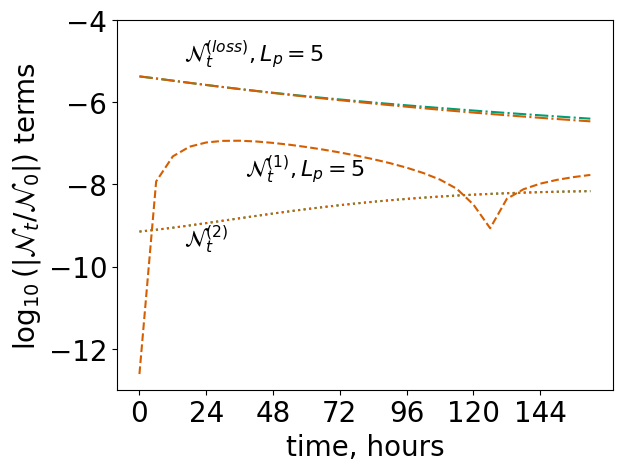

In [ ]:
# plot mass change, L = 5
MvalsN = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_mass_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_mass_terms_inc_loss(psd_array_D_LR,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_mass_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [MvalsN[1],MvalsN[2],
         #MvalsN2[1],MvalsN2[2],
         #MvalsN3[1],MvalsN3[2],
         MvalsD[0],MvalsD[1],MvalsD[2],
         #MvalsD2[0],MvalsD2[1],MvalsD2[2],
         #MvalsD3[0],MvalsD3[1],MvalsD3[2]
         ]
labels = ['$\mathcal{N}_t^{(2)}$ (N)',
          '$\mathcal{N}_t^{(loss)}$ (N)',
          #'$\mathcal{N}_t^{(2)}$, (N, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(loss)}$, (N, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(2)}$, (N, $L_p=6$)',
          #'$\mathcal{N}_t^{(loss)}$, (N, $L_p=6$)',
          '$\mathcal{N}_t^{(1)}$ (D)',
          '$\mathcal{N}_t^{(2)}$ (D)',
          '$\mathcal{N}_t^{(loss)}$ (D)',
          #'$\mathcal{N}_t^{(1)}$ (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(2)}$, (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(loss)}$, (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(1)}$ (D, $L_p=6$)',
          #'$\mathcal{N}_t^{(2)}$, (D, $L_p=6$)',
          #'$\mathcal{N}_t^{(loss)}$, (D, $L_p=6$)',

]
rundeets = [#["Neumann loss",'N2',[]],
   # ["Neumann loss",'Nloss',[]],
 #["Neumann loss",'N2',[]],
 #["Neumann loss",'Nloss',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend()
ax.text(16/6,-5,'$\mathcal{N}_t^{(loss)}, L_p=5$',size=fsize_leg)
ax.text(16/6,-9.5,'$\mathcal{N}_t^{(2)}$',size=fsize_leg)
ax.text(38/6,-7.8,'$\mathcal{N}_t^{(1)}, L_p=5$',size=fsize_leg)
ax.set_ylim([-13,-4])
fig.savefig('figs/Nterms_Lp_ND_loss_5.pdf',dpi = 600,bbox_inches='tight')

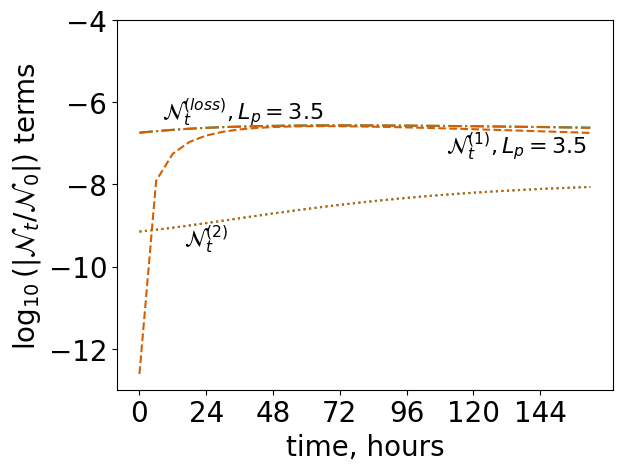

In [ ]:
# plot mass change, L = 3.5
MvalsN = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_mass_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_mass_terms_inc_loss(psd_array_D_LR,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_mass_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [#MvalsN[1],MvalsN[2],
         MvalsN2[1],MvalsN2[2],
         #MvalsN3[1],MvalsN3[2],
         #MvalsD[0],MvalsD[1],MvalsD[2],
         MvalsD2[0],MvalsD2[1],MvalsD2[2],
         #MvalsD3[0],MvalsD3[1],MvalsD3[2]
         ]
labels = [#'$\mathcal{N}_t^{(2)}$ (N)',
          #'$\mathcal{N}_t^{(loss)}$ (N)',
          '$\mathcal{N}_t^{(2)}$, (N, $L_p=3.5$)',
          '$\mathcal{N}_t^{(loss)}$, (N, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(2)}$, (N, $L_p=6$)',
          #'$\mathcal{N}_t^{(loss)}$, (N, $L_p=6$)',
          #'$\mathcal{N}_t^{(1)}$ (D)',
          #'$\mathcal{N}_t^{(2)}$ (D)',
          #'$\mathcal{N}_t^{(loss)}$ (D)',
          '$\mathcal{N}_t^{(1)}$ (D, $L_p=3.5$)',
          '$\mathcal{N}_t^{(2)}$, (D, $L_p=3.5$)',
          '$\mathcal{N}_t^{(loss)}$, (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(1)}$ (D, $L_p=6$)',
          #'$\mathcal{N}_t^{(2)}$, (D, $L_p=6$)',
          #'$\mathcal{N}_t^{(loss)}$, (D, $L_p=6$)',

]
rundeets = [#["Neumann loss",'N2',[]],
   # ["Neumann loss",'Nloss',[]],
 #["Neumann loss",'N2',[]],
 #["Neumann loss",'Nloss',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend()
ax.text(8/6,-6.4,'$\mathcal{N}_t^{(loss)}, L_p=3.5$',size=fsize_leg)
ax.text(16/6,-9.5,'$\mathcal{N}_t^{(2)}$',size=fsize_leg)
ax.text(110/6,-7.22,'$\mathcal{N}_t^{(1)}, L_p=3.5$',size=fsize_leg)
ax.set_ylim([-13,-4])
fig.savefig('figs/Nterms_Lp_ND_loss_3p5.pdf',dpi = 600,bbox_inches='tight')

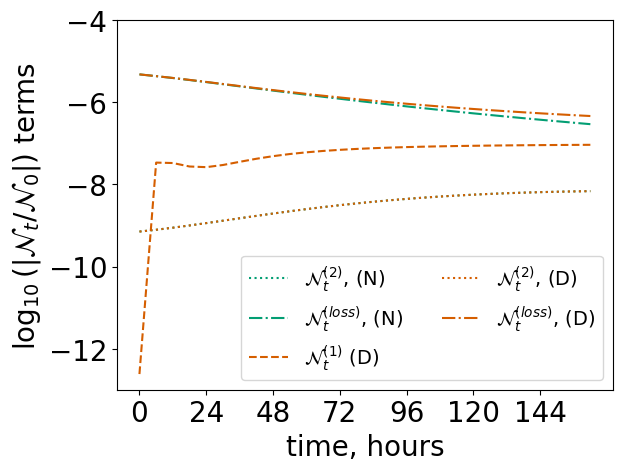

In [ ]:
# plot mass change, L = 6
MvalsN = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_mass_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_mass_terms_inc_loss(psd_array_D_LR,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_mass_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [#MvalsN[1],MvalsN[2],
         #MvalsN2[1],MvalsN2[2],
         MvalsN3[1],MvalsN3[2],
         #MvalsD[0],MvalsD[1],MvalsD[2],
         #MvalsD2[0],MvalsD2[1],MvalsD2[2],
         MvalsD3[0],MvalsD3[1],MvalsD3[2]
         ]
labels = [#'$\mathcal{N}_t^{(2)}$ (N)',
          #'$\mathcal{N}_t^{(loss)}$ (N)',
          #'$\mathcal{N}_t^{(2)}$, (N, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(loss)}$, (N, $L_p=3.5$)',
          '$\mathcal{N}_t^{(2)}$, (N)',#, $L_p=6$)',
          '$\mathcal{N}_t^{(loss)}$, (N)',#, $L_p=6$)',
          #'$\mathcal{N}_t^{(1)}$ (D)',
          #'$\mathcal{N}_t^{(2)}$ (D)',
          #'$\mathcal{N}_t^{(loss)}$ (D)',
          #'$\mathcal{N}_t^{(1)}$ (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(2)}$, (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(loss)}$, (D, $L_p=3.5$)',
          '$\mathcal{N}_t^{(1)}$ (D)',# $L_p=6$)',
          '$\mathcal{N}_t^{(2)}$, (D)',#, $L_p=6$)',
          '$\mathcal{N}_t^{(loss)}$, (D)',#, $L_p=6$)',

]
rundeets = [#["Neumann loss",'N2',[]],
   # ["Neumann loss",'Nloss',[]],
 #["Neumann loss",'N2',[]],
 #["Neumann loss",'Nloss',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(ncol=2,fontsize=14)
ax.set_ylim([-13,-4])
fig.savefig('figs/Nterms_Lp_ND_loss_6.pdf',dpi = 600,bbox_inches='tight')

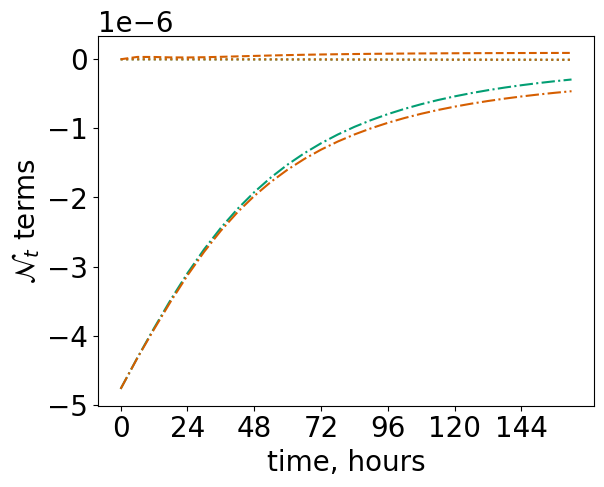

In [ ]:
# plot mass change, L = 6 PLaina
MvalsN = find_mass_terms_inc_loss(psd_array_N_LR,L_N)
MvalsN2 = find_mass_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_mass_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_mass_terms_inc_loss(psd_array_D_LR,L_D)
MvalsD2 = find_mass_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_mass_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [#MvalsN[1],MvalsN[2],
         #MvalsN2[1],MvalsN2[2],
         MvalsN3[1],MvalsN3[2],
         #MvalsD[0],MvalsD[1],MvalsD[2],
         #MvalsD2[0],MvalsD2[1],MvalsD2[2],
         MvalsD3[0],MvalsD3[1],MvalsD3[2]
         ]
labels = [#'$\mathcal{N}_t^{(2)}$ (N)',
          #'$\mathcal{N}_t^{(loss)}$ (N)',
          #'$\mathcal{N}_t^{(2)}$, (N, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(loss)}$, (N, $L_p=3.5$)',
          '$\mathcal{N}_t^{(2)}$, (N, $L_p=6$)',
          '$\mathcal{N}_t^{(loss)}$, (N, $L_p=6$)',
          #'$\mathcal{N}_t^{(1)}$ (D)',
          #'$\mathcal{N}_t^{(2)}$ (D)',
          #'$\mathcal{N}_t^{(loss)}$ (D)',
          #'$\mathcal{N}_t^{(1)}$ (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(2)}$, (D, $L_p=3.5$)',
          #'$\mathcal{N}_t^{(loss)}$, (D, $L_p=3.5$)',
          '$\mathcal{N}_t^{(1)}$ (D, $L_p=6$)',
          '$\mathcal{N}_t^{(2)}$, (D, $L_p=6$)',
          '$\mathcal{N}_t^{(loss)}$, (D, $L_p=6$)',

]
rundeets = [#["Neumann loss",'N2',[]],
   # ["Neumann loss",'Nloss',[]],
 #["Neumann loss",'N2',[]],
 #["Neumann loss",'Nloss',[]],
 ["Neumann loss",'N2',[]],
 ["Neumann loss",'Nloss',[]],
  ["Dirichlet loss",'N1',[]],
  ["Dirichlet loss",'N2',[]],
  ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]],
 # ["Dirichlet loss",'N1',[]],
 # ["Dirichlet loss",'N2',[]],
 # ["Dirichlet loss",'Nloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_plain_mass_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend()
fig.savefig('figs/Nterms_Lp_ND_loss_6_plain.pdf',dpi = 600,bbox_inches='tight')

### total energy

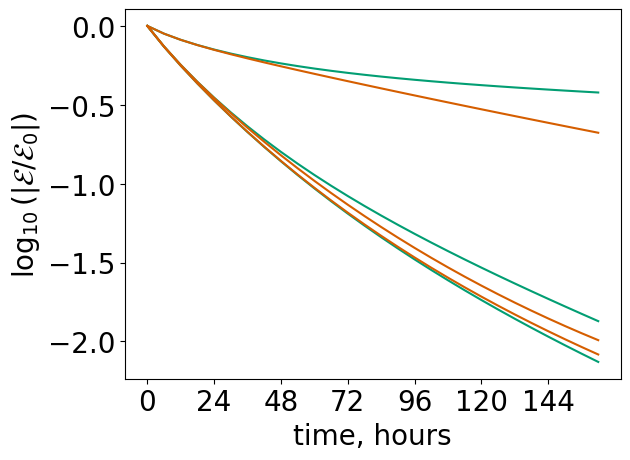

In [ ]:
# plot total energy of
MvalsN = find_energy_terms_inc_loss(psd_array_N_LR,L_N,plasmapause=5)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_energy_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_energy_terms_inc_loss(psd_array_D_LR,L_D,plasmapause=5)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_energy_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [MvalsN[-1],MvalsN2[-1],MvalsN3[-1],
         MvalsD[-1],MvalsD2[-1],MvalsD3[-1]
         ]
labels = ['(N) $L_p=5$, loss','(N) $L_p=3.5$,loss','(N) $L_p=6$,loss','(D) $L_p=5$, loss','(D) $L_p=3.5$, loss','(D) $L_p=6$,loss']
rundeets = [["Neumann loss",'Etot',[]],["Neumann loss",'Etot',[]],["Neumann loss",'Etot',[]],
 ['Dirichlet loss','Etot',[]],['Dirichlet loss','Etot',[]],['Dirichlet loss','Etot',[]]]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig,ax = plot_compare_total_energies(Mtotzip,time_dim,normalisation= MvalsN[-1][0])
#ax.set_ylim([0.9,1.3])

#ax.set_yscale('log')
fig.savefig('figs/Etot_Lp_ND_loss_all.pdf',dpi = 600,bbox_inches='tight')

### energy change

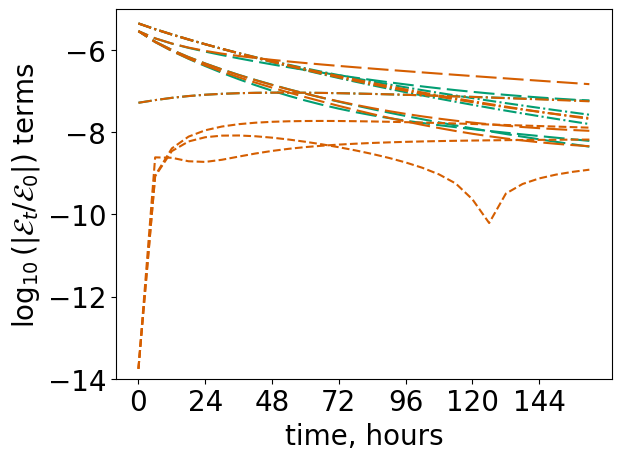

In [ ]:
# plot energy change
MvalsN = find_energy_terms_inc_loss(psd_array_N_LR,L_N,plasmapause=5)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_energy_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_energy_terms_inc_loss(psd_array_D_LR,L_D,plasmapause=5)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_energy_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [MvalsN[2],MvalsN[3],
         MvalsN2[2],MvalsN2[3],
         MvalsN3[2],MvalsN3[3],
         MvalsD[0],MvalsD[2],MvalsD[3],
         MvalsD2[0],MvalsD2[2],MvalsD2[3],
         MvalsD3[0],MvalsD3[2],MvalsD3[3]]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(loss)}$, (N)',
          '$\mathcal{E}_t^{(3)}$, (N, $L_p=3.5$)',
          '$\mathcal{E}_t^{(loss)}$, (N, $L_p=3.5$)',
          '$\mathcal{E}_t^{(3)}$, (N, $L_p=6$)',
          '$\mathcal{E}_t^{(loss)}$, (N, $L_p=6$)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(loss)}$, (D)',
          '$\mathcal{E}_t^{(1)}$ (D, $L_p=3.5$)',
          '$\mathcal{E}_t^{(3)}$, (D, $L_p=3.5$)',
          '$\mathcal{E}_t^{(loss)}$, (D, $L_p=3.5$)',
          '$\mathcal{E}_t^{(1)}$ (D, $L_p=6$)',
          '$\mathcal{E}_t^{(3)}$, (D, $L_p=6$)',
          '$\mathcal{E}_t^{(loss)}$, (D, $L_p=6$)',

]
rundeets = [["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend()
ax.set_ylim([-14,-5])
fig.savefig('figs/Eterms_Lp_ND_loss_all.pdf',dpi = 600,bbox_inches='tight')

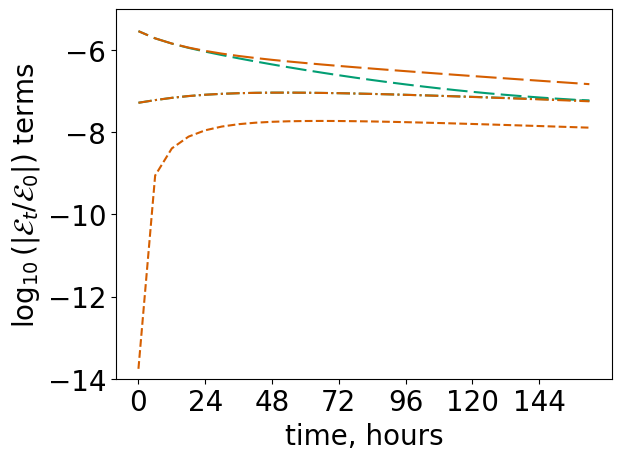

In [ ]:
# plot energy change Lp =3.5
MvalsN = find_energy_terms_inc_loss(psd_array_N_LR,L_N,plasmapause=5)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_energy_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_energy_terms_inc_loss(psd_array_D_LR,L_D,plasmapause=5)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_energy_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [#MvalsN[2],MvalsN[3],
         MvalsN2[2],MvalsN2[3],
         #MvalsN3[2],MvalsN3[3],
         #MvalsD[0],MvalsD[2],MvalsD[3],
         MvalsD2[0],MvalsD2[2],MvalsD2[3],
         #MvalsD3[0],MvalsD3[2],MvalsD3[3]
         ]
labels = [#'$\mathcal{E}_t^{(3)}$ (N)',
          #'$\mathcal{E}_t^{(loss)}$, (N)',
          '$\mathcal{E}_t^{(3)}$, (N, $L_p=3.5$)',
          '$\mathcal{E}_t^{(loss)}$, (N, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(3)}$, (N, $L_p=6$)',
          #'$\mathcal{E}_t^{(loss)}$, (N, $L_p=6$)',
          #'$\mathcal{E}_t^{(1)}$ (D)',
          #'$\mathcal{E}_t^{(3)}$ (D)',
          #'$\mathcal{E}_t^{(loss)}$, (D)',
          '$\mathcal{E}_t^{(1)}$ (D, $L_p=3.5$)',
          '$\mathcal{E}_t^{(3)}$, (D, $L_p=3.5$)',
          '$\mathcal{E}_t^{(loss)}$, (D, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(1)}$ (D, $L_p=6$)',
          #'$\mathcal{E}_t^{(3)}$, (D, $L_p=6$)',
          #'$\mathcal{E}_t^{(loss)}$, (D, $L_p=6$)',

]
rundeets = [#["Neumann loss",'E3',[]],
 #["Neumann loss",'Eloss',[]],
 #["Neumann loss",'E3',[]],
 #["Neumann loss",'Eloss',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
  #["Dirichlet loss",'E1',[]],
  #["Dirichlet loss",'E3',[]],
  #["Dirichlet loss",'Eloss',[]],
  #["Dirichlet loss",'E1',[]],
  #["Dirichlet loss",'E3',[]],
  #["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend()
ax.set_ylim([-14,-5])
fig.savefig('figs/Eterms_Lp_ND_loss_3p5.pdf',dpi = 600,bbox_inches='tight')

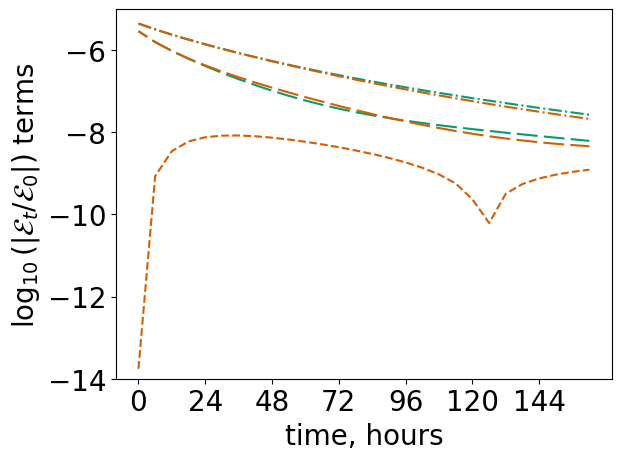

In [ ]:
# plot energy change, Lp=5
MvalsN = find_energy_terms_inc_loss(psd_array_N_LR,L_N,plasmapause=5)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_energy_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_energy_terms_inc_loss(psd_array_D_LR,L_D,plasmapause=5)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_energy_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [MvalsN[2],MvalsN[3],
         #MvalsN2[2],MvalsN2[3],
         #MvalsN3[2],MvalsN3[3],
         MvalsD[0],MvalsD[2],MvalsD[3],
         #MvalsD2[0],MvalsD2[2],MvalsD2[3],
         #MvalsD3[0],MvalsD3[2],MvalsD3[3]
         ]
labels = ['$\mathcal{E}_t^{(3)}$ (N)',
          '$\mathcal{E}_t^{(loss)}$, (N)',
          #'$\mathcal{E}_t^{(3)}$, (N, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(loss)}$, (N, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(3)}$, (N, $L_p=6$)',
          #'$\mathcal{E}_t^{(loss)}$, (N, $L_p=6$)',
          '$\mathcal{E}_t^{(1)}$ (D)',
          '$\mathcal{E}_t^{(3)}$ (D)',
          '$\mathcal{E}_t^{(loss)}$, (D)',
          #'$\mathcal{E}_t^{(1)}$ (D, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(3)}$, (D, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(loss)}$, (D, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(1)}$ (D, $L_p=6$)',
          #'$\mathcal{E}_t^{(3)}$, (D, $L_p=6$)',
          #'$\mathcal{E}_t^{(loss)}$, (D, $L_p=6$)',

]
rundeets = [#["Neumann loss",'E3',[]],
 #["Neumann loss",'Eloss',[]],
 #["Neumann loss",'E3',[]],
 #["Neumann loss",'Eloss',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
  #["Dirichlet loss",'E1',[]],
  #["Dirichlet loss",'E3',[]],
  #["Dirichlet loss",'Eloss',[]],
  #["Dirichlet loss",'E1',[]],
  #["Dirichlet loss",'E3',[]],
  #["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
#ax.legend()
ax.set_ylim([-14,-5])
fig.savefig('figs/Eterms_Lp_ND_loss_5.pdf',dpi = 600,bbox_inches='tight')

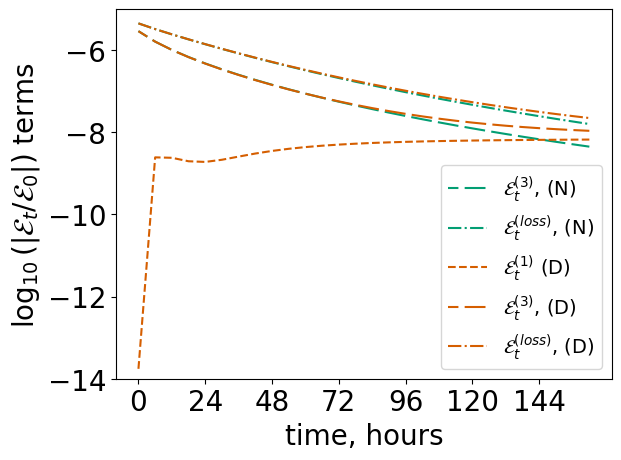

In [ ]:
# plot energy change, Lp=6
MvalsN = find_energy_terms_inc_loss(psd_array_N_LR,L_N,plasmapause=5)
MvalsN2 = find_energy_terms_inc_loss(psd_array_N_Lp3p5_LR,L_N,plasmapause=3.5)
MvalsN3 = find_energy_terms_inc_loss(psd_array_N_Lp6_LR,L_N,plasmapause=6)
MvalsD = find_energy_terms_inc_loss(psd_array_D_LR,L_D,plasmapause=5)
MvalsD2 = find_energy_terms_inc_loss(psd_array_D_Lp3p5_LR,L_D,plasmapause=3.5)
MvalsD3 = find_energy_terms_inc_loss(psd_array_D_Lp6_LR,L_D,plasmapause=6)

Mtots = [#MvalsN[2],MvalsN[3],
         #MvalsN2[2],MvalsN2[3],
         MvalsN3[2],MvalsN3[3],
        # MvalsD[0],MvalsD[2],MvalsD[3],
         #MvalsD2[0],MvalsD2[2],MvalsD2[3],
         MvalsD3[0],MvalsD3[2],MvalsD3[3]
         ]
labels = [#'$\mathcal{E}_t^{(3)}$ (N)',
          #'$\mathcal{E}_t^{(loss)}$, (N)',
          #'$\mathcal{E}_t^{(3)}$, (N, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(loss)}$, (N, $L_p=3.5$)',
          '$\mathcal{E}_t^{(3)}$, (N)',#, $L_p=6$)',
          '$\mathcal{E}_t^{(loss)}$, (N)',#, $L_p=6$)',
          #'$\mathcal{E}_t^{(1)}$ (D)',
          #'$\mathcal{E}_t^{(3)}$ (D)',
          #'$\mathcal{E}_t^{(loss)}$, (D)',
          #'$\mathcal{E}_t^{(1)}$ (D, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(3)}$, (D, $L_p=3.5$)',
          #'$\mathcal{E}_t^{(loss)}$, (D, $L_p=3.5$)',
          '$\mathcal{E}_t^{(1)}$ (D)',#, $L_p=6$)',
          '$\mathcal{E}_t^{(3)}$, (D)',# $L_p=6$)',
          '$\mathcal{E}_t^{(loss)}$, (D)',#, $L_p=6$)',

]
rundeets = [#["Neumann loss",'E3',[]],
 #["Neumann loss",'Eloss',[]],
 #["Neumann loss",'E3',[]],
 #["Neumann loss",'Eloss',[]],
 ["Neumann loss",'E3',[]],
 ["Neumann loss",'Eloss',[]],
  ["Dirichlet loss",'E1',[]],
  ["Dirichlet loss",'E3',[]],
  ["Dirichlet loss",'Eloss',[]]
  #["Dirichlet loss",'E1',[]],
  #["Dirichlet loss",'E3',[]],
  #["Dirichlet loss",'Eloss',[]],
  #["Dirichlet loss",'E1',[]],
  #["Dirichlet loss",'E3',[]],
  #["Dirichlet loss",'Eloss',[]]
]

Mtotzip = zip(Mtots,labels,rundeets)

time_dim = np.array(psd_array_N_LR).shape[0]

# plot it
fig, ax = plot_compare_energy_terms(Mtotzip,time_dim, normalisation=MvalsN[-1][0])
ax.legend(fontsize=14)
ax.set_ylim([-14,-5])
fig.savefig('figs/Eterms_Lp_ND_loss_6.pdf',dpi = 600,bbox_inches='tight')

# Example timescales

Can't use the same distributions shown in heatmaps and cutthroughs, Kp = 4, L_outer 6.5 or 7.5, with and without loss, as they don't reach monotonicity.

In [ ]:
# example timescales

# read in diff coeffs
df = pd.read_csv('D_Oz_N.csv', sep=',', header=None)
D_Oz_N = df.values.flatten()

df = pd.read_csv('D_Oz_N2.csv', sep=',', header=None)
D_Oz_N2 = df.values.flatten()

#df = pd.read_csv('D_Oz_N_LR.csv', sep=',', header=None)
#D_Oz_N_LR = df.values.flatten()

#df = pd.read_csv('D_Oz_N2_LR.csv', sep=',', header=None)
#D_Oz_N2_LR = df.values.flatten()

In [ ]:
maxDLLtime = (1/np.nanmin(D_Oz_N)) # in seconds
maxDLLtime = maxDLLtime/(60*60) # in hours

minDLLtime = (1/np.nanmax(D_Oz_N)) # in seconds
minDLLtime = minDLLtime/(60*60) # in hours

print(f"max DLL timescale using Ozeke coefficients, Kp=4, Louter=6.5 is {maxDLLtime:.1f} hours")
print(f"min DLL timescale using Ozeke coefficients, Kp=4, Louter=6.5 is {minDLLtime:.1f} hours")



maxDLLtime = (1/np.nanmin(D_Oz_N2)) # in seconds
maxDLLtime = maxDLLtime/(60*60) # in hours

minDLLtime = (1/np.nanmax(D_Oz_N2)) # in seconds
#minDLLtime = minDLLtime/(60*60) # in hours

print(f"max DLL timescale using Ozeke coefficients, Kp=4, Louter=7.5 is {maxDLLtime:.1f} hours")
print(f"min DLL timescale using Ozeke coefficients, Kp=4, Louter=7.5 is {minDLLtime:.1f} seconds")



# maxDLLtime = (1/np.nanmin(D_Oz_N_LR)) # in seconds
# maxDLLtime = maxDLLtime/(60*60) # in hours

# minDLLtime = (1/np.nanmax(D_Oz_N_LR)) # in seconds
# #minDLLtime = minDLLtime/(60*60) # in hours

# print(f"max DLL timescale using Ozeke coefficients, including loss, Kp=4, Louter=6.5 is {maxDLLtime:.1f} hours")
# print(f"min DLL timescale using Ozeke coefficients, including loss, Kp=4, Louter=6.5 is {minDLLtime:.1f} seconds")



# maxDLLtime = (1/np.nanmin(D_Oz_N2_LR)) # in seconds
# maxDLLtime = maxDLLtime/(60*60) # in hours

# minDLLtime = (1/np.nanmax(D_Oz_N2_LR)) # in seconds
# #minDLLtime = minDLLtime/(60*60) # in hours

# print(f"max DLL timescale using Ozeke coefficients, including loss, Kp=4, Louter=7.5 is {maxDLLtime:.1f} hours")
# print(f"min DLL timescale using Ozeke coefficients, including loss, Kp=4, Louter=7.5 is {minDLLtime:.1f} seconds")


max DLL timescale using Ozeke coefficients, Kp=4, Louter=6.5 is 18668.1 hours
min DLL timescale using Ozeke coefficients, Kp=4, Louter=6.5 is 9.3 hours
max DLL timescale using Ozeke coefficients, Kp=4, Louter=7.5 is 18668.1 hours
min DLL timescale using Ozeke coefficients, Kp=4, Louter=7.5 is 0.2 seconds


In [ ]:

# neumann
da = xr.open_dataset('monotonic_times_N_mu5_L_outer.nc')
tm = (da.loc[dict(kp=4,par=6.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a neumann OBC, Louter =6.5, mu at 5 is {tm:.1f} hours")

tm = (da.loc[dict(kp=4,par=7.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a neumann OBC, Louter =7.5, mu at 5 is {tm:.1f} hours")

# dirichlet
da = xr.open_dataset('monotonic_times_D_mu5_L_outer.nc')
tm = (da.loc[dict(kp=4,par=6.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a dirichlet OBC, Louter =6.5, mu at 5 is {tm:.1f} hours")

tm = (da.loc[dict(kp=4,par=7.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a dirichlet OBC, Louter =7.5, mu at 5 is {tm:.1f} hours")




# neumann, loss
da = xr.open_dataset('monotonic_times_N_mu5_L_outer_incLR.nc')
tm = (da.loc[dict(kp=4,par=6.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a neumann OBC, with loss, Louter =6.5, mu at 5 is {tm:.1f} hours")

tm = (da.loc[dict(kp=4,par=7.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a neumann OBC, with loss, Louter =7.5, mu at 5 is {tm:.1f} hours")



# dirichlet, loss
da = xr.open_dataset('monotonic_times_D_mu5_L_outer_incLR.nc')
tm = (da.loc[dict(kp=4,par=6.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a dirichlet OBC, with loss, Louter =6.5, mu at 5 is {tm:.1f} hours")

tm = (da.loc[dict(kp=4,par=7.5)].__xarray_dataarray_variable__.values)/3600
print(f"timescale for a dirichlet OBC, with loss, Louter =7.5, mu at 5 is {tm:.1f} hours")





timescale for a neumann OBC, Louter =6.5, mu at 5 is 40.0 hours
timescale for a neumann OBC, Louter =7.5, mu at 5 is 75.3 hours
timescale for a dirichlet OBC, Louter =6.5, mu at 5 is nan hours
timescale for a dirichlet OBC, Louter =7.5, mu at 5 is nan hours
timescale for a neumann OBC, with loss, Louter =6.5, mu at 5 is 24.0 hours
timescale for a neumann OBC, with loss, Louter =7.5, mu at 5 is 39.3 hours
timescale for a dirichlet OBC, with loss, Louter =6.5, mu at 5 is 92.3 hours
timescale for a dirichlet OBC, with loss, Louter =7.5, mu at 5 is 110.7 hours


# Download all the files

In [ ]:
# zip up all the csv files
!zip -r /content/csv-download.zip /content/csv-outputs/

updating: content/csv-outputs/ (stored 0%)
updating: content/csv-outputs/D_Oz_D2.csv (deflated 99%)
updating: content/csv-outputs/psd_array_Oz_D2.csv (deflated 56%)
updating: content/csv-outputs/L_D2.csv (deflated 87%)
updating: content/csv-outputs/psd_array_Oz_N2_LR.csv (deflated 56%)
updating: content/csv-outputs/psd_array_Oz_N_LR.csv (deflated 56%)
  adding: content/csv-outputs/psd_array_Oz_D_LR.csv (deflated 57%)
  adding: content/csv-outputs/psd_array_Oz_D2_LR.csv (deflated 57%)


In [ ]:
# zip up the figures
!zip -r /content/figs-download.zip /content/figs/

  adding: content/figs/ (stored 0%)
  adding: content/figs/Mtot_A_ND.pdf (deflated 40%)
